<a href="https://colab.research.google.com/github/rubygitflow/Glossary-extraction/blob/main/University_of_Artificial_Intelligence_Glossary_extraction_Final_Experiments_2020_v_0_10_12_08.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Glossary extraction. The part-of-speech way. 
# Multiple Inputs: Lexemes, parts of speech, morphological features, alphabet.
**The research project**

Осуществлена правка разметки текста. Реализована постобработка результатов сегментации.

https://www.pyimagesearch.com/2019/02/04/keras-multiple-inputs-and-mixed-data/ 

# **Service data**

In [211]:
!nvidia-smi

Tue Dec  8 17:43:16 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.45.01    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0    32W / 250W |   6703MiB / 16280MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Ссылки на файлы данных:

База_словарей_train_6.docx : https://drive.google.com/file/d/13QKXApDf8q8R_BYviX1J80BCJXUOlZUw/view?usp=sharing

База_словарей_test_6.docx : https://drive.google.com/file/d/19a1rOu6NuAb-Y_HrHhN7Ssg_ZvxTXHhH/view?usp=sharing

База_словарей_train_6.xml : https://drive.google.com/file/d/16lNQFww1QyYRxr8S4OsA2THypqxLQOra/view?usp=sharing

База_словарей_test_6.xml : https://drive.google.com/file/d/1-9fG7sdiZnjkarvitPYgX9PFt95eErPi/view?usp=sharing


In [212]:
color_meaning = {'00ffff':'термин', 'ffff00':'связка', '00ff00':'определение', 'd3d3d3':'расшифровка', 
                 'ff00ff':'дубль-термин', 'ff0000':'дубль-связка', '808000':'дубль-определение', '0000ff':'дубль-расшифровка',
                 'cyan':'термин','yellow':'связка','green':'определение', 'lightgray':'расшифровка',	                 
                 'magenta':'дубль-термин', 'red':'дубль-связка','darkyellow':'дубль-определение', 'blue':'дубль-расшифровка'}

                 #создаем словарь соответствий цвет-значение   

In [213]:
color_dic = {'термин':0,'связка':1,'определение':2,'расшифровка':3,
			       'дубль-термин':4,'дубль-связка':5,'дубль-определение':6,'дубль-расшифровка':7}
dic_color = {value:key for key, value in color_dic.items()}

zero_symbol = 'o'

colors_count = len(color_dic) + 1 # количество уникальных тегов (не забываем про тег отсутствия класса для разметки)

skip_amount = colors_count  # кол-во пропускаемых строк под легенду при считывании данных (здесь учитывается, что есть пусая строка, в списке тегов последнее значение используется под отсутствующий класс для разметки)

In [214]:
colors_count

9

In [215]:
# названия необходимых тегов для извлекаемых категорий
r = '{http://schemas.openxmlformats.org/wordprocessingml/2006/main}r'
rpr = '{http://schemas.openxmlformats.org/wordprocessingml/2006/main}rPr'
t = '{http://schemas.openxmlformats.org/wordprocessingml/2006/main}t'
shd = '{http://schemas.openxmlformats.org/wordprocessingml/2006/main}shd'
fill = '{http://schemas.openxmlformats.org/wordprocessingml/2006/main}fill'
highlight = '{http://schemas.openxmlformats.org/wordprocessingml/2006/main}highlight'
val = '{http://schemas.openxmlformats.org/wordprocessingml/2006/main}val'

In [216]:
''' 
  Словарь для цветовой разметки разобранного текста
'''
class color:
  GREY    = '\33[90m'
  RED2    = '\33[91m'
  GREEN2  = '\33[92m'
  YELLOW2 = '\33[93m'
  BLUE2   = '\33[94m'
  VIOLET2 = '\33[95m'
  LI_CYAN = '\33[96m'
  WHITE2  = '\33[97m'

  BLACK  = '\33[30m'
  RED    = '\33[31m'
  GREEN  = '\33[32m'
  YELLOW = '\33[33m'
  BLUE   = '\33[34m'
  VIOLET = '\33[35m'
  CYAN   = '\33[36m'
  WHITE  = '\33[37m'

  GREYBG    = '\33[100m'
  REDBG2    = '\33[101m'
  GREENBG2  = '\33[102m'
  YELLOWBG2 = '\33[103m'
  BLUEBG2   = '\33[104m'
  VIOLETBG2 = '\33[105m'
  LI_CYANBG = '\33[106m'
  WHITEBG2  = '\33[107m'

  BLACKBG  = '\33[40m'
  REDBG    = '\33[41m'
  GREENBG  = '\33[42m'
  YELLOWBG = '\33[43m'
  BLUEBG   = '\33[44m'
  VIOLETBG = '\33[45m'
  CYANBG   = '\33[46m'
  WHITEBG  = '\33[47m'


  BOLD 		  = '\33[1m'
  ITALIC 	  = '\33[3m'
  UNDERLINE = '\33[4m'

  BLINK    = '\33[5m'
  BLINK2   = '\33[6m'
  SELECTED = '\33[7m'
  END 		 = '\33[0m'
  
dic_colored_items = {0:color.LI_CYANBG+color.BLACK, 1:color.YELLOWBG2+color.BLACK, 2:color.GREENBG2+color.BLACK, 3:color.WHITEBG+color.BLACK,
			               4:color.VIOLETBG2+color.WHITE2, 5:color.REDBG2+color.WHITE2, 6:color.YELLOWBG+color.BLACK, 7:color.BLUEBG+color.WHITE2}

## Connecting libraries

In [217]:
!pip install pymorphy2

In [218]:
!pip install polyglot
# https://github.com/aboSamoor/polyglot/issues/152
!pip install PyICU
!pip install pycld2
!pip install morfessor

In [219]:
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model # Импортируем модели keras
from tensorflow.keras.layers import Input, Dense, Embedding, Flatten, concatenate, Activation, MaxPooling1D, Conv1D, concatenate  # Импортируем стандартные слои keras
from tensorflow.keras.layers import Dropout, BatchNormalization, Conv2DTranspose, Lambda, LSTM, GRU, Bidirectional, GlobalMaxPool1D # Импортируем стандартные слои keras
from tensorflow.keras.layers import SpatialDropout1D 
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras import backend as K # Импортируем модуль backend keras'а
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras import utils # Импортируем модуль utils библиотеки tensorflow.keras для получения OHE-представления
from tensorflow.keras.metrics import AUC

from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt 
import collections
%matplotlib inline
import numpy as np 
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report # статистика точности предсказания по классам
import random
import datetime
import time

import xml.etree.ElementTree as ET

import re # https://habr.com/ru/post/349860/
import pymorphy2 # https://pymorphy2.readthedocs.io/en/latest/user/guide.html
import polyglot # https://polyglot.readthedocs.io/en/latest/
from polyglot.detect import Detector # https://polyglot.readthedocs.io/en/latest/Detection.html
from textblob import TextBlob # https://textblob.readthedocs.io/en/latest/quickstart.html
# import nltk
# from nltk import pos_tag # https://stackoverflow.com/questions/15388831/what-are-all-possible-pos-tags-of-nltk

import os # Импортируем библиотеку для работы с файловой системой
from google.colab import files # Импортируем Модуль для работы с файлами
from google.colab import drive # Подключаем гугл-диск

from sklearn.metrics import roc_curve, roc_auc_score

In [220]:
import nltk
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [221]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [222]:
morph = pymorphy2.MorphAnalyzer()

## Library of local Functions

In [223]:
'''
  Сервиcная функция:
  Лемматизация для английского языка
  Функция предполагает разбор именно слов (без пробелов внутри текста - Это важно), 
  но лучшим оказался алгоритм лемматизации предложений
'''
# https://webdevblog.ru/podhody-lemmatizacii-s-primerami-v-python/
def textblob_lemmatize(blob):
  sent = TextBlob(blob)
  tag_dict = {"J": 'a', 
              "N": 'n', 
              "V": 'v', 
              "R": 'r'}
  words_and_tags = [(w, tag_dict.get(pos[0], 'n')) for w, pos in sent.tags]    
  lemmatized_list = [wd.lemmatize(tag) for wd, tag in words_and_tags]
  res = "".join(lemmatized_list)
  return res if res!='' else blob

In [224]:
'''
  Сервиcная функция:
  Извлечение тега для лексемы на английском
  https://www.geeksforgeeks.org/python-part-of-speech-tagging-using-textblob/
  CC coordinating conjunction
  CD cardinal digit
  DT determiner
  EX existential there (like: “there is” … think of it like “there exists”)
  FW foreign word
  IN preposition/subordinating conjunction
  JJ adjective ‘big’
  JJR adjective, comparative ‘bigger’
  JJS adjective, superlative ‘biggest’
  LS list marker 1)
  MD modal could, will
  NN noun, singular ‘desk’
  NNS noun plural ‘desks’
  NNP proper noun, singular ‘Harrison’
  NNPS proper noun, plural ‘Americans’
  PDT predeterminer ‘all the kids’
  POS possessive ending parent‘s
  PRP personal pronoun I, he, she
  PRP$ possessive pronoun my, his, hers
  RB adverb very, silently,
  RBR adverb, comparative better
  RBS adverb, superlative best
  RP particle give up
  TO to go ‘to‘ the store.
  UH interjection errrrrrrrm
  VB verb, base form take
  VBD verb, past tense took
  VBG verb, gerund/present participle taking
  VBN verb, past participle taken
  VBP verb, sing. present, non-3d take
  VBZ verb, 3rd person sing. present takes
  WDT wh-determiner which
  WP wh-pronoun who, what
  WP$ possessive wh-pronoun whose
  WRB wh-abverb where, when

  https://pymorphy2.readthedocs.io/en/latest/user/grammemes.html#russian-numbers
  Граммема	Значение	          Примеры
  sing	    единственное число	хомяк, говорит
  plur	    множественное число	хомяки, говорят
'''
def textblob_tags(blob):
  # print('textblob_tags:',blob, TextBlob(blob).tags)
  try:
    pos = TextBlob(blob).tags[0][1]
    if pos in ['NN', 'NNP']:
      numbers = 'sing'
    elif pos in ['NNS', 'NNPS']:
      numbers = 'plur'
    else:
      numbers = 'None'
  except:
    pos = 'NN'
    numbers = 'sing'

  return pos, numbers

In [225]:
'''
  Сервиcная функция:
  Назначение граммемы
  https://pymorphy2.readthedocs.io/en/latest/user/grammemes.html
'''
def define_morphy( 
  pos = 'None', animacy = 'None', aspect = 'None',
  case = 'None', gender = 'None', involvement = 'None',
  mood = 'None', number = 'None', person = 'None',
  tense = 'None', transitivity = 'None', voice = 'None'
): 
  return [str(pos), str(animacy), str(aspect), str(case), str(gender), str(involvement), 
          str(mood), str(number), str(person), str(tense), str(transitivity), str(voice)]



In [226]:
'''
  Сервиcная функция:
  Извлечение морфологических признаков лексемы 
'''
def morphyus(blob):
  # 1. язык: долюно быть - sign, en, ru, el. Другие пока не расматриваются
  # 2. С заглавной ли буквы написание слова
  # итерации по
    # 3. слово в нормальной форме
    # 4. часть речи
    # 5. всё остальное

  draw_in = lambda a: ''.join(a.split())

  
  morphy = []  
  tags = morph.parse(blob)
  # print('tags',tags)
  try:
    detector = Detector(blob)
    language = detector.language.code
    # print('language',language)
  except:
    lng_lst = str(tags[0].tag).split(',')
    # print('lng_lst',lng_lst)
    if lng_lst[0]=='UNKN':
      morphy.append('sign')
      morphy.append('true' if blob[0].isupper() else 'false')
      morphy.append(textblob_lemmatize(blob).lower())
      pos, number = textblob_tags(blob)
      morphy += define_morphy(pos = pos, number = number)         
      return morphy
    elif lng_lst[0]=='LATN':
      morphy.append('en')
      morphy.append('true' if blob[0].isupper() else 'false')
      morphy.append(textblob_lemmatize(blob).lower())
      pos, number = textblob_tags(blob)
      morphy += define_morphy(pos = pos, number = number)  
      return morphy
    elif lng_lst[0]=='NUMB':
      morphy.append('sign')
      morphy.append('false')
      morphy.append(draw_in(tags[0].normal_form)) # allways .lower()
      morphy += define_morphy(pos = 'NUMB', number = lng_lst[1])  
      return morphy
    elif lng_lst[0]=='ROMN':
      morphy.append('en')
      morphy.append('true' if blob[0].isupper() else 'false')
      morphy.append(textblob_lemmatize(blob).lower())
      pos, number = textblob_tags(blob)
      morphy += define_morphy(pos = pos, number = number)  
      # print 'ROMN' morfology
      morphy.append(draw_in(tags[0].normal_form)) # allways .lower()
      morphy += define_morphy(pos = 'ROMN')
      return morphy
    elif lng_lst[0]=='PNCT':
      morphy.append('sign')
      morphy.append('false')
      morphy.append(draw_in(tags[0].normal_form)) # allways .lower()
      morphy += define_morphy(pos = 'PNCT')  
      return morphy
    elif lng_lst[0] in ['NOUN','ADJF','ADJS','COMP','VERB','INFN','PRTF','PRTS','GRND','NUMR','ADVB','NPRO','PRED','PREP','CONJ','PRCL','INTJ']:
      language = 'ru'
    else:
      language = lng_lst[0]

  # print('language:',language, '; blob:', blob)
  if language in ['bg', 'uk', 'mn', 'ab', 'ba', 'be', 'ky', 'mk', 'ro', 'ru', 'sr', 'tk', 'tt', 'ug', 'uz', 'ug']: 
  # на самом деле плохое условие. Надо менять алгоритм работы с детектором языка - detector.language
    language = 'ru'
    morphy.append('ru')
    morphy.append('true' if blob[0].isupper() else 'false')
    for elem in tags:
      morphy.append(elem.normal_form) # allways .lower()
      morphy += define_morphy(pos = elem.tag.POS,
                              animacy = elem.tag.animacy, 
                              aspect = elem.tag.aspect,
                              case = elem.tag.case, 
                              gender = elem.tag.gender, 
                              involvement = elem.tag.involvement,
                              mood = elem.tag.mood, 
                              number = elem.tag.number,
                              person = elem.tag.person,
                              tense = elem.tag.tense,
                              transitivity = elem.tag.transitivity,
                              voice = elem.tag.voice)
  else:
    # en - ak da de gl hu la mt nl sco sl sm 
    if language != 'el':
      language = 'en'
    morphy.append(language)
    morphy.append('true' if blob[0].isupper() else 'false')
    morphy.append(textblob_lemmatize(blob).lower())
    pos, number = textblob_tags(blob)
    morphy += define_morphy(pos = pos, number = number)  
    if str(tags[0].tag)=='ROMN':
      morphy.append(tags[0].normal_form)
      morphy += define_morphy(pos = 'ROMN')

  return morphy

In [227]:
'''
  Сервиcная функция:
  Загрузка выборки заданного количества фраз из файла 
'''
def load_xml(filename, paragraphs_amount):
    test_tree = ET.parse(filename)

    test_root = test_tree.getroot()
    test_body = test_root[0]
    test_row_count = paragraphs_amount + skip_amount
    return list(iter(test_body))[:test_row_count]

In [228]:
'''
  Сервиcная функция:
  Вставка пробела в заданной позиции в строке
'''
def insert_space(text, index):
  return text[:index] + ' ' + text[index:]

In [229]:
'''
  Основная функция для подготовки обучающей выборки.
  Создаём параллельные массивы с текстом — paragraphs,
  категориями лексем — tags
  и классификацией предложений — semantics
'''
def pars_xml(ps):
    # Массивы данных по параграфам
    paragraphs = []
    tags = []
    semantics = []
    exception_amount = 0
    exception_array = []
    # Массив фактических цветов в файле исходных данных
    colors = set() # все цвета в документе
    # длина массива лексем в параграфе
    max_paragraph_len = 0  # Максимальная длина предложения
    max_paragraph_len_ind = -1  # Индекс предложения с максимальной длиной

    for i, paragraph in enumerate(ps): # проходим по всем абзацам
        z_item = [0] # массив семантических индикаторов -  наличие определительной струткуры первого и второго уровня
        if i > colors_count - 1:     # пропускаем легенду для цветовой разметки    
            phrases_list = paragraph.findall(r) # находим все фразы (часть новости)
            p_words = [] # список сущностей в абзаце
            tags_w = [] # список семантических цветов для слов в абзаце

            last_ind = len(phrases_list)-1
            for ind, phrase in enumerate(phrases_list): # проходим по всем фразам в абзаце
                words = [] # список сущностей во фразе
                y_list = [] # категории для сущностей во фразе

                try:
                  text = phrase.find(t).text # получаем текст, содержащийся во фразе

                  # 1) выделяем пробелом точку (воскл.зн., вопр.зн., двоеточние) в конце предложения
                  text_comma = text.strip()
                  len_text = len(text_comma)-1
                  if ind==last_ind and len_text>0: 
                    if text_comma[len_text] in ['.', ':', '!', '?']:
                      text_comma = insert_space(text_comma, len_text)
                    
                  # 2) выделяем пробелами символы: , { } ( ) [ ] ; « » „ “ "
                  text_comma = text_comma.replace(',', ' , ')
                  text_comma = text_comma.replace('(', ' ( ')
                  text_comma = text_comma.replace(')', ' ) ')
                  text_comma = text_comma.replace('[', ' [ ')
                  text_comma = text_comma.replace(']', ' ] ')
                  text_comma = text_comma.replace('{', ' { ')
                  text_comma = text_comma.replace('}', ' } ')
                  text_comma = text_comma.replace('"', ' " ')
                  text_comma = text_comma.replace('„', ' „ ')
                  text_comma = text_comma.replace('“', ' “ ')
                  text_comma = text_comma.replace('«', ' « ')
                  text_comma = text_comma.replace('»', ' » ')
                  text_comma = text_comma.replace(';', ' ; ')
                  text_comma = text_comma.replace('%', ' %') # вставляем пробел именно слева, но не справа
            
                  # 3) заменяем все виды пробелов одиночным пробелом #32  
                  text_comma = text_comma.replace('\xa0', '')
                  text_comma = text_comma.replace('\x301', '')
                  text_comma = text_comma.replace('\u0301', '')
                  text_comma = text_comma.replace('\ufeff', '')
                  text_comma = text_comma.replace('  ', ' ')
                  text_comma = text_comma.replace('  ', ' ')
                  text_comma = text_comma.strip()      

                  # 4) выделяем левым пробелом двоеточие (:) при одновременном выполнении условий: 
                  # после двух буквенных символов в любом алфавите и перед правым пробелом. 
                  # https://habr.com/ru/post/349860/
                  text_comma = re.sub(r'(\w\w)(:)(\s)',  r'\1 \2\3', text_comma)
                  text_comma = re.sub(r'(\w\w)(:)$',  r'\1 \2', text_comma)

                  # отделяем пробелом слова в кириллице внутри угловых скобок — <ммм> 
                  text_comma = re.sub(r'(а..я)(>)',  r'\1 \2', text_comma)
                  text_comma = re.sub(r'(<)(а..я)',  r'\1 \2', text_comma)


                  if (len(text_comma)>0):
                    style = phrase.find(rpr) # получаем стили фразы
                    
                    if style.find(shd) is not None: # если размечали через заливку
                        color = style.find(shd).attrib[fill] # получаем значение цвета заливки
                    elif style.find(highlight) is not None: # если размечали через хайлайт
                        color = style.find(highlight).attrib[val] # получаем значение цвета хайлайта
                    else:
                        color = 'white' # иных вариантов выделения в word нет, значит эта фраза не выделена (белый цвет)
                    color = color.lower() # переводим строковое значение цвета в нижний регистр
                    meaning = color_meaning[color] if color in color_meaning else '' # если есть цвет в словаре цвет-значение, то получаем значение. в противном случае у фразы значение не было выделено
                    
                    colors.add(color) # добавляем цвет в словарь всех встреченных цветов, если нужно проанализировать их
                    
                    words = text_comma.split()
                    k = len(words)
                    if meaning in color_dic: # если во фразе присутствует какая-то выделяемая сущность
                      z_item = [1] # отмечаем фразу с понятийной структурой
                      for j in range(k):
                        y_list.append(meaning) # получаем индекс позиции, соответствующей какой-то семантической(смысловой) окраске и устанавливаем по этому индексу абсолютное значение категории
                    else:
                      for j in range(k):
                        y_list.append(zero_symbol)
            
                    p_words += words  # список сущностей в параграфе
                    tags_w += y_list # список семантических цветов для слов в параграфе

                except Exception:
                  exception_amount += 1
                  exception_array.append(i)

            # print(i, p_words)
            if p_words and len(p_words)>3: # количество слов в предложении позволяет иметь в себе определительную структуру 
                                           # как минимум из 3-х слов и завершающего знака препинания
              paragraphs.append(p_words)
              tags.append(tags_w)
              semantics.append(z_item) # записываем семантику
              
            if len(p_words) >= max_paragraph_len: 
              max_paragraph_len = len(p_words)
              max_paragraph_len_ind = i - skip_amount

        if i%100==0:
            print('line',i)

    return     paragraphs, tags, colors, max_paragraph_len, max_paragraph_len_ind, exception_array, semantics

In [230]:
'''
  Графическая функция:
  Подсчёт и вывод на печать статистики о содержании категорий определительных структур в размеченных текстах
'''
def class_stat(paragraphs, tags, ext_print = False):
  classes = np.zeros((colors_count))
  len_tags = len(tags)
  print('Длина размеченной выборки:', len_tags)
  if ext_print:
    print("\nПеречень фраз со 100% разметкой:")
  for i, elem in enumerate(tags):
    if zero_symbol in elem:
      if len(set(elem))==1:
        classes[0] += 1
    else:
      if ext_print:
        print("paragraphs[{}]".format(i), '=',paragraphs[i])
        print("tags[{}]".format(i), '=',tags[i])
        print(" ")
    for item in list(color_dic.keys()):
      if item in elem:
        real_index = int(color_dic[item]) + 1
        classes[real_index] += 1
  print("\nСтатистика по классам")
  for i in range(len(classes)):
    if i==0:
      print(f'Фраз без определительных структур: {classes[0]} - {round(classes[0]*100./len_tags,2)}%')
    else:
      key=list(color_dic.keys())[list(color_dic.values()).index(i-1)] # ключ по значению
      print(f'Фраз с категорией {key}: {classes[i]} - {round(classes[i]*100./len_tags,2)}%')

In [231]:
'''
  Графическая функция:
  Построение статистических графиков по входным данным.
'''
def draw_paragraphs_stat(paragraphs):
  # https://pyprog.pro/mpl/mpl_bar.html
  counter = []
  for elem in paragraphs:
    counter.append(len(elem))

  plt.figure(figsize=(27, 5))
  plt.grid(True)
  plt.bar(range(len(paragraphs)), counter)
  plt.suptitle('Фактическое распределение длин абзацев (в лексемах)')
  plt.show()

  dic_counter = collections.Counter(counter)
  print('Collections',dic_counter)

  plt.figure(figsize=(15, 5))
  plt.grid(True)
  plt.bar(dic_counter.keys(), dic_counter.values())
  plt.suptitle('Статистика кол-ва абзацев по их длинам')
  plt.show()

  return counter, dic_counter

In [232]:
'''
  Сервисная функция:
  Сделать разметку текста цветом
'''
def tokens_to_text(x_arr, y_arr, max_len = 0):
  res = '' 
  str_len = 0
  def add_col(col, txt):
    nonlocal res, str_len
    if max_len > 0:
      next_len = len(txt)
      if str_len + next_len > max_len:
        res = res + col + '\n ' + txt
        str_len = next_len + 1
      else:
        res = res + col + ' ' + txt
        str_len += next_len + 1
    else:
      res = res + col + ' ' + txt

  for i, el in enumerate(x_arr):
    if el==0:
      break
    col_ind = y_arr[i].argmax() + 1
    add_col(tag_tokenizer_dic_color[col_ind], tokenizer.index_word[el])

  return res + color.END

In [233]:
'''
  Сервисная функция:
  Сделать цветовую разметку текста
'''
def colorize_the_text(x_arr, y_arr, max_len = 0):
  res = '' 
  str_len = 0
  def add_col(col, txt):
    nonlocal res, str_len
    if max_len > 0:
      next_len = len(txt)
      if str_len + next_len > max_len:
        res = res + col + '\n ' + txt
        str_len = next_len + 1
      else:
        res = res + col + ' ' + txt
        str_len += next_len + 1
    else:
      res = res + col + ' ' + txt

  for i, el in enumerate(x_arr):
    col_ind = y_arr[i].argmax() + 1
    add_col(tag_tokenizer_dic_color[col_ind], el)

  return res + color.END

In [234]:
'''
  Сервисная функция:
  Удалить неполные данные из массива с разметкой, полученной методом сегментации:
  — фразы без разметки;
  — один выделенный класс во фразе;
  — две лексемы на два выделенных класса.
'''
def cleansed_data(Ypred, Ytest, paragraphs):
  Ypred_res = []
  Ytest_res = []
  paragraphs_res = []
  delete = 0
  for i,phrase in enumerate(Ypred):
    uniq = set()
    all = []
    for elem in phrase:
      ind = np.argmax(elem)
      if ind>0:
        uniq.add(ind)
        all.append(ind)
    if len(uniq)>1 and len(all)>2:
      Ypred_res.append(phrase)
      Ytest_res.append(Ytest[i])
      paragraphs_res.append(paragraphs[i])
    else:
      delete += 1
  if delete>0:
    print(f'Очищено фраз: {delete}')
  return np.array(Ypred_res), np.array(Ytest_res), np.array(paragraphs_res)

# **Reading input data**

## Reading and verifying data (XML parsing). 

### Training sample

In [235]:
paragraphs_amount = 3065
ps_train = load_xml('/content/drive/My Drive/Базы/NLP/База_словарей_train_6.xml', paragraphs_amount)

In [236]:
paragraphs_train, tags_train, train_colors, max_paragraph_len, max_paragraph_len_ind, exception_array, semantics_train  = pars_xml(ps_train)
paragraphs_amount = len(paragraphs_train)  # обновляем длину массива на случай наличия в исходной базе пустых строк
paragraphs_amount, exception_array # контрольный вывод на размера принятых данных и массива индексов пустых строк

line 0
line 100
line 200
line 300
line 400
line 500
line 600
line 700
line 800
line 900
line 1000
line 1100
line 1200
line 1300
line 1400
line 1500
line 1600
line 1700
line 1800
line 1900
line 2000
line 2100
line 2200
line 2300
line 2400
line 2500
line 2600
line 2700
line 2800
line 2900
line 3000


(3065, [])

In [237]:
# Визуальный контроль правильности разбора файла
for i, elem in enumerate(paragraphs_train):
  print(i+1, elem)

1 ['Декларативное', 'программирование', '—', 'парадигма', 'программирования', ',', 'в', 'которой', 'задаётся', 'спецификация', 'решения', 'задачи', ',', 'то', 'есть', 'описывается', ',', 'что', 'представляет', 'собой', 'проблема', 'и', 'ожидаемый', 'результат', '.']
2 ['Императивное', 'программирование', '—', 'это', 'парадигма', 'программирования', '(', 'стиль', 'написания', 'исходного', 'кода', 'компьютерной', 'программы', ')', ',', 'для', 'которой', 'характерно', 'следующее', ':', 'в', 'исходном', 'коде', 'программы', 'записываются', 'инструкции', '(', 'команды', ')', ';', 'инструкции', 'должны', 'выполняться', 'последовательно', ';', 'данные', ',', 'получаемые', 'при', 'выполнении', 'предыдущих', 'инструкций', ',', 'могут', 'читаться', 'из', 'памяти', 'последующими', 'инструкциями', ';', 'данные', ',', 'полученные', 'при', 'выполнении', 'инструкции', ',', 'могут', 'записываться', 'в', 'память', '.']
3 ['Автоматический', 'словарь', '—', 'это', 'словарь', 'в', 'специальном', 'машинном

In [238]:
train_yes = 0
train_no = 0
for elem in semantics_train:
  if elem[0]==1:
    train_yes += 1
  else:
    train_no += 1
print(f"train: yes={train_yes}, no={train_no}")

train: yes=1706, no=1359


In [239]:
if len(train_colors) > colors_count:
  print('В документе цветов разметки больше допустимого')
train_colors # выведем все цвета, которые мы встретили

{'blue',
 'cyan',
 'darkyellow',
 'green',
 'lightgray',
 'magenta',
 'red',
 'white',
 'yellow'}

In [240]:
print(len(paragraphs_train))
print(len(tags_train))

print('Максимальная длина предложения — max_paragraph_len =',max_paragraph_len)
print('Индекс предложения с максимальной длиной — max_paragraph_len_ind =',max_paragraph_len_ind)

3065
3065
Максимальная длина предложения — max_paragraph_len = 120
Индекс предложения с максимальной длиной — max_paragraph_len_ind = 1596


In [241]:
# Корректируем максимальную длину предложения для использования U-net сеток
max_paragraph_len = 128

In [242]:
train_paragraphs_len = len(paragraphs_train)
print('Длина обучающей выборки:', train_paragraphs_len)

Длина обучающей выборки: 3065


**Извлекаем статистику по абзацам**

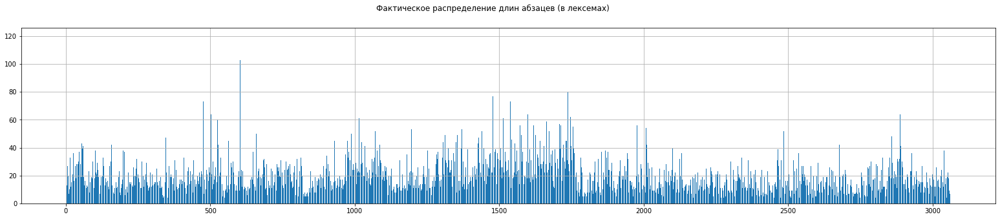

Collections Counter({13: 153, 12: 149, 15: 139, 11: 138, 19: 138, 14: 134, 10: 130, 16: 130, 9: 117, 8: 113, 18: 111, 20: 108, 17: 106, 7: 100, 22: 93, 21: 90, 23: 76, 24: 75, 26: 73, 25: 68, 5: 67, 27: 63, 6: 60, 29: 50, 30: 50, 31: 49, 28: 46, 32: 35, 4: 34, 33: 32, 37: 28, 35: 28, 36: 26, 39: 19, 38: 19, 34: 19, 42: 16, 41: 16, 40: 15, 45: 15, 43: 9, 51: 9, 47: 9, 56: 9, 52: 8, 48: 8, 44: 8, 50: 7, 49: 7, 62: 6, 46: 6, 64: 5, 53: 4, 57: 4, 73: 3, 58: 3, 54: 3, 55: 3, 61: 2, 69: 2, 72: 2, 59: 2, 65: 2, 63: 1, 60: 1, 103: 1, 75: 1, 85: 1, 83: 1, 77: 1, 79: 1, 120: 1, 76: 1, 67: 1, 80: 1, 99: 1, 88: 1, 104: 1, 70: 1})


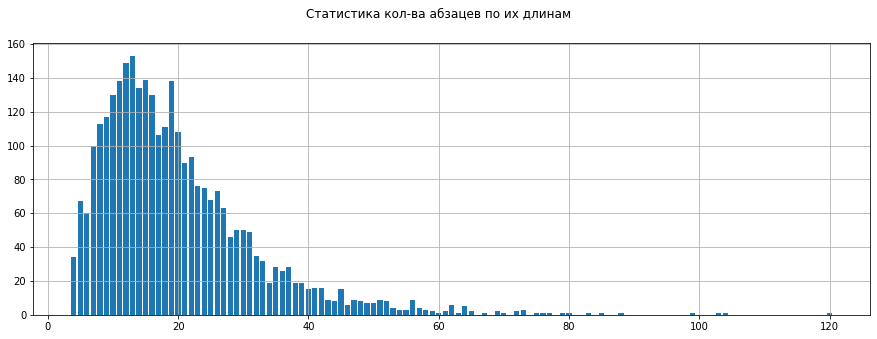

In [243]:
train_counter, train_count = draw_paragraphs_stat(paragraphs_train)

**Во скольких фразах встречается тот или  иной класс**

In [244]:
class_stat(paragraphs_train, tags_train)

Длина размеченной выборки: 3065

Статистика по классам
Фраз без определительных структур: 1359.0 - 44.34%
Фраз с категорией термин: 1692.0 - 55.2%
Фраз с категорией связка: 1659.0 - 54.13%
Фраз с категорией определение: 1627.0 - 53.08%
Фраз с категорией расшифровка: 819.0 - 26.72%
Фраз с категорией дубль-термин: 382.0 - 12.46%
Фраз с категорией дубль-связка: 275.0 - 8.97%
Фраз с категорией дубль-определение: 261.0 - 8.52%
Фраз с категорией дубль-расшифровка: 57.0 - 1.86%


### The extraction of morphological features for lexemes from the array paragraphs_train.

In [245]:
morph_train = []
for i, elem in enumerate(paragraphs_train):
  row = []
  for j,lexem in enumerate(elem):
    row.append(morphyus(lexem))
  morph_train.append(row)
  print(f'{i+1} done {j+1}!')

Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1 done 25!
2 done 62!
3 done 22!
4 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

5 done 13!
6 done 39!
7 done 27!
8 done 12!
9 done 20!
10 done 32!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

11 done 7!
12 done 14!
13 done 23!
14 done 10!
15 done 15!
16 done 33!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

17 done 36!
18 done 12!
19 done 5!
20 done 15!
21 done 14!
22 done 18!
23 done 10!
24 done 15!
25 done 21!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

26 done 42!
27 done 36!
28 done 15!
29 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

30 done 29!
31 done 17!
32 done 23!
33 done 18!
34 done 27!
35 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

36 done 18!
37 done 12!
38 done 28!
39 done 7!
40 done 20!
41 done 7!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

42 done 22!
43 done 28!
44 done 25!
45 done 30!
46 done 27!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

47 done 37!
48 done 25!
49 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

50 done 26!
51 done 8!
52 done 28!
53 done 14!
54 done 19!
55 done 8!
56 done 43!
57 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

58 done 40!
59 done 24!
60 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

61 done 41!
62 done 62!
63 done 19!
64 done 19!
65 done 13!
66 done 13!
67 done 16!
68 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

69 done 31!
70 done 27!
71 done 16!
72 done 11!
73 done 8!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

74 done 13!
75 done 13!
76 done 12!
77 done 24!
78 done 26!
79 done 19!
80 done 25!
81 done 23!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

82 done 33!
83 done 8!
84 done 12!
85 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

86 done 12!
87 done 14!
88 done 25!
89 done 10!
90 done 19!
91 done 24!
92 done 18!
93 done 9!
94 done 30!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

95 done 32!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

96 done 17!
97 done 20!
98 done 15!
99 done 11!
100 done 8!
101 done 18!
102 done 18!
103 done 38!
104 done 22!
105 done 22!
106 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

107 done 51!
108 done 21!
109 done 16!
110 done 29!
111 done 19!
112 done 24!
113 done 8!
114 done 19!
115 done 13!
116 done 23!
117 done 23!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

118 done 28!
119 done 7!
120 done 15!
121 done 13!
122 done 14!
123 done 19!
124 done 14!
125 done 13!
126 done 27!
127 done 8!
128 done 20!
129 done 21!
130 done 33!
131 done 14!
132 done 27!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

133 done 7!
134 done 5!
135 done 12!
136 done 12!
137 done 13!
138 done 10!
139 done 18!
140 done 20!
141 done 15!
142 done 64!
143 done 10!
144 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

145 done 32!
146 done 16!
147 done 9!
148 done 12!
149 done 20!
150 done 10!
151 done 13!
152 done 27!
153 done 10!
154 done 7!
155 done 18!
156 done 18!
157 done 30!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

158 done 14!
159 done 42!
160 done 13!
161 done 13!
162 done 12!
163 done 12!
164 done 9!
165 done 15!
166 done 8!
167 done 19!
168 done 7!
169 done 7!
170 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

171 done 8!
172 done 8!
173 done 14!
174 done 38!
175 done 15!
176 done 24!
177 done 11!
178 done 22!
179 done 12!
180 done 21!
181 done 11!
182 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

183 done 10!
184 done 19!
185 done 15!
186 done 23!
187 done 8!
188 done 8!
189 done 15!
190 done 6!
191 done 6!
192 done 18!
193 done 11!
194 done 12!
195 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

196 done 50!
197 done 17!
198 done 30!
199 done 38!
200 done 26!
201 done 10!
202 done 22!
203 done 15!
204 done 37!
205 done 7!
206 done 6!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

207 done 16!
208 done 10!
209 done 24!
210 done 9!
211 done 19!
212 done 22!
213 done 12!
214 done 13!
215 done 8!
216 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

217 done 22!
218 done 34!
219 done 20!
220 done 19!
221 done 40!
222 done 15!
223 done 29!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

224 done 14!
225 done 9!
226 done 15!
227 done 41!
228 done 16!
229 done 18!
230 done 39!
231 done 13!
232 done 11!
233 done 12!
234 done 7!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

235 done 26!
236 done 7!
237 done 20!
238 done 13!
239 done 31!
240 done 13!
241 done 27!
242 done 20!
243 done 13!
244 done 25!
245 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

246 done 32!
247 done 14!
248 done 14!
249 done 19!
250 done 35!
251 done 21!
252 done 27!
253 done 18!
254 done 26!
255 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

256 done 25!
257 done 18!
258 done 12!
259 done 34!
260 done 11!
261 done 16!
262 done 11!
263 done 13!
264 done 30!
265 done 10!
266 done 11!
267 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

268 done 24!
269 done 20!
270 done 7!
271 done 12!
272 done 17!
273 done 17!
274 done 19!
275 done 20!
276 done 25!
277 done 16!
278 done 21!
279 done 15!
280 done 29!
281 done 6!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

282 done 15!
283 done 11!
284 done 13!
285 done 6!
286 done 9!
287 done 9!
288 done 11!
289 done 11!
290 done 13!
291 done 12!
292 done 5!
293 done 22!
294 done 14!
295 done 12!
296 done 34!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

297 done 23!
298 done 12!
299 done 15!
300 done 21!
301 done 24!
302 done 13!
303 done 16!
304 done 17!
305 done 20!
306 done 6!
307 done 14!
308 done 14!
309 done 15!
310 done 12!
311 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

312 done 63!
313 done 30!
314 done 19!
315 done 52!
316 done 25!
317 done 15!
318 done 15!
319 done 7!
320 done 13!
321 done 8!
322 done 8!
323 done 35!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

324 done 35!
325 done 16!
326 done 19!
327 done 11!
328 done 13!
329 done 19!
330 done 18!
331 done 11!
332 done 21!
333 done 33!
334 done 12!
335 done 7!
336 done 6!
337 done 7!
338 done 4!
339 done 9!
340 done 5!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

341 done 12!
342 done 13!
343 done 35!
344 done 13!
345 done 15!
346 done 6!
347 done 47!
348 done 17!
349 done 22!
350 done 11!
351 done 32!
352 done 42!
353 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

354 done 4!
355 done 40!
356 done 11!
357 done 12!
358 done 27!
359 done 8!
360 done 9!
361 done 27!
362 done 9!
363 done 19!
364 done 5!
365 done 21!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

366 done 48!
367 done 19!
368 done 12!
369 done 26!
370 done 14!
371 done 25!
372 done 14!
373 done 26!
374 done 18!
375 done 16!
376 done 9!
377 done 11!
378 done 31!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

379 done 19!
380 done 25!
381 done 14!
382 done 12!
383 done 24!
384 done 12!
385 done 12!
386 done 14!
387 done 10!
388 done 8!
389 done 10!
390 done 10!
391 done 6!
392 done 11!
393 done 11!
394 done 14!
395 done 29!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

396 done 17!
397 done 21!
398 done 17!
399 done 20!
400 done 7!
401 done 17!
402 done 15!
403 done 14!
404 done 15!
405 done 16!
406 done 15!
407 done 17!
408 done 11!
409 done 9!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

410 done 33!
411 done 31!
412 done 15!
413 done 16!
414 done 11!
415 done 19!
416 done 33!
417 done 7!
418 done 8!
419 done 7!
420 done 5!
421 done 13!
422 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

423 done 23!
424 done 15!
425 done 26!
426 done 14!
427 done 6!
428 done 13!
429 done 8!
430 done 14!
431 done 30!
432 done 23!
433 done 13!
434 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

435 done 16!
436 done 18!
437 done 18!
438 done 15!
439 done 21!
440 done 22!
441 done 8!
442 done 16!
443 done 31!
444 done 32!
445 done 15!
446 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

447 done 17!
448 done 17!
449 done 12!
450 done 12!
451 done 22!
452 done 14!
453 done 36!
454 done 26!
455 done 6!
456 done 23!
457 done 20!
458 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

459 done 16!
460 done 29!
461 done 14!
462 done 22!
463 done 22!
464 done 20!
465 done 14!
466 done 19!
467 done 15!
468 done 12!
469 done 22!
470 done 23!
471 done 15!
472 done 21!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

473 done 28!
474 done 31!
475 done 26!
476 done 14!
477 done 73!
478 done 14!
479 done 7!
480 done 11!
481 done 17!
482 done 11!
483 done 7!
484 done 5!
485 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

486 done 10!
487 done 18!
488 done 24!
489 done 11!
490 done 21!
491 done 14!
492 done 13!
493 done 10!
494 done 17!
495 done 16!
496 done 34!
497 done 26!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

498 done 24!
499 done 22!
500 done 18!
501 done 19!
502 done 15!
503 done 19!
504 done 64!
505 done 56!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

506 done 21!
507 done 7!
508 done 10!
509 done 25!
510 done 30!
511 done 17!
512 done 17!
513 done 14!
514 done 24!
515 done 17!
516 done 16!
517 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

518 done 13!
519 done 26!
520 done 12!
521 done 19!
522 done 11!
523 done 13!
524 done 15!
525 done 17!
526 done 60!
527 done 24!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

528 done 42!
529 done 18!
530 done 27!
531 done 14!
532 done 56!
533 done 20!
534 done 23!
535 done 22!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

536 done 12!
537 done 33!
538 done 27!
539 done 13!
540 done 22!
541 done 11!
542 done 14!
543 done 4!
544 done 5!
545 done 9!
546 done 9!
547 done 6!
548 done 5!
549 done 7!
550 done 5!
551 done 4!
552 done 9!
553 done 9!
554 done 18!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

555 done 10!
556 done 11!
557 done 20!
558 done 4!
559 done 6!
560 done 8!
561 done 21!
562 done 13!
563 done 18!
564 done 45!
565 done 18!
566 done 10!
567 done 6!
568 done 10!
569 done 7!
570 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

571 done 14!
572 done 7!
573 done 29!
574 done 14!
575 done 26!
576 done 8!
577 done 37!
578 done 15!
579 done 13!
580 done 30!
581 done 19!
582 done 22!
583 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

584 done 14!
585 done 13!
586 done 33!
587 done 20!
588 done 7!
589 done 9!
590 done 19!
591 done 13!
592 done 16!
593 done 9!
594 done 21!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

595 done 19!
596 done 9!
597 done 17!
598 done 19!
599 done 10!
600 done 23!
601 done 16!
602 done 9!
603 done 19!
604 done 103!
605 done 16!
606 done 23!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

607 done 20!
608 done 7!
609 done 24!
610 done 9!
611 done 12!
612 done 26!
613 done 23!
614 done 14!
615 done 17!
616 done 10!
617 done 13!
618 done 10!
619 done 12!
620 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

621 done 12!
622 done 11!
623 done 7!
624 done 11!
625 done 16!
626 done 11!
627 done 9!
628 done 15!
629 done 6!
630 done 28!
631 done 12!
632 done 14!
633 done 17!
634 done 15!
635 done 9!
636 done 10!
637 done 10!
638 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

639 done 18!
640 done 17!
641 done 13!
642 done 13!
643 done 20!
644 done 19!
645 done 19!
646 done 15!
647 done 17!
648 done 19!
649 done 37!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

650 done 17!
651 done 14!
652 done 39!
653 done 16!
654 done 18!
655 done 24!
656 done 12!
657 done 18!
658 done 9!
659 done 21!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

660 done 50!
661 done 13!
662 done 17!
663 done 13!
664 done 24!
665 done 18!
666 done 18!
667 done 23!
668 done 15!
669 done 25!
670 done 23!
671 done 12!
672 done 8!
673 done 11!
674 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

675 done 12!
676 done 13!
677 done 6!
678 done 18!
679 done 22!
680 done 28!
681 done 23!
682 done 62!
683 done 21!
684 done 37!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

685 done 31!
686 done 48!
687 done 32!
688 done 15!
689 done 26!
690 done 36!
691 done 11!
692 done 10!
693 done 31!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

694 done 11!
695 done 14!
696 done 28!
697 done 26!
698 done 6!
699 done 9!
700 done 16!
701 done 15!
702 done 10!
703 done 16!
704 done 16!
705 done 11!
706 done 22!
707 done 13!
708 done 19!
709 done 17!
710 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

711 done 13!
712 done 25!
713 done 19!
714 done 11!
715 done 32!
716 done 23!
717 done 16!
718 done 30!
719 done 31!
720 done 17!
721 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

722 done 23!
723 done 15!
724 done 13!
725 done 21!
726 done 19!
727 done 18!
728 done 29!
729 done 32!
730 done 9!
731 done 18!
732 done 28!
733 done 26!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

734 done 26!
735 done 18!
736 done 23!
737 done 14!
738 done 23!
739 done 26!
740 done 15!
741 done 20!
742 done 15!
743 done 19!
744 done 7!
745 done 31!
746 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

747 done 13!
748 done 19!
749 done 19!
750 done 22!
751 done 14!
752 done 13!
753 done 14!
754 done 11!
755 done 25!
756 done 18!
757 done 31!
758 done 25!
759 done 24!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

760 done 14!
761 done 14!
762 done 34!
763 done 30!
764 done 25!
765 done 6!
766 done 28!
767 done 20!
768 done 24!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

769 done 18!
770 done 25!
771 done 13!
772 done 27!
773 done 26!
774 done 15!
775 done 17!
776 done 23!
777 done 28!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

778 done 24!
779 done 21!
780 done 13!
781 done 15!
782 done 12!
783 done 16!
784 done 8!
785 done 19!
786 done 11!
787 done 29!
788 done 12!
789 done 38!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

790 done 22!
791 done 27!
792 done 27!
793 done 35!
794 done 49!
795 done 8!
796 done 13!
797 done 6!
798 done 22!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

799 done 17!
800 done 43!
801 done 32!
802 done 19!
803 done 9!
804 done 10!
805 done 18!
806 done 5!
807 done 15!
808 done 12!
809 done 9!
810 done 23!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

811 done 32!
812 done 12!
813 done 14!
814 done 14!
815 done 33!
816 done 27!
817 done 27!
818 done 17!
819 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

820 done 33!
821 done 4!
822 done 7!
823 done 5!
824 done 7!
825 done 8!
826 done 5!
827 done 5!
828 done 8!
829 done 4!
830 done 5!
831 done 6!
832 done 6!
833 done 5!
834 done 5!
835 done 7!
836 done 5!
837 done 8!
838 done 5!
839 done 5!
840 done 16!
841 done 18!
842 done 18!
843 done 16!
844 done 11!
845 done 14!
846 done 8!
847 done 18!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

848 done 23!
849 done 23!
850 done 9!
851 done 12!
852 done 27!
853 done 11!
854 done 25!
855 done 16!
856 done 8!
857 done 12!
858 done 18!
859 done 13!
860 done 15!
861 done 5!
862 done 8!
863 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

864 done 19!
865 done 12!
866 done 8!
867 done 10!
868 done 8!
869 done 21!
870 done 16!
871 done 16!
872 done 14!
873 done 13!
874 done 24!
875 done 18!
876 done 12!
877 done 17!
878 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

879 done 27!
880 done 11!
881 done 13!
882 done 21!
883 done 16!
884 done 11!
885 done 18!
886 done 19!
887 done 43!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

888 done 73!
889 done 75!
890 done 10!
891 done 18!
892 done 22!
893 done 27!
894 done 35!
895 done 12!
896 done 23!
897 done 30!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

898 done 25!
899 done 30!
900 done 10!
901 done 20!
902 done 25!
903 done 30!
904 done 34!
905 done 8!
906 done 10!
907 done 15!
908 done 22!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

909 done 28!
910 done 14!
911 done 20!
912 done 17!
913 done 23!
914 done 31!
915 done 25!
916 done 21!
917 done 85!
918 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

919 done 19!
920 done 9!
921 done 16!
922 done 13!
923 done 12!
924 done 10!
925 done 20!
926 done 14!
927 done 8!
928 done 11!
929 done 15!
930 done 21!
931 done 45!
932 done 13!
933 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

934 done 13!
935 done 11!
936 done 13!
937 done 9!
938 done 11!
939 done 13!
940 done 13!
941 done 10!
942 done 18!
943 done 8!
944 done 10!
945 done 31!
946 done 24!
947 done 12!



Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to det

948 done 23!
949 done 20!
950 done 20!
951 done 17!
952 done 15!
953 done 7!
954 done 16!
955 done 17!
956 done 11!
957 done 13!
958 done 17!
959 done 17!
960 done 10!
961 done 11!
962 done 13!
963 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

964 done 22!
965 done 14!
966 done 19!
967 done 19!
968 done 53!
969 done 35!
970 done 14!
971 done 16!
972 done 34!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

973 done 32!
974 done 30!
975 done 41!
976 done 45!
977 done 16!
978 done 33!
979 done 14!
980 done 37!
981 done 29!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

982 done 18!
983 done 43!
984 done 34!
985 done 31!
986 done 30!
987 done 20!
988 done 40!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

989 done 50!
990 done 25!
991 done 36!
992 done 38!
993 done 25!
994 done 24!
995 done 35!
996 done 28!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

997 done 39!
998 done 24!
999 done 26!
1000 done 19!
1001 done 44!
1002 done 13!
1003 done 26!
1004 done 22!
1005 done 29!
1006 done 23!
1007 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1008 done 53!
1009 done 25!
1010 done 26!
1011 done 19!
1012 done 22!
1013 done 36!
1014 done 23!
1015 done 24!
1016 done 61!
1017 done 25!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1018 done 22!
1019 done 26!
1020 done 28!
1021 done 42!
1022 done 23!
1023 done 28!
1024 done 35!
1025 done 44!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1026 done 58!
1027 done 29!
1028 done 46!
1029 done 34!
1030 done 39!
1031 done 33!
1032 done 20!
1033 done 38!
1034 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1035 done 22!
1036 done 41!
1037 done 26!
1038 done 28!
1039 done 12!
1040 done 17!
1041 done 26!
1042 done 24!
1043 done 16!
1044 done 8!
1045 done 22!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1046 done 15!
1047 done 14!
1048 done 10!
1049 done 16!
1050 done 18!
1051 done 7!
1052 done 24!
1053 done 7!
1054 done 14!
1055 done 22!
1056 done 13!
1057 done 14!
1058 done 17!
1059 done 18!
1060 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1061 done 32!
1062 done 29!
1063 done 22!
1064 done 37!
1065 done 30!
1066 done 31!
1067 done 13!
1068 done 39!
1069 done 39!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1070 done 33!
1071 done 37!
1072 done 52!
1073 done 32!
1074 done 21!
1075 done 54!
1076 done 35!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1077 done 32!
1078 done 32!
1079 done 38!
1080 done 20!
1081 done 19!
1082 done 19!
1083 done 27!
1084 done 35!
1085 done 35!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1086 done 20!
1087 done 34!
1088 done 42!
1089 done 26!
1090 done 31!
1091 done 45!
1092 done 29!
1093 done 29!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1094 done 22!
1095 done 45!
1096 done 41!
1097 done 17!
1098 done 44!
1099 done 23!
1100 done 38!
1101 done 19!
1102 done 17!
1103 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1104 done 15!
1105 done 18!
1106 done 27!
1107 done 15!
1108 done 23!
1109 done 26!
1110 done 26!
1111 done 20!
1112 done 17!
1113 done 23!
1114 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1115 done 22!
1116 done 18!
1117 done 6!
1118 done 18!
1119 done 20!
1120 done 19!
1121 done 13!
1122 done 24!
1123 done 9!
1124 done 12!
1125 done 13!
1126 done 20!
1127 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1128 done 25!
1129 done 29!
1130 done 9!
1131 done 11!
1132 done 10!
1133 done 11!
1134 done 14!
1135 done 10!
1136 done 13!
1137 done 12!
1138 done 21!
1139 done 8!
1140 done 6!
1141 done 16!
1142 done 12!
1143 done 15!
1144 done 8!
1145 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1146 done 14!
1147 done 12!
1148 done 14!
1149 done 9!
1150 done 11!
1151 done 20!
1152 done 13!
1153 done 11!
1154 done 14!
1155 done 12!
1156 done 25!
1157 done 31!
1158 done 6!
1159 done 9!
1160 done 4!
1161 done 4!
1162 done 9!
1163 done 15!
1164 done 9!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1165 done 15!
1166 done 21!
1167 done 11!
1168 done 11!
1169 done 18!
1170 done 10!
1171 done 28!
1172 done 14!
1173 done 13!
1174 done 23!
1175 done 10!
1176 done 13!
1177 done 11!
1178 done 10!
1179 done 6!
1180 done 47!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1181 done 33!
1182 done 35!
1183 done 18!
1184 done 9!
1185 done 14!
1186 done 16!
1187 done 25!
1188 done 14!
1189 done 29!
1190 done 15!
1191 done 22!
1192 done 20!
1193 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1194 done 19!
1195 done 23!
1196 done 45!
1197 done 53!
1198 done 16!
1199 done 25!
1200 done 31!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1201 done 17!
1202 done 22!
1203 done 36!
1204 done 11!
1205 done 29!
1206 done 13!
1207 done 9!
1208 done 30!
1209 done 33!
1210 done 16!
1211 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1212 done 15!
1213 done 11!
1214 done 35!
1215 done 20!
1216 done 9!
1217 done 20!
1218 done 24!
1219 done 12!
1220 done 26!
1221 done 49!
1222 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1223 done 34!
1224 done 13!
1225 done 11!
1226 done 16!
1227 done 13!
1228 done 13!
1229 done 14!
1230 done 7!
1231 done 9!
1232 done 5!
1233 done 10!
1234 done 16!
1235 done 14!
1236 done 27!
1237 done 20!
1238 done 21!
1239 done 14!
1240 done 27!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1241 done 18!
1242 done 19!
1243 done 26!
1244 done 14!
1245 done 15!
1246 done 21!
1247 done 21!
1248 done 24!
1249 done 19!
1250 done 10!
1251 done 9!
1252 done 21!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1253 done 38!
1254 done 40!
1255 done 18!
1256 done 31!
1257 done 33!
1258 done 25!
1259 done 15!
1260 done 11!
1261 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1262 done 11!
1263 done 16!
1264 done 13!
1265 done 7!
1266 done 14!
1267 done 6!
1268 done 12!
1269 done 12!
1270 done 11!
1271 done 16!
1272 done 23!
1273 done 13!
1274 done 5!
1275 done 19!
1276 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1277 done 46!
1278 done 12!
1279 done 28!
1280 done 16!
1281 done 45!
1282 done 28!
1283 done 25!
1284 done 10!
1285 done 35!
1286 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1287 done 32!
1288 done 30!
1289 done 37!
1290 done 24!
1291 done 21!
1292 done 26!
1293 done 25!
1294 done 21!
1295 done 14!
1296 done 16!
1297 done 18!
1298 done 12!
1299 done 18!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1300 done 17!
1301 done 10!
1302 done 16!
1303 done 12!
1304 done 48!
1305 done 33!
1306 done 22!
1307 done 44!
1308 done 17!
1309 done 21!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1310 done 25!
1311 done 49!
1312 done 31!
1313 done 14!
1314 done 49!
1315 done 9!
1316 done 31!
1317 done 38!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1318 done 29!
1319 done 33!
1320 done 42!
1321 done 39!
1322 done 47!
1323 done 26!
1324 done 25!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1325 done 40!
1326 done 69!
1327 done 31!
1328 done 26!
1329 done 22!
1330 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1331 done 36!
1332 done 22!
1333 done 36!
1334 done 24!
1335 done 42!
1336 done 31!
1337 done 21!
1338 done 12!
1339 done 32!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1340 done 31!
1341 done 29!
1342 done 12!
1343 done 36!
1344 done 32!
1345 done 20!
1346 done 24!
1347 done 30!
1348 done 21!
1349 done 27!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1350 done 38!
1351 done 20!
1352 done 44!
1353 done 46!
1354 done 8!
1355 done 10!
1356 done 49!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1357 done 72!
1358 done 10!
1359 done 45!
1360 done 30!
1361 done 16!
1362 done 20!
1363 done 9!
1364 done 22!
1365 done 16!
1366 done 44!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1367 done 47!
1368 done 32!
1369 done 41!
1370 done 40!
1371 done 20!
1372 done 53!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1373 done 24!
1374 done 12!
1375 done 41!
1376 done 30!
1377 done 30!
1378 done 30!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1379 done 14!
1380 done 39!
1381 done 10!
1382 done 22!
1383 done 19!
1384 done 41!
1385 done 26!
1386 done 28!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1387 done 25!
1388 done 29!
1389 done 29!
1390 done 10!
1391 done 29!
1392 done 39!
1393 done 20!
1394 done 14!
1395 done 18!
1396 done 14!
1397 done 14!
1398 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1399 done 15!
1400 done 16!
1401 done 19!
1402 done 31!
1403 done 16!
1404 done 16!
1405 done 15!
1406 done 16!
1407 done 14!
1408 done 19!
1409 done 22!
1410 done 26!
1411 done 20!
1412 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1413 done 26!
1414 done 8!
1415 done 10!
1416 done 12!
1417 done 27!
1418 done 26!
1419 done 21!
1420 done 29!
1421 done 17!
1422 done 27!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1423 done 25!
1424 done 31!
1425 done 26!
1426 done 18!
1427 done 24!
1428 done 43!
1429 done 62!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1430 done 47!
1431 done 19!
1432 done 29!
1433 done 39!
1434 done 20!
1435 done 51!
1436 done 15!
1437 done 22!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1438 done 28!
1439 done 19!
1440 done 21!
1441 done 52!
1442 done 23!
1443 done 16!
1444 done 13!
1445 done 19!
1446 done 28!
1447 done 28!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1448 done 40!
1449 done 34!
1450 done 16!
1451 done 19!
1452 done 15!
1453 done 42!
1454 done 39!
1455 done 32!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1456 done 83!
1457 done 14!
1458 done 20!
1459 done 28!
1460 done 11!
1461 done 20!
1462 done 15!
1463 done 51!
1464 done 26!
1465 done 21!
1466 done 25!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1467 done 14!
1468 done 35!
1469 done 30!
1470 done 36!
1471 done 27!
1472 done 15!
1473 done 22!
1474 done 24!
1475 done 22!
1476 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1477 done 22!
1478 done 14!
1479 done 77!
1480 done 14!
1481 done 20!
1482 done 22!
1483 done 21!
1484 done 26!
1485 done 59!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1486 done 37!
1487 done 19!
1488 done 39!
1489 done 31!
1490 done 23!
1491 done 72!
1492 done 55!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1493 done 14!
1494 done 31!
1495 done 36!
1496 done 41!
1497 done 32!
1498 done 23!
1499 done 13!
1500 done 57!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1501 done 16!
1502 done 25!
1503 done 25!
1504 done 31!
1505 done 26!
1506 done 40!
1507 done 24!
1508 done 26!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1509 done 50!
1510 done 12!
1511 done 18!
1512 done 29!
1513 done 26!
1514 done 22!
1515 done 61!
1516 done 26!
1517 done 22!
1518 done 29!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1519 done 30!
1520 done 21!
1521 done 39!
1522 done 37!
1523 done 36!
1524 done 30!
1525 done 37!
1526 done 23!
1527 done 32!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1528 done 30!
1529 done 42!
1530 done 29!
1531 done 24!
1532 done 48!
1533 done 31!
1534 done 35!
1535 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1536 done 27!
1537 done 48!
1538 done 44!
1539 done 52!
1540 done 73!
1541 done 47!
1542 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1543 done 36!
1544 done 46!
1545 done 50!
1546 done 27!
1547 done 16!
1548 done 58!
1549 done 18!
1550 done 21!
1551 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1552 done 28!
1553 done 22!
1554 done 31!
1555 done 43!
1556 done 27!
1557 done 17!
1558 done 30!
1559 done 23!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1560 done 21!
1561 done 62!
1562 done 38!
1563 done 24!
1564 done 23!
1565 done 21!
1566 done 40!
1567 done 22!
1568 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1569 done 24!
1570 done 27!
1571 done 14!
1572 done 50!
1573 done 56!
1574 done 27!
1575 done 79!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1576 done 56!
1577 done 37!
1578 done 49!
1579 done 31!
1580 done 30!
1581 done 33!
1582 done 37!
1583 done 51!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1584 done 19!
1585 done 17!
1586 done 5!
1587 done 14!
1588 done 16!
1589 done 20!
1590 done 37!
1591 done 19!
1592 done 31!
1593 done 34!
1594 done 23!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1595 done 28!
1596 done 30!
1597 done 120!
1598 done 18!
1599 done 25!
1600 done 64!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1601 done 43!
1602 done 29!
1603 done 31!
1604 done 31!
1605 done 18!
1606 done 40!
1607 done 39!
1608 done 8!
1609 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1610 done 55!
1611 done 31!
1612 done 30!
1613 done 24!
1614 done 45!
1615 done 27!
1616 done 19!
1617 done 58!
1618 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1619 done 38!
1620 done 56!
1621 done 18!
1622 done 29!
1623 done 31!
1624 done 57!
1625 done 21!
1626 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1627 done 49!
1628 done 28!
1629 done 18!
1630 done 29!
1631 done 28!
1632 done 51!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1633 done 43!
1634 done 35!
1635 done 41!
1636 done 33!
1637 done 64!
1638 done 27!
1639 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1640 done 27!
1641 done 52!
1642 done 11!
1643 done 45!
1644 done 38!
1645 done 28!
1646 done 30!
1647 done 25!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1648 done 21!
1649 done 28!
1650 done 16!
1651 done 41!
1652 done 27!
1653 done 23!
1654 done 30!
1655 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1656 done 41!
1657 done 14!
1658 done 22!
1659 done 37!
1660 done 25!
1661 done 51!
1662 done 76!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1663 done 28!
1664 done 19!
1665 done 59!
1666 done 22!
1667 done 22!
1668 done 44!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1669 done 29!
1670 done 51!
1671 done 35!
1672 done 24!
1673 done 34!
1674 done 52!
1675 done 27!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1676 done 29!
1677 done 30!
1678 done 28!
1679 done 25!
1680 done 26!
1681 done 35!
1682 done 32!
1683 done 27!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1684 done 33!
1685 done 38!
1686 done 11!
1687 done 16!
1688 done 13!
1689 done 8!
1690 done 12!
1691 done 12!
1692 done 11!
1693 done 18!
1694 done 39!
1695 done 20!
1696 done 29!



Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to det

1697 done 19!
1698 done 47!
1699 done 33!
1700 done 20!
1701 done 19!
1702 done 25!
1703 done 32!
1704 done 19!
1705 done 25!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1706 done 25!
1707 done 21!
1708 done 25!
1709 done 19!
1710 done 57!
1711 done 34!
1712 done 40!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1713 done 67!
1714 done 56!
1715 done 27!
1716 done 33!
1717 done 37!
1718 done 37!
1719 done 16!
1720 done 37!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1721 done 33!
1722 done 65!
1723 done 42!
1724 done 38!
1725 done 23!
1726 done 27!
1727 done 36!

Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete


1728 done 30!
1729 done 56!
1730 done 25!
1731 done 51!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1732 done 45!
1733 done 65!
1734 done 45!
1735 done 36!
1736 done 42!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1737 done 31!
1738 done 40!
1739 done 80!
1740 done 46!
1741 done 28!
1742 done 33!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1743 done 23!
1744 done 29!
1745 done 26!
1746 done 99!
1747 done 57!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1748 done 62!
1749 done 22!
1750 done 41!
1751 done 88!
1752 done 31!
1753 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1754 done 25!
1755 done 16!
1756 done 42!
1757 done 55!
1758 done 37!
1759 done 40!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1760 done 104!
1761 done 36!
1762 done 20!
1763 done 18!
1764 done 35!
1765 done 26!
1766 done 19!
1767 done 20!
1768 done 22!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1769 done 17!
1770 done 9!
1771 done 15!
1772 done 17!
1773 done 9!
1774 done 30!
1775 done 15!
1776 done 32!
1777 done 8!
1778 done 18!
1779 done 5!
1780 done 8!
1781 done 10!
1782 done 28!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1783 done 22!
1784 done 33!
1785 done 12!
1786 done 26!
1787 done 15!
1788 done 22!
1789 done 16!
1790 done 5!
1791 done 22!
1792 done 12!
1793 done 22!
1794 done 13!
1795 done 5!
1796 done 8!
1797 done 8!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1798 done 8!
1799 done 7!
1800 done 6!
1801 done 13!
1802 done 29!
1803 done 20!
1804 done 5!
1805 done 6!
1806 done 8!
1807 done 11!
1808 done 17!
1809 done 28!
1810 done 21!
1811 done 9!
1812 done 8!
1813 done 8!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1814 done 11!
1815 done 22!
1816 done 12!
1817 done 21!
1818 done 36!
1819 done 9!
1820 done 11!
1821 done 11!
1822 done 9!
1823 done 25!
1824 done 16!
1825 done 17!
1826 done 7!
1827 done 19!
1828 done 16!
1829 done 8!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1830 done 8!
1831 done 22!
1832 done 6!
1833 done 30!
1834 done 7!
1835 done 8!
1836 done 10!
1837 done 9!
1838 done 16!
1839 done 9!
1840 done 13!
1841 done 7!
1842 done 15!
1843 done 28!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1844 done 32!
1845 done 13!
1846 done 12!
1847 done 15!
1848 done 7!
1849 done 4!
1850 done 11!
1851 done 8!
1852 done 7!
1853 done 6!
1854 done 6!
1855 done 37!
1856 done 19!
1857 done 11!
1858 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1859 done 18!
1860 done 10!
1861 done 18!
1862 done 22!
1863 done 34!
1864 done 17!
1865 done 9!
1866 done 17!
1867 done 30!
1868 done 21!
1869 done 38!
1870 done 11!
1871 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1872 done 17!
1873 done 33!
1874 done 15!
1875 done 14!
1876 done 21!
1877 done 24!
1878 done 37!
1879 done 12!
1880 done 24!
1881 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1882 done 24!
1883 done 21!
1884 done 12!
1885 done 8!
1886 done 5!
1887 done 5!
1888 done 15!
1889 done 23!
1890 done 20!
1891 done 29!
1892 done 9!
1893 done 9!
1894 done 20!
1895 done 29!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1896 done 28!
1897 done 10!
1898 done 16!
1899 done 10!
1900 done 11!
1901 done 7!
1902 done 8!
1903 done 19!
1904 done 20!
1905 done 18!
1906 done 14!
1907 done 5!
1908 done 16!
1909 done 10!
1910 done 10!
1911 done 14!
1912 done 5!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1913 done 16!
1914 done 10!
1915 done 10!
1916 done 20!
1917 done 16!
1918 done 23!
1919 done 48!
1920 done 31!
1921 done 21!
1922 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1923 done 22!
1924 done 20!
1925 done 20!
1926 done 14!
1927 done 20!
1928 done 37!
1929 done 17!
1930 done 7!
1931 done 20!
1932 done 18!
1933 done 10!
1934 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1935 done 37!
1936 done 27!
1937 done 70!
1938 done 17!
1939 done 45!
1940 done 23!
1941 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1942 done 69!
1943 done 18!
1944 done 25!
1945 done 36!
1946 done 13!
1947 done 32!
1948 done 27!
1949 done 8!
1950 done 14!
1951 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1952 done 14!
1953 done 11!
1954 done 16!
1955 done 16!
1956 done 16!
1957 done 15!
1958 done 13!
1959 done 12!
1960 done 15!
1961 done 5!
1962 done 5!
1963 done 10!
1964 done 9!
1965 done 5!
1966 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1967 done 12!
1968 done 22!
1969 done 10!
1970 done 19!
1971 done 6!
1972 done 12!
1973 done 30!
1974 done 11!
1975 done 8!
1976 done 20!
1977 done 45!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1978 done 56!
1979 done 35!
1980 done 43!
1981 done 20!
1982 done 21!
1983 done 21!
1984 done 34!
1985 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1986 done 29!
1987 done 8!
1988 done 8!
1989 done 19!
1990 done 37!
1991 done 15!
1992 done 28!
1993 done 8!
1994 done 25!
1995 done 19!
1996 done 10!
1997 done 22!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1998 done 24!
1999 done 21!
2000 done 19!
2001 done 13!
2002 done 13!
2003 done 21!
2004 done 8!
2005 done 12!
2006 done 11!
2007 done 8!
2008 done 10!
2009 done 9!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2010 done 54!
2011 done 31!
2012 done 42!
2013 done 26!
2014 done 19!
2015 done 23!
2016 done 29!
2017 done 16!
2018 done 22!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2019 done 15!
2020 done 19!
2021 done 25!
2022 done 16!
2023 done 10!
2024 done 21!
2025 done 13!
2026 done 15!
2027 done 24!
2028 done 11!
2029 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2030 done 26!
2031 done 26!
2032 done 9!
2033 done 7!
2034 done 9!
2035 done 17!
2036 done 7!
2037 done 11!
2038 done 12!
2039 done 9!
2040 done 10!
2041 done 20!
2042 done 10!
2043 done 8!
2044 done 7!
2045 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2046 done 6!
2047 done 14!
2048 done 10!
2049 done 10!
2050 done 11!
2051 done 8!
2052 done 7!
2053 done 7!
2054 done 15!
2055 done 6!
2056 done 22!
2057 done 25!
2058 done 15!
2059 done 11!
2060 done 22!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2061 done 14!
2062 done 11!
2063 done 6!
2064 done 15!
2065 done 20!
2066 done 20!
2067 done 17!
2068 done 12!
2069 done 22!
2070 done 5!
2071 done 15!
2072 done 24!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2073 done 36!
2074 done 31!
2075 done 7!
2076 done 8!
2077 done 16!
2078 done 19!
2079 done 28!
2080 done 26!
2081 done 15!
2082 done 9!



Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to det

2083 done 12!
2084 done 9!
2085 done 17!
2086 done 15!
2087 done 23!
2088 done 23!
2089 done 14!
2090 done 13!
2091 done 6!
2092 done 11!
2093 done 18!
2094 done 5!
2095 done 20!
2096 done 22!
2097 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2098 done 16!
2099 done 24!
2100 done 14!
2101 done 40!
2102 done 11!
2103 done 12!
2104 done 10!
2105 done 13!
2106 done 15!
2107 done 10!
2108 done 20!
2109 done 9!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2110 done 22!
2111 done 14!
2112 done 12!
2113 done 26!
2114 done 13!
2115 done 8!
2116 done 8!
2117 done 17!
2118 done 32!
2119 done 10!
2120 done 13!
2121 done 8!
2122 done 17!
2123 done 24!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2124 done 8!
2125 done 6!
2126 done 32!
2127 done 8!
2128 done 20!
2129 done 29!
2130 done 6!
2131 done 19!
2132 done 13!
2133 done 36!
2134 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2135 done 17!
2136 done 21!
2137 done 11!
2138 done 7!
2139 done 13!
2140 done 16!
2141 done 14!
2142 done 9!
2143 done 17!
2144 done 12!
2145 done 11!
2146 done 13!
2147 done 10!
2148 done 14!
2149 done 15!
2150 done 8!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2151 done 9!
2152 done 7!
2153 done 7!
2154 done 9!
2155 done 9!
2156 done 8!
2157 done 13!
2158 done 9!
2159 done 13!
2160 done 22!
2161 done 25!
2162 done 13!
2163 done 27!
2164 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2165 done 8!
2166 done 7!
2167 done 29!
2168 done 17!
2169 done 34!
2170 done 26!
2171 done 19!
2172 done 12!
2173 done 4!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2174 done 26!
2175 done 18!
2176 done 8!
2177 done 11!
2178 done 11!
2179 done 4!
2180 done 21!
2181 done 13!
2182 done 7!
2183 done 17!
2184 done 15!
2185 done 13!
2186 done 15!
2187 done 28!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2188 done 7!
2189 done 22!
2190 done 13!
2191 done 9!
2192 done 18!
2193 done 10!
2194 done 12!
2195 done 13!
2196 done 7!
2197 done 14!
2198 done 16!
2199 done 19!
2200 done 17!
2201 done 4!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2202 done 12!
2203 done 9!
2204 done 19!
2205 done 22!
2206 done 18!
2207 done 22!
2208 done 14!
2209 done 9!
2210 done 20!
2211 done 17!
2212 done 17!
2213 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2214 done 34!
2215 done 19!
2216 done 19!
2217 done 16!
2218 done 25!
2219 done 12!
2220 done 14!
2221 done 11!
2222 done 12!
2223 done 32!
2224 done 4!
2225 done 7!
2226 done 29!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2227 done 11!
2228 done 18!
2229 done 7!
2230 done 23!
2231 done 13!
2232 done 22!
2233 done 26!
2234 done 6!
2235 done 25!
2236 done 23!
2237 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2238 done 21!
2239 done 28!
2240 done 15!
2241 done 9!
2242 done 5!
2243 done 7!
2244 done 11!
2245 done 11!
2246 done 18!
2247 done 11!
2248 done 16!
2249 done 12!
2250 done 18!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2251 done 21!
2252 done 12!
2253 done 12!
2254 done 39!
2255 done 31!
2256 done 21!
2257 done 30!
2258 done 23!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2259 done 27!
2260 done 7!
2261 done 39!
2262 done 19!
2263 done 18!
2264 done 23!
2265 done 21!
2266 done 11!
2267 done 11!
2268 done 18!
2269 done 4!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2270 done 47!
2271 done 8!
2272 done 24!
2273 done 24!
2274 done 11!
2275 done 27!
2276 done 9!
2277 done 14!
2278 done 4!
2279 done 12!
2280 done 13!
2281 done 15!
2282 done 9!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2283 done 15!
2284 done 10!
2285 done 5!
2286 done 48!
2287 done 21!
2288 done 28!
2289 done 17!
2290 done 24!
2291 done 12!
2292 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2293 done 15!
2294 done 9!
2295 done 25!
2296 done 9!
2297 done 26!
2298 done 8!
2299 done 15!
2300 done 18!
2301 done 4!
2302 done 11!
2303 done 30!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2304 done 11!
2305 done 9!
2306 done 8!
2307 done 8!
2308 done 8!
2309 done 12!
2310 done 15!
2311 done 7!
2312 done 24!
2313 done 15!
2314 done 17!
2315 done 8!
2316 done 5!
2317 done 17!
2318 done 15!
2319 done 9!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2320 done 10!
2321 done 16!
2322 done 8!
2323 done 9!
2324 done 13!
2325 done 16!
2326 done 11!
2327 done 27!
2328 done 12!
2329 done 12!
2330 done 21!
2331 done 23!
2332 done 18!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2333 done 9!
2334 done 19!
2335 done 17!
2336 done 17!
2337 done 17!
2338 done 14!
2339 done 6!
2340 done 12!
2341 done 33!
2342 done 19!
2343 done 11!
2344 done 16!
2345 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2346 done 22!
2347 done 13!
2348 done 15!
2349 done 9!
2350 done 19!
2351 done 13!
2352 done 11!
2353 done 11!
2354 done 12!
2355 done 7!
2356 done 19!
2357 done 10!
2358 done 24!
2359 done 9!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2360 done 12!
2361 done 11!
2362 done 20!
2363 done 31!
2364 done 13!
2365 done 17!
2366 done 18!
2367 done 7!
2368 done 14!
2369 done 13!
2370 done 11!
2371 done 8!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2372 done 23!
2373 done 7!
2374 done 18!
2375 done 4!
2376 done 13!
2377 done 5!
2378 done 11!
2379 done 11!
2380 done 7!
2381 done 10!
2382 done 5!
2383 done 21!
2384 done 13!
2385 done 16!
2386 done 19!
2387 done 8!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2388 done 24!
2389 done 23!
2390 done 15!
2391 done 14!
2392 done 6!
2393 done 19!
2394 done 16!
2395 done 19!
2396 done 6!
2397 done 11!
2398 done 18!
2399 done 9!
2400 done 20!
2401 done 5!
2402 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2403 done 45!
2404 done 11!
2405 done 25!
2406 done 19!
2407 done 13!
2408 done 6!
2409 done 20!
2410 done 24!
2411 done 20!
2412 done 10!
2413 done 21!
2414 done 7!
2415 done 8!
2416 done 9!
2417 done 5!
2418 done 10!

Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete


2419 done 19!
2420 done 18!
2421 done 7!
2422 done 13!
2423 done 22!
2424 done 10!
2425 done 15!
2426 done 7!
2427 done 13!
2428 done 6!
2429 done 24!
2430 done 23!
2431 done 24!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2432 done 10!
2433 done 16!
2434 done 37!
2435 done 15!
2436 done 21!
2437 done 13!
2438 done 5!
2439 done 9!
2440 done 12!
2441 done 6!
2442 done 20!
2443 done 17!
2444 done 8!
2445 done 9!
2446 done 8!
2447 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2448 done 13!
2449 done 18!
2450 done 10!
2451 done 9!
2452 done 10!
2453 done 4!
2454 done 10!
2455 done 14!
2456 done 6!
2457 done 15!
2458 done 7!
2459 done 12!
2460 done 16!
2461 done 4!
2462 done 10!
2463 done 9!
2464 done 31!
2465 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2466 done 39!
2467 done 27!
2468 done 27!
2469 done 14!
2470 done 12!
2471 done 4!
2472 done 22!
2473 done 17!
2474 done 12!
2475 done 4!
2476 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2477 done 31!
2478 done 18!
2479 done 12!
2480 done 14!
2481 done 10!
2482 done 12!
2483 done 26!
2484 done 11!
2485 done 4!
2486 done 52!
2487 done 11!
2488 done 35!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2489 done 13!
2490 done 13!
2491 done 7!
2492 done 14!
2493 done 16!
2494 done 7!
2495 done 13!
2496 done 14!
2497 done 24!
2498 done 13!
2499 done 16!
2500 done 16!
2501 done 21!
2502 done 12!
2503 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2504 done 21!
2505 done 30!
2506 done 9!
2507 done 7!
2508 done 5!
2509 done 5!
2510 done 35!
2511 done 4!
2512 done 15!
2513 done 9!
2514 done 13!
2515 done 9!
2516 done 26!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2517 done 13!
2518 done 20!
2519 done 17!
2520 done 31!
2521 done 37!
2522 done 7!
2523 done 12!
2524 done 23!
2525 done 5!
2526 done 21!
2527 done 8!
2528 done 13!
2529 done 9!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2530 done 10!
2531 done 25!
2532 done 25!
2533 done 11!
2534 done 12!
2535 done 10!
2536 done 7!
2537 done 29!
2538 done 36!
2539 done 18!
2540 done 4!
2541 done 18!
2542 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2543 done 15!
2544 done 22!
2545 done 15!
2546 done 10!
2547 done 14!
2548 done 5!
2549 done 27!
2550 done 41!
2551 done 21!
2552 done 21!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2553 done 27!
2554 done 24!
2555 done 4!
2556 done 16!
2557 done 19!
2558 done 21!
2559 done 18!
2560 done 19!
2561 done 26!
2562 done 13!
2563 done 10!
2564 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2565 done 15!
2566 done 19!
2567 done 17!
2568 done 27!
2569 done 13!
2570 done 14!
2571 done 6!
2572 done 7!
2573 done 20!
2574 done 8!
2575 done 13!
2576 done 15!
2577 done 10!
2578 done 7!
2579 done 26!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2580 done 27!
2581 done 20!
2582 done 12!
2583 done 10!
2584 done 20!
2585 done 10!
2586 done 15!
2587 done 4!
2588 done 29!
2589 done 20!
2590 done 23!
2591 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2592 done 17!
2593 done 19!
2594 done 9!
2595 done 25!
2596 done 5!
2597 done 11!
2598 done 5!
2599 done 7!
2600 done 20!
2601 done 21!
2602 done 13!
2603 done 9!
2604 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2605 done 29!
2606 done 6!
2607 done 14!
2608 done 24!
2609 done 8!
2610 done 18!
2611 done 13!
2612 done 13!
2613 done 35!
2614 done 15!
2615 done 17!
2616 done 16!
2617 done 26!
2618 done 8!
2619 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2620 done 9!
2621 done 15!
2622 done 9!
2623 done 19!
2624 done 24!
2625 done 12!
2626 done 21!
2627 done 10!
2628 done 15!
2629 done 19!
2630 done 15!
2631 done 24!
2632 done 15!
2633 done 27!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2634 done 19!
2635 done 12!
2636 done 19!
2637 done 12!
2638 done 30!
2639 done 23!
2640 done 9!
2641 done 6!
2642 done 20!
2643 done 13!
2644 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2645 done 26!
2646 done 18!
2647 done 12!
2648 done 7!
2649 done 17!
2650 done 11!
2651 done 6!
2652 done 24!
2653 done 22!
2654 done 10!
2655 done 35!
2656 done 23!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2657 done 30!
2658 done 10!
2659 done 12!
2660 done 9!
2661 done 15!
2662 done 4!
2663 done 6!
2664 done 15!
2665 done 20!
2666 done 7!
2667 done 4!
2668 done 12!
2669 done 21!
2670 done 12!
2671 done 27!
2672 done 5!
2673 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2674 done 8!
2675 done 36!
2676 done 24!
2677 done 18!
2678 done 23!
2679 done 42!
2680 done 10!
2681 done 19!
2682 done 9!
2683 done 9!
2684 done 17!
2685 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2686 done 15!
2687 done 12!
2688 done 12!
2689 done 10!
2690 done 20!
2691 done 10!
2692 done 21!
2693 done 28!
2694 done 7!
2695 done 38!
2696 done 15!
2697 done 9!
2698 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2699 done 24!
2700 done 27!
2701 done 21!
2702 done 8!
2703 done 6!
2704 done 27!
2705 done 17!
2706 done 10!
2707 done 12!
2708 done 14!
2709 done 13!
2710 done 7!
2711 done 31!
2712 done 7!
2713 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2714 done 12!
2715 done 9!
2716 done 15!
2717 done 13!
2718 done 13!
2719 done 17!
2720 done 26!
2721 done 12!
2722 done 8!
2723 done 17!
2724 done 22!
2725 done 7!
2726 done 8!
2727 done 11!
2728 done 5!
2729 done 7!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2730 done 7!
2731 done 5!
2732 done 7!
2733 done 9!
2734 done 16!
2735 done 7!
2736 done 12!
2737 done 8!
2738 done 16!
2739 done 14!
2740 done 6!
2741 done 7!
2742 done 13!
2743 done 13!
2744 done 5!
2745 done 17!
2746 done 11!
2747 done 14!
2748 done 8!
2749 done 13!
2750 done 4!
2751 done 18!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2752 done 14!
2753 done 15!
2754 done 11!
2755 done 22!
2756 done 5!
2757 done 19!
2758 done 5!
2759 done 13!
2760 done 24!
2761 done 15!
2762 done 8!
2763 done 12!
2764 done 16!
2765 done 30!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2766 done 6!
2767 done 5!
2768 done 5!
2769 done 9!
2770 done 16!
2771 done 5!
2772 done 31!
2773 done 13!
2774 done 11!
2775 done 5!
2776 done 8!
2777 done 26!
2778 done 5!
2779 done 25!
2780 done 16!
2781 done 9!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2782 done 14!
2783 done 6!
2784 done 27!
2785 done 14!
2786 done 12!
2787 done 7!
2788 done 30!
2789 done 10!
2790 done 17!
2791 done 20!
2792 done 11!
2793 done 9!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2794 done 19!
2795 done 17!
2796 done 12!
2797 done 17!
2798 done 18!
2799 done 17!
2800 done 18!
2801 done 16!
2802 done 18!
2803 done 18!
2804 done 4!
2805 done 46!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2806 done 28!
2807 done 14!
2808 done 8!
2809 done 7!
2810 done 28!
2811 done 27!
2812 done 24!
2813 done 9!
2814 done 26!
2815 done 10!
2816 done 8!
2817 done 10!
2818 done 6!
2819 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2820 done 16!
2821 done 20!
2822 done 8!
2823 done 20!
2824 done 24!
2825 done 10!
2826 done 10!
2827 done 9!
2828 done 6!
2829 done 33!
2830 done 33!
2831 done 12!
2832 done 10!
2833 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2834 done 20!
2835 done 12!
2836 done 4!
2837 done 11!
2838 done 20!
2839 done 56!
2840 done 5!
2841 done 5!
2842 done 10!
2843 done 21!
2844 done 16!
2845 done 22!
2846 done 30!
2847 done 23!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2848 done 36!
2849 done 26!
2850 done 20!
2851 done 20!
2852 done 25!
2853 done 33!
2854 done 29!
2855 done 29!
2856 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2857 done 36!
2858 done 18!
2859 done 24!
2860 done 48!
2861 done 23!
2862 done 29!
2863 done 23!
2864 done 13!
2865 done 13!
2866 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2867 done 18!
2868 done 27!
2869 done 23!
2870 done 47!
2871 done 14!
2872 done 35!
2873 done 21!
2874 done 21!
2875 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2876 done 19!
2877 done 10!
2878 done 11!
2879 done 22!
2880 done 32!
2881 done 20!
2882 done 30!
2883 done 18!
2884 done 18!
2885 done 41!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2886 done 14!
2887 done 32!
2888 done 52!
2889 done 64!
2890 done 15!
2891 done 41!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2892 done 14!
2893 done 35!
2894 done 42!
2895 done 13!
2896 done 30!
2897 done 20!
2898 done 26!
2899 done 51!
2900 done 14!

Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete


2901 done 19!
2902 done 16!
2903 done 15!
2904 done 12!
2905 done 14!
2906 done 26!
2907 done 17!
2908 done 21!
2909 done 10!
2910 done 23!
2911 done 7!
2912 done 11!
2913 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2914 done 21!
2915 done 22!
2916 done 19!
2917 done 8!
2918 done 11!
2919 done 7!
2920 done 8!
2921 done 15!
2922 done 18!
2923 done 18!
2924 done 26!
2925 done 23!
2926 done 9!
2927 done 23!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2928 done 12!
2929 done 36!
2930 done 37!
2931 done 29!
2932 done 8!
2933 done 24!
2934 done 13!
2935 done 14!
2936 done 10!
2937 done 8!
2938 done 19!
2939 done 7!
2940 done 6!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2941 done 9!
2942 done 11!
2943 done 14!
2944 done 19!
2945 done 23!
2946 done 19!
2947 done 17!
2948 done 16!
2949 done 18!
2950 done 16!
2951 done 13!
2952 done 12!
2953 done 9!
2954 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2955 done 16!
2956 done 14!
2957 done 10!
2958 done 15!
2959 done 11!
2960 done 11!
2961 done 8!
2962 done 10!
2963 done 15!
2964 done 14!
2965 done 27!
2966 done 25!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2967 done 15!
2968 done 15!
2969 done 20!
2970 done 7!
2971 done 10!
2972 done 8!
2973 done 7!
2974 done 12!
2975 done 10!
2976 done 11!
2977 done 32!
2978 done 23!
2979 done 20!
2980 done 10!



Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to det

2981 done 22!
2982 done 22!
2983 done 15!
2984 done 16!
2985 done 11!
2986 done 24!
2987 done 16!
2988 done 9!
2989 done 8!
2990 done 7!
2991 done 32!
2992 done 18!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2993 done 18!
2994 done 13!
2995 done 28!
2996 done 12!
2997 done 26!
2998 done 54!
2999 done 12!
3000 done 27!
3001 done 21!
3002 done 8!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

3003 done 19!
3004 done 12!
3005 done 17!
3006 done 11!
3007 done 9!
3008 done 12!
3009 done 17!
3010 done 5!
3011 done 10!
3012 done 12!
3013 done 24!
3014 done 26!
3015 done 8!
3016 done 14!
3017 done 9!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

3018 done 22!
3019 done 16!
3020 done 16!
3021 done 17!
3022 done 19!
3023 done 12!
3024 done 6!
3025 done 21!
3026 done 9!
3027 done 25!
3028 done 11!
3029 done 33!
3030 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

3031 done 12!
3032 done 24!
3033 done 7!
3034 done 19!
3035 done 9!
3036 done 11!
3037 done 15!
3038 done 21!
3039 done 12!
3040 done 21!
3041 done 38!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

3042 done 21!
3043 done 50!
3044 done 25!
3045 done 8!
3046 done 14!
3047 done 24!
3048 done 18!
3049 done 5!
3050 done 4!
3051 done 6!
3052 done 19!
3053 done 20!
3054 done 4!
3055 done 22!
3056 done 13!
3057 done 18!
3058 done 5!
3059 done 9!
3060 done 18!
3061 done 7!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

3062 done 7!
3063 done 16!
3064 done 10!
3065 done 9!


In [246]:
for mrph in morph_train[1999]:
  print(mrph)

['ru', 'true', 'какой', 'ADJF', 'None', 'None', 'ablt', 'masc', 'None', 'None', 'sing', 'None', 'None', 'None', 'None', 'какой', 'ADJF', 'None', 'None', 'ablt', 'neut', 'None', 'None', 'sing', 'None', 'None', 'None', 'None', 'какой', 'ADJF', 'None', 'None', 'datv', 'None', 'None', 'None', 'plur', 'None', 'None', 'None', 'None']
['ru', 'false', 'образ', 'NOUN', 'inan', 'None', 'ablt', 'masc', 'None', 'None', 'sing', 'None', 'None', 'None', 'None']
['ru', 'false', 'мы', 'NPRO', 'None', 'None', 'nomn', 'None', 'None', 'None', 'plur', '1per', 'None', 'None', 'None']
['ru', 'false', 'мочь', 'VERB', 'None', 'impf', 'None', 'None', 'None', 'indc', 'plur', '1per', 'pres', 'intr', 'None']
['ru', 'false', 'декларировать', 'INFN', 'None', 'perf', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'tran', 'None', 'декларировать', 'INFN', 'None', 'impf', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'tran', 'None']
['ru', 'false', 'требование', 'NOUN', 'inan', 'None', 'nomn', 'neut',

In [247]:
# Статистика по длинам морфологических описаний для лексем 
k = 0
word = ''
index = -1
a = set()
for i, elem in enumerate(morph_train):
  for j,lexem in enumerate(elem):
    dlina = len(lexem)
    a.add(dlina)
    if dlina>k:
      index = i
      k = dlina
      word = lexem[2]

print(f'Лексема с максимально длинным морфологическим описанием: max(lexemdescription) = {k}; word = {word}; index(предложения) = {index}')
print('Перечень всех вариантов для длины морфологического описания лексемы\n',sorted(a))

Лексема с максимально длинным морфологическим описанием: max(lexemdescription) = 977; word = так; index(предложения) = 1977
Перечень всех вариантов для длины морфологического описания лексемы
 [15, 28, 41, 54, 67, 80, 93, 106, 119, 132, 145, 158, 171, 184, 197, 210, 223, 236, 249, 262, 314, 327, 340, 353, 366, 379, 392, 418, 444, 470, 483, 496, 509, 548, 561, 626, 652, 665, 977]


In [248]:
# Составим массив нормальных форм слов параллельный массиву paragraphs_train
# Составим массив частей речи параллельный массиву paragraphs_train
# Составим массив падежей слов параллельный массиву paragraphs_train
# Составим массив языковой принадлежности слов параллельный массиву paragraphs_train
norms_train = []
pos_train = []
case_train = []
lang_train = []
for i, elem in enumerate(morph_train):
  norms_sentence = []
  pos_sentence = []
  case_sentence = []
  lang_sentence = []
  for j,lexem in enumerate(elem):
    len_descr = len(lexem)
    lang_sentence.append(lexem[0])
    norms_sentence.append(lexem[2])
    # собрать все части речи у лексемы
    pos = set()
    for k in range(3, len_descr,13):
      pos.add(lexem[k])
    pos_sentence.append("".join(list(pos)))
    # собрать у лексемы все падежи и 
    # признаки формы глагола, причастия, деепричастия - GRND, PRTS, PRTF, INFN, VERB
    case = set()
    if lexem[3] in ['GRND', 'PRTS', 'PRTF', 'INFN', 'VERB']:
      for k in range(4, len_descr,13):
        for m in range(k, k+11):
          case.add(lexem[m] if not lexem[m] in ['None'] else '')
    else: 
      for k in range(6, len_descr,13):
        case.add(lexem[k])
    case_sentence.append("".join(list(case)))
  norms_train.append(norms_sentence)  
  pos_train.append(pos_sentence)
  case_train.append(case_sentence)
  lang_train.append(lang_sentence)

In [249]:
for i, elem in enumerate(lang_train):
  print(i+1, elem)

1 ['ru', 'ru', 'sign', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign']
2 ['en', 'ru', 'sign', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'sign', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'sign', 'sign', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'en', 'ru', 'sign', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'sign']
3 ['en', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign']
4 ['ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign']
5 ['ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'sign']
6 ['ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'r

In [250]:
for i, elem in enumerate(norms_train):
  print(i+1, elem)

1 ['декларативный', 'программирование', '—', 'парадигма', 'программирование', ',', 'в', 'который', 'задаваться', 'спецификация', 'решение', 'задача', ',', 'то', 'есть', 'описываться', ',', 'что', 'представлять', 'себя', 'проблема', 'и', 'ожидать', 'результат', '.']
2 ['императивное', 'программирование', '—', 'это', 'парадигма', 'программирование', '(', 'стиль', 'написание', 'исходный', 'код', 'компьютерный', 'программа', ')', ',', 'для', 'который', 'характерный', 'следующий', ':', 'в', 'исходный', 'код', 'программа', 'записываться', 'инструкция', '(', 'команда', ')', ';', 'инструкция', 'должный', 'выполняться', 'последовательно', ';', 'дать', ',', 'получать', 'при', 'выполнение', 'предыдущий', 'инструкция', ',', 'мочь', 'читаться', 'из', 'память', 'последующими', 'инструкция', ';', 'дать', ',', 'получить', 'при', 'выполнение', 'инструкция', ',', 'мочь', 'записываться', 'в', 'память', '.']
3 ['автоматический', 'словарь', '—', 'это', 'словарь', 'в', 'специальный', 'машинный', 'формат', '

In [251]:
for i, elem in enumerate(pos_train):
  print(i+1, elem)

1 ['ADJF', 'NOUN', 'PNCT', 'NOUN', 'NOUN', 'PNCT', 'NOUNPREP', 'ADJF', 'VERB', 'NOUN', 'NOUN', 'NOUN', 'PNCT', 'ADJFCONJPRCL', 'VERBINTJINFN', 'VERB', 'PNCT', 'ADVBNPROCONJPRCL', 'VERB', 'NPRO', 'NOUN', 'NOUNINTJCONJPRCL', 'PRTF', 'NOUN', 'PNCT']
2 ['NN', 'NOUN', 'PNCT', 'NPROADJFPRCL', 'NOUN', 'NOUN', 'PNCT', 'NOUN', 'NOUN', 'ADJF', 'NOUN', 'ADJF', 'NOUN', 'PNCT', 'PNCT', 'GRNDPREP', 'ADJF', 'ADJSADVB', 'PRTFADJF', 'PNCT', 'NOUNPREP', 'ADJF', 'NOUN', 'NOUN', 'VERB', 'NOUN', 'PNCT', 'NOUN', 'PNCT', 'PNCT', 'NOUN', 'ADJS', 'INFN', 'ADJSADVB', 'PNCT', 'NOUNADJFPRTF', 'PNCT', 'PRTF', 'NOUNVERBPREP', 'NOUN', 'ADJF', 'NOUN', 'PNCT', 'VERB', 'INFN', 'NOUNPREP', 'NOUN', 'NN', 'NOUN', 'PNCT', 'NOUNADJFPRTF', 'PNCT', 'PRTF', 'NOUNVERBPREP', 'NOUN', 'NOUN', 'PNCT', 'VERB', 'INFN', 'NOUNPREP', 'NOUN', 'PNCT']
3 ['NN', 'NOUN', 'PNCT', 'NPROADJFPRCL', 'NOUN', 'NOUNPREP', 'ADJF', 'ADJF', 'NOUN', 'PNCT', 'PRTF', 'GRNDPREP', 'NOUN', 'INTJPREPPRCL', 'NOUN', 'NOUN', 'CONJ', 'ADJF', 'NOUN', 'NOUN', 'NOUN

In [252]:
for i, elem in enumerate(case_train):
  print(i+1, elem)

1 ['nomnaccs', 'nomnaccs', 'None', 'nomn', 'nomnaccsgent', 'None', 'accsabltNonenomndatvloctgent', 'loctdatvabltgent', 'indcimpf3perintrsingpres', 'nomn', 'nomnaccsgent', 'nomnaccsgent', 'None', 'Nonenomnaccs', 'indcimpf3perintrsingprestranplur', 'indcimpf3perintrsingpres', 'None', 'Nonenomnaccs', 'indctranimpf3persingpres', 'ablt', 'nomn', 'accsabltNonenomndatvloctgent', 'tranaccsinanimpfnomnmascsingprespssv', 'nomnaccs', 'None']
2 ['None', 'nomnaccs', 'None', 'Nonenomnaccs', 'nomn', 'nomnaccsgent', 'None', 'nomnaccs', 'nomnaccsgent', 'accsgent', 'nomngent', 'loctdatvabltgent', 'nomnaccsgent', 'None', 'None', 'None', 'loctdatvabltgent', 'None', 'nomnaccs', 'None', 'accsabltNonenomndatvloctgent', 'loct', 'loctdatv', 'nomnaccsgent', 'indcimpf3perintrpresplur', 'accsnomndatvloctgent', 'None', 'nomnaccsgent', 'None', 'None', 'accsnomndatvloctgent', 'None', 'intrimpf', 'None', 'None', 'accsinanperfnomntranpssvpastplur', 'None', 'tranaccsinanimpfnomnprespssvplur', 'Nonegent', 'loct', 'locta

### Testing sample

In [253]:
test_paragraphs_amount = 700
ps_test = load_xml('/content/drive/My Drive/Базы/NLP/База_словарей_test_6.xml', test_paragraphs_amount)
print(len(ps_test))

709


In [254]:
paragraphs_test, tags_test, test_colors, max_test_paragraph_len, max_test_paragraph_len_ind, test_exception_array, semantics_test  = pars_xml(ps_test)
test_paragraphs_amount = len(paragraphs_test)  # обновляем длину массива на случай наличия в исходной базе пустых строк
test_paragraphs_amount, test_exception_array # контрольный вывод на размера принятых данных и массива индексов пустых строк

line 0
line 100
line 200
line 300
line 400
line 500
line 600
line 700


(700, [])

In [255]:
# Визуальный контроль правильности разбора файла
for i, elem in enumerate(paragraphs_test):
  print(i+1, elem)

1 ['Свойство', '—', 'необходимое', 'условие', 'принадлежности', 'классу', '.']
2 ['Парадигма', 'программирования', 'как', 'исходная', 'концептуальная', 'схема', 'постановки', 'проблем', 'и', 'их', 'решения', 'является', 'инструментом', 'грамматического', 'описания', 'фактов', ',', 'событий', ',', 'явлений', 'и', 'процессов', ',', 'возможно', ',', 'не', 'существующих', 'одновременно', ',', 'но', 'интуитивно', 'объединяемых', 'в', 'общее', 'понятие', '.']
3 ['Ветвление', '—', 'однократное', 'выполнение', 'одной', 'из', 'двух', 'или', 'более', 'операций', ',', 'в', 'зависимости', 'от', 'выполнения', 'заданного', 'условия', '.']
4 ['Локальные', 'переменные', '–', 'это', 'переменные', ',', 'объявленные', 'внутри', 'любого', 'блока', 'программы', '.']
5 ['Императивная', '(', 'процедурная', ')', 'часть', 'языка', 'ДРАКОН', 'опирается', 'на', 'новую', 'парадигму', 'программирования', '—', 'двумерное', '(', 'графическое', ')', 'структурное', 'программирование', '[', '63', ']', '[', '64', ']', '

In [256]:
test_yes = 0
test_no = 0
for elem in semantics_test:
  if elem[0]==1:
    test_yes += 1
  else:
    test_no += 1
print(f"train: yes={test_yes}, no={test_no}")

train: yes=395, no=305


In [257]:
if len(test_colors) > colors_count:
  print('В документе цветов разметки больше допустимого')
test_colors # выведем все цвета, которые мы встретили

{'blue',
 'cyan',
 'darkyellow',
 'green',
 'lightgray',
 'magenta',
 'red',
 'white',
 'yellow'}

In [258]:
print(len(paragraphs_test))
print(len(tags_test))

print('Максимальная длина предложения — max_test_paragraph_len =',max_test_paragraph_len)
print('Индекс предложения с максимальной длиной — max_test_paragraph_len_ind =',max_test_paragraph_len_ind)

700
700
Максимальная длина предложения — max_test_paragraph_len = 58
Индекс предложения с максимальной длиной — max_test_paragraph_len_ind = 639


In [259]:
# Корректируем максимальную длину предложения для использования U-net сеток
max_test_paragraph_len = max_paragraph_len

**Извлекаем статистику по абзацам**

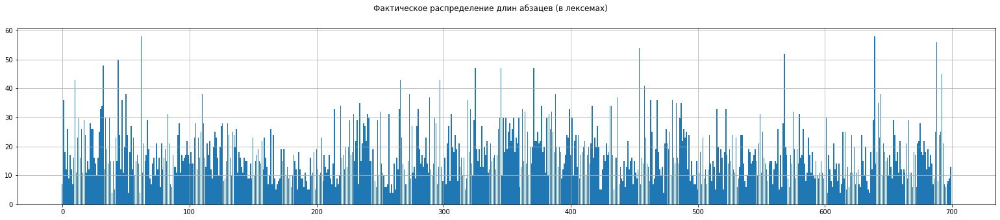

Collections Counter({15: 41, 12: 39, 14: 39, 17: 37, 9: 34, 16: 34, 11: 34, 10: 33, 7: 32, 18: 28, 13: 28, 19: 24, 21: 22, 20: 21, 8: 21, 23: 20, 24: 20, 6: 20, 5: 17, 22: 17, 25: 16, 30: 14, 26: 13, 28: 11, 29: 9, 33: 9, 4: 9, 27: 8, 31: 8, 36: 6, 34: 6, 38: 5, 35: 4, 32: 4, 43: 3, 47: 3, 58: 2, 37: 2, 48: 1, 50: 1, 54: 1, 41: 1, 52: 1, 56: 1, 45: 1})


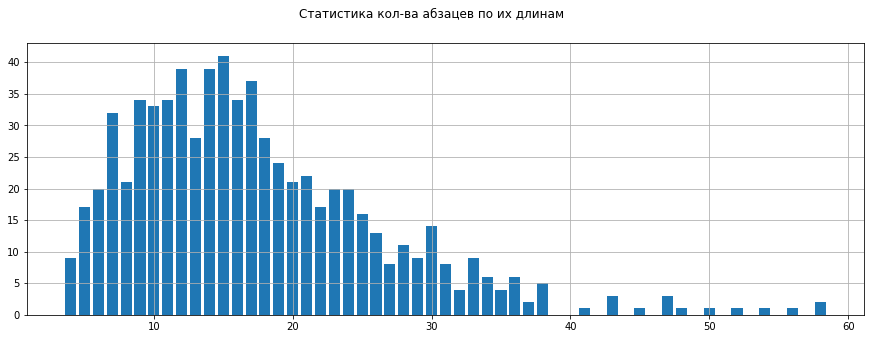

In [260]:
test_counter, test_count = draw_paragraphs_stat(paragraphs_test)

**Во скольких фразах встречается тот или  иной класс**

In [261]:
class_stat(paragraphs_test, tags_test)

Длина размеченной выборки: 700

Статистика по классам
Фраз без определительных структур: 305.0 - 43.57%
Фраз с категорией термин: 395.0 - 56.43%
Фраз с категорией связка: 392.0 - 56.0%
Фраз с категорией определение: 370.0 - 52.86%
Фраз с категорией расшифровка: 223.0 - 31.86%
Фраз с категорией дубль-термин: 71.0 - 10.14%
Фраз с категорией дубль-связка: 40.0 - 5.71%
Фраз с категорией дубль-определение: 41.0 - 5.86%
Фраз с категорией дубль-расшифровка: 9.0 - 1.29%


### The extraction of morphological features for lexemes from the array paragraphs_test.

In [262]:
morph_test = []
for i, elem in enumerate(paragraphs_test):
  row = []
  for j,lexem in enumerate(elem):
    row.append(morphyus(lexem))
  morph_test.append(row)
  print(f'{i+1} done {j+1}!')

Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1 done 7!
2 done 36!
3 done 18!
4 done 12!
5 done 26!
6 done 9!
7 done 17!
8 done 12!
9 done 7!
10 done 16!
11 done 43!
12 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.


13 done 23!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

14 done 30!
15 done 16!
16 done 26!
17 done 11!
18 done 29!
19 done 24!
20 done 11!
21 done 15!
22 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.


23 done 28!
24 done 26!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

25 done 26!
26 done 16!
27 done 14!
28 done 10!
29 done 16!
30 done 25!
31 done 33!
32 done 34!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

33 done 48!
34 done 12!
35 done 30!
36 done 19!
37 done 14!
38 done 30!
39 done 15!
40 done 4!
41 done 15!
42 done 5!
43 done 23!
44 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

45 done 50!
46 done 24!
47 done 12!
48 done 36!
49 done 11!
50 done 20!
51 done 38!
52 done 24!
53 done 4!
54 done 18!
55 done 27!
56 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

57 done 23!
58 done 10!
59 done 15!
60 done 17!
61 done 14!
62 done 4!
63 done 58!
64 done 11!
65 done 21!
66 done 15!
67 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

68 done 29!
69 done 19!
70 done 9!
71 done 7!
72 done 14!
73 done 16!
74 done 10!
75 done 21!
76 done 12!
77 done 16!
78 done 6!
79 done 21!
80 done 12!
81 done 16!
82 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

83 done 15!
84 done 31!
85 done 21!
86 done 7!
87 done 6!
88 done 17!
89 done 13!
90 done 13!
91 done 11!
92 done 24!
93 done 28!
94 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

95 done 17!
96 done 15!
97 done 16!
98 done 17!
99 done 22!
100 done 17!
101 done 14!
102 done 18!
103 done 14!
104 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

105 done 23!
106 done 28!
107 done 12!
108 done 23!
109 done 16!
110 done 25!
111 done 38!
112 done 28!
113 done 16!
114 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

115 done 21!
116 done 17!
117 done 22!
118 done 12!
119 done 9!
120 done 20!
121 done 25!
122 done 23!
123 done 16!
124 done 10!
125 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

126 done 27!
127 done 28!
128 done 8!
129 done 9!
130 done 15!
131 done 28!
132 done 24!
133 done 16!
134 done 10!
135 done 25!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

136 done 24!
137 done 20!
138 done 26!
139 done 11!
140 done 18!
141 done 16!
142 done 13!
143 done 11!
144 done 16!
145 done 15!
146 done 15!
147 done 9!
148 done 9!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

149 done 14!
150 done 9!
151 done 23!
152 done 10!
153 done 15!
154 done 17!
155 done 19!
156 done 15!
157 done 14!
158 done 22!
159 done 12!
160 done 23!
161 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

162 done 13!
163 done 7!
164 done 10!
165 done 26!
166 done 7!
167 done 24!
168 done 9!
169 done 5!
170 done 7!
171 done 8!
172 done 9!
173 done 19!
174 done 15!
175 done 19!
176 done 19!
177 done 10!
178 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

179 done 9!
180 done 10!
181 done 6!
182 done 10!
183 done 17!
184 done 15!
185 done 12!
186 done 5!
187 done 18!
188 done 12!
189 done 9!
190 done 9!
191 done 6!
192 done 11!
193 done 8!
194 done 5!
195 done 5!
196 done 16!
197 done 10!
198 done 11!
199 done 18!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

200 done 5!
201 done 19!
202 done 12!
203 done 10!
204 done 11!
205 done 23!
206 done 8!
207 done 17!
208 done 13!
209 done 11!
210 done 12!
211 done 17!
212 done 9!
213 done 7!
214 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

215 done 33!
216 done 6!
217 done 9!
218 done 7!
219 done 10!
220 done 34!
221 done 16!
222 done 17!
223 done 12!
224 done 20!
225 done 13!
226 done 20!
227 done 29!
228 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

229 done 18!
230 done 31!
231 done 15!
232 done 22!
233 done 29!
234 done 7!
235 done 35!
236 done 15!
237 done 21!
238 done 28!
239 done 27!
240 done 22!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

241 done 31!
242 done 30!
243 done 15!
244 done 15!
245 done 19!
246 done 19!
247 done 8!
248 done 6!
249 done 29!
250 done 10!
251 done 32!
252 done 14!
253 done 11!
254 done 10!
255 done 6!
256 done 6!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

257 done 7!
258 done 31!
259 done 4!
260 done 7!
261 done 4!
262 done 14!
263 done 5!
264 done 16!
265 done 12!
266 done 33!
267 done 43!
268 done 23!
269 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

270 done 12!
271 done 7!
272 done 7!
273 done 15!
274 done 38!
275 done 9!
276 done 27!
277 done 11!
278 done 13!
279 done 9!
280 done 27!
281 done 33!
282 done 19!
283 done 14!
284 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

285 done 13!
286 done 16!
287 done 23!
288 done 14!
289 done 11!
290 done 37!
291 done 12!
292 done 10!
293 done 14!
294 done 30!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

295 done 28!
296 done 7!
297 done 13!
298 done 43!
299 done 13!
300 done 8!
301 done 8!
302 done 16!
303 done 7!
304 done 21!
305 done 27!
306 done 8!
307 done 31!
308 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

309 done 18!
310 done 24!
311 done 19!
312 done 8!
313 done 21!
314 done 13!
315 done 16!
316 done 10!
317 done 16!
318 done 5!
319 done 9!
320 done 36!
321 done 18!
322 done 33!
323 done 14!
324 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

325 done 29!
326 done 47!
327 done 19!
328 done 15!
329 done 19!
330 done 13!
331 done 27!
332 done 13!
333 done 20!
334 done 17!
335 done 22!
336 done 11!
337 done 12!
338 done 21!
339 done 15!
340 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

341 done 17!
342 done 12!
343 done 17!
344 done 26!
345 done 30!
346 done 47!
347 done 10!
348 done 30!
349 done 18!
350 done 30!
351 done 19!
352 done 25!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

353 done 28!
354 done 22!
355 done 26!
356 done 30!
357 done 18!
358 done 23!
359 done 21!
360 done 30!
361 done 6!
362 done 13!
363 done 33!
364 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

365 done 32!
366 done 14!
367 done 25!
368 done 10!
369 done 20!
370 done 14!
371 done 20!
372 done 47!
373 done 22!
374 done 22!
375 done 25!
376 done 21!
377 done 22!
378 done 34!
379 done 18!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

380 done 20!
381 done 11!
382 done 30!
383 done 10!
384 done 31!
385 done 26!
386 done 32!
387 done 25!
388 done 18!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

389 done 38!
390 done 20!
391 done 13!
392 done 20!
393 done 18!
394 done 9!
395 done 12!
396 done 14!
397 done 17!
398 done 24!
399 done 23!
400 done 33!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

401 done 17!
402 done 30!
403 done 10!
404 done 22!
405 done 24!
406 done 13!
407 done 24!
408 done 9!
409 done 17!
410 done 18!
411 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

412 done 22!
413 done 10!
414 done 17!
415 done 20!
416 done 14!
417 done 21!
418 done 34!
419 done 16!
420 done 23!
421 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

422 done 27!
423 done 20!
424 done 5!
425 done 5!
426 done 12!
427 done 17!
428 done 15!
429 done 21!
430 done 17!
431 done 18!
432 done 34!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

433 done 34!
434 done 17!
435 done 5!
436 done 16!
437 done 16!
438 done 37!
439 done 7!
440 done 13!
441 done 9!
442 done 8!
443 done 15!
444 done 6!
445 done 13!
446 done 22!
447 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

448 done 15!
449 done 16!
450 done 7!
451 done 15!
452 done 11!
453 done 9!
454 done 12!
455 done 54!
456 done 7!
457 done 16!
458 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

459 done 41!
460 done 23!
461 done 14!
462 done 13!
463 done 8!
464 done 36!
465 done 25!
466 done 7!
467 done 9!
468 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

469 done 36!
470 done 18!
471 done 12!
472 done 10!
473 done 13!
474 done 4!
475 done 21!
476 done 26!
477 done 21!
478 done 19!
479 done 25!
480 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

481 done 36!
482 done 16!
483 done 14!
484 done 35!
485 done 16!
486 done 14!
487 done 30!
488 done 35!
489 done 22!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

490 done 26!
491 done 23!
492 done 25!
493 done 12!
494 done 24!
495 done 8!
496 done 15!
497 done 10!
498 done 7!
499 done 7!
500 done 15!
501 done 5!
502 done 11!
503 done 18!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

504 done 7!
505 done 23!
506 done 9!
507 done 12!
508 done 7!
509 done 12!
510 done 24!
511 done 14!
512 done 8!
513 done 15!
514 done 13!
515 done 5!
516 done 33!
517 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

518 done 11!
519 done 19!
520 done 16!
521 done 5!
522 done 18!
523 done 33!
524 done 17!
525 done 14!
526 done 19!
527 done 15!
528 done 24!
529 done 12!
530 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

531 done 23!
532 done 6!
533 done 9!
534 done 13!
535 done 24!
536 done 24!
537 done 14!
538 done 8!
539 done 6!
540 done 10!
541 done 19!
542 done 18!
543 done 14!
544 done 15!
545 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

546 done 19!
547 done 15!
548 done 10!
549 done 21!
550 done 31!
551 done 11!
552 done 25!
553 done 16!
554 done 14!
555 done 12!
556 done 8!
557 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

558 done 15!
559 done 15!
560 done 7!
561 done 12!
562 done 15!
563 done 14!
564 done 26!
565 done 5!
566 done 17!
567 done 6!
568 done 28!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

569 done 52!
570 done 20!
571 done 17!
572 done 9!
573 done 6!
574 done 17!
575 done 14!
576 done 32!
577 done 19!
578 done 9!
579 done 19!
580 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

581 done 31!
582 done 16!
583 done 17!
584 done 26!
585 done 14!
586 done 8!
587 done 11!
588 done 23!
589 done 17!
590 done 11!
591 done 18!
592 done 10!
593 done 9!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

594 done 15!
595 done 10!
596 done 9!
597 done 11!
598 done 15!
599 done 11!
600 done 9!
601 done 21!
602 done 30!
603 done 4!
604 done 17!
605 done 12!
606 done 8!
607 done 6!
608 done 21!
609 done 12!
610 done 14!
611 done 8!
612 done 14!
613 done 4!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

614 done 7!
615 done 25!
616 done 9!
617 done 25!
618 done 5!
619 done 13!
620 done 6!
621 done 11!
622 done 24!
623 done 11!
624 done 20!
625 done 7!
626 done 11!
627 done 12!
628 done 7!
629 done 6!
630 done 24!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

631 done 15!
632 done 10!
633 done 20!
634 done 8!
635 done 5!
636 done 4!
637 done 18!
638 done 12!
639 done 29!
640 done 58!
641 done 14!
642 done 18!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

643 done 35!
644 done 23!
645 done 38!
646 done 10!
647 done 21!
648 done 18!
649 done 15!
650 done 16!
651 done 10!
652 done 17!
653 done 13!
654 done 9!
655 done 29!
656 done 24!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

657 done 15!
658 done 18!
659 done 11!
660 done 22!
661 done 12!
662 done 7!
663 done 12!
664 done 11!
665 done 21!
666 done 9!
667 done 29!
668 done 11!
669 done 11!
670 done 6!
671 done 18!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

672 done 17!
673 done 6!
674 done 21!
675 done 22!
676 done 28!
677 done 18!
678 done 17!
679 done 22!
680 done 18!
681 done 12!
682 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

683 done 13!
684 done 17!
685 done 14!
686 done 7!
687 done 9!
688 done 25!
689 done 56!
690 done 8!
691 done 24!
692 done 25!
693 done 45!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

694 done 21!
695 done 7!
696 done 6!
697 done 7!
698 done 8!
699 done 9!
700 done 13!


In [263]:
len(morph_test)

700

In [264]:
for mrph in morph_test[665]:
  print(mrph)

['ru', 'true', 'и', 'CONJ', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'и', 'PRCL', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'и', 'INTJ', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'и', 'NOUN', 'anim', 'None', 'nomn', 'masc', 'None', 'None', 'sing', 'None', 'None', 'None', 'None', 'и', 'NOUN', 'anim', 'None', 'gent', 'masc', 'None', 'None', 'sing', 'None', 'None', 'None', 'None', 'и', 'NOUN', 'anim', 'None', 'datv', 'masc', 'None', 'None', 'sing', 'None', 'None', 'None', 'None', 'и', 'NOUN', 'anim', 'None', 'accs', 'masc', 'None', 'None', 'sing', 'None', 'None', 'None', 'None', 'и', 'NOUN', 'anim', 'None', 'ablt', 'masc', 'None', 'None', 'sing', 'None', 'None', 'None', 'None', 'и', 'NOUN', 'anim', 'None', 'loct', 'masc', 'None', 'None', 'sing', 'None', 'None', 'None', 'None', 'и', 'NOUN', 'anim', 'None', 'nomn', 'masc', 'None', 'None', 'plur', 'None',

In [265]:
# Статистика по длинам морфологических описаний для лексем 
k_test = 0
word_test = ''
index_test = -1
a_test = set()
for i, elem in enumerate(morph_test):
  for j,lexem in enumerate(elem):
    dlina = len(lexem)
    a.add(dlina)
    if dlina>k_test:
      index_test = i
      k_test = dlina
      word_test = lexem[2]

print(f'Лексема с максимально длинным морфологическим описанием: max(lexemdescription) = {k_test}; word = {word_test}; index(предложения) = {index_test}')
print('Перечень всех вариантов для длины морфологического описания лексемы\n',sorted(a))

Лексема с максимально длинным морфологическим описанием: max(lexemdescription) = 665; word = так; index(предложения) = 325
Перечень всех вариантов для длины морфологического описания лексемы
 [15, 28, 41, 54, 67, 80, 93, 106, 119, 132, 145, 158, 171, 184, 197, 210, 223, 236, 249, 262, 314, 327, 340, 353, 366, 379, 392, 418, 444, 470, 483, 496, 509, 548, 561, 626, 652, 665, 977]


In [266]:
# Составим массив нормальных форм слов параллельный массиву paragraphs_test
# Составим массив частей речи параллельный массиву paragraphs_test
# Составим массив падежей слов параллельный массиву paragraphs_test
# Составим массив языковой принадлежности слов параллельный массиву paragraphs_test
norms_test = []
pos_test = []
case_test = []
lang_test = []
for i, elem in enumerate(morph_test):
  norms_sentence = []
  pos_sentence = []
  case_sentence = []
  lang_sentence = []
  for j,lexem in enumerate(elem):
    len_descr = len(lexem)
    lang_sentence.append(lexem[0])
    norms_sentence.append(lexem[2])
    # собрать все части речи у лексемы
    pos = set()
    for k in range(3, len_descr,13):
      pos.add(lexem[k])
    pos_sentence.append("".join(list(pos)))
    # собрать у лексемы все падежи и 
    # признаки формы глагола, причастия, деепричастия - GRND, PRTS, PRTF, INFN, VERB
    case = set()
    if lexem[3] in ['GRND', 'PRTS', 'PRTF', 'INFN', 'VERB']:
      for k in range(4, len_descr,13):
        for m in range(k, k+11):
          case.add(lexem[m] if not lexem[m] in ['None'] else '')
    else: 
      for k in range(6, len_descr,13):
        case.add(lexem[k])
    case_sentence.append("".join(list(case)))
  norms_test.append(norms_sentence)  
  pos_test.append(pos_sentence)
  case_test.append(case_sentence)
  lang_test.append(lang_sentence)

In [267]:
for i, elem in enumerate(lang_test):
  print(i+1, elem)

1 ['ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'sign']
2 ['ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'en', 'ru', 'ru', 'sign', 'ru', 'sign', 'ru', 'ru', 'ru', 'sign', 'ru', 'sign', 'ru', 'en', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign']
3 ['ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign']
4 ['ru', 'ru', 'sign', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign']
5 ['en', 'sign', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'sign', 'en', 'sign', 'ru', 'ru', 'sign', 'sign', 'sign', 'sign', 'sign', 'sign', 'sign']
6 ['ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign']
7 ['ru', 'ru', 'ru', 'ru', 'en', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign']
8 ['ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign']
9 ['ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'sign']
10 ['ru', 'ru', 'sign', 'ru', 'sign', 'ru

In [268]:
for i, elem in enumerate(norms_test):
  print(i+1, elem)

1 ['свойство', '—', 'необходимый', 'условие', 'принадлежность', 'класс', '.']
2 ['парадигма', 'программирование', 'как', 'исходный', 'концептуальный', 'схема', 'постановка', 'проблема', 'и', 'они', 'решение', 'являться', 'инструмент', 'грамматического', 'описание', 'факт', ',', 'событие', ',', 'явление', 'и', 'процесс', ',', 'возможно', ',', 'не', 'существующих', 'одновременно', ',', 'но', 'интуитивно', 'объединять', 'в', 'общий', 'понятие', '.']
3 ['ветвление', '—', 'однократный', 'выполнение', 'один', 'из', 'два', 'или', 'более', 'операция', ',', 'в', 'зависимость', 'от', 'выполнение', 'задать', 'условие', '.']
4 ['локальный', 'переменный', '–', 'это', 'переменный', ',', 'объявить', 'внутри', 'любой', 'блок', 'программа', '.']
5 ['императивная', '(', 'процедурный', ')', 'часть', 'язык', 'дракон', 'опираться', 'на', 'новый', 'парадигма', 'программирование', '—', 'двумерный', '(', 'графическое', ')', 'структурный', 'программирование', '[', '63', ']', '[', '64', ']', '.']
6 ['дракон-схе

In [269]:
for i, elem in enumerate(pos_test):
  print(i+1, elem)

1 ['NOUN', 'PNCT', 'ADJF', 'NOUN', 'NOUN', 'NOUN', 'PNCT']
2 ['NOUN', 'NOUN', 'ADVBCONJPRCL', 'ADJF', 'ADJF', 'NOUN', 'NOUN', 'NOUN', 'NOUNINTJCONJPRCL', 'NPROADJF', 'NOUN', 'VERB', 'NOUN', 'NN', 'NOUN', 'NOUN', 'PNCT', 'NOUN', 'PNCT', 'NOUN', 'NOUNINTJCONJPRCL', 'NOUN', 'PNCT', 'ADJSADVBCONJ', 'PNCT', 'PRCL', 'NN', 'ADJSADVB', 'PNCT', 'INTJCONJ', 'ADJSADVB', 'PRTF', 'NOUNPREP', 'ADJF', 'NOUN', 'PNCT']
3 ['NOUN', 'PNCT', 'ADJF', 'NOUN', 'ADJF', 'NOUNPREP', 'NUMR', 'CONJ', 'ADVB', 'NOUN', 'PNCT', 'NOUNPREP', 'NOUN', 'PREP', 'NOUN', 'ADJFPRTF', 'NOUN', 'PNCT']
4 ['ADJF', 'ADJF', 'PNCT', 'NPROADJFPRCL', 'ADJF', 'PNCT', 'PRTF', 'ADVBPREP', 'NPROADJF', 'NOUN', 'NOUN', 'PNCT']
5 ['NN', 'PNCT', 'ADJF', 'PNCT', 'NOUN', 'NOUN', 'NOUN', 'VERB', 'INTJPREPPRCL', 'ADJF', 'NOUN', 'NOUN', 'PNCT', 'ADJF', 'PNCT', 'NN', 'PNCT', 'ADJF', 'NOUN', 'PNCT', 'NUMB', 'PNCT', 'PNCT', 'NUMB', 'PNCT', 'PNCT']
6 ['NOUN', 'PNCT', 'NPROADJFPRCL', 'NOUN', 'NOUNPREPPRCL', 'ADJSADVBCONJ', 'PRTFADJF', 'NOUN', 'PNCT']
7 

In [270]:
for i, elem in enumerate(case_test):
  print(i+1, elem)

1 ['nomnaccs', 'None', 'nomnaccs', 'nomnaccs', 'accsnomndatvloctgent', 'datv', 'None']
2 ['nomn', 'nomnaccsgent', 'None', 'nomn', 'nomn', 'nomn', 'nomnaccsgent', 'gent', 'accsabltNonenomndatvloctgent', 'accsabltnomndatvloctgent', 'nomnaccsgent', 'indcimpf3perintrsingpres', 'ablt', 'None', 'nomnaccsgent', 'gent', 'None', 'gent', 'None', 'gent', 'accsabltNonenomndatvloctgent', 'gent', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'tranaccsgentloctimpfanimprespssvplur', 'accsabltNonenomndatvloctgent', 'nomnaccs', 'nomnaccs', 'None']
3 ['nomnaccs', 'None', 'nomnaccs', 'nomnaccs', 'loctdatvabltgent', 'Noneaccsgent', 'loctaccsgent', 'None', 'None', 'gent', 'None', 'accsabltNonenomndatvloctgent', 'accsnomndatvloctgent', 'None', 'nomnaccsgent', 'accsneutanimperfmascsingtranpssvpastgent', 'nomnaccsgent', 'None']
4 ['nomnaccs', 'nomnaccs', 'None', 'Nonenomnaccs', 'nomnaccs', 'None', 'accsinanperfnomntranpssvpastplur', 'None', 'accsgent', 'accsgent', 'nomnaccsgent', 'Non

# **Step 1. Text Classification** on the Parts of Speech

## Preparing a dataset

Объединим обучающий и тестовый массивы, чтобы воспользоваться общим токенизатором для нескольких входов с данными о pos, case, и т.д.

In [271]:
full_pcln = pos_train + pos_test + case_train + case_test + lang_train + lang_test + norms_train + norms_test
full_semantics = semantics_train + semantics_test
print(len(full_pcln))
print(len(full_semantics))

15060
3765


In [272]:
full_pcln_together = [' '.join(sequence) for sequence in full_pcln]

In [273]:
full_pcln_together[max_paragraph_len_ind]

'NOUN VERB NOUN NOUNPREP ADJF NOUN NOUN PNCT NPROADJFPRCL PNCT NOUN NOUNADJF PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT PNCT NOUNADJF NOUN NOUNINTJCONJPRCL NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT PNCT ADJF NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT PNCT INTJCONJPRCL PRCL NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT PNCT'

In [274]:
full_semantics[max_paragraph_len_ind]

[1]

In [275]:
num_words = 2000 
# из расчёта: 
# 550 единиц на морфологические признаки и на наименования частей речи
# 1450 единиц на наиболее частотные лексемы из текста
sent_len = max_paragraph_len 
tokenizer = Tokenizer(num_words, filters=' \t\n', oov_token='<UNK>')

In [276]:
tokenizer.fit_on_texts(full_pcln_together)

In [277]:
# реальная длина словаря. Сравниваем со значением num_words
len(tokenizer.index_word)

9019

**Токенизируем входные данные.** (Выходные данные у нас изначально представляют собой токены)

In [278]:
X = tokenizer.texts_to_sequences(full_pcln_together)

In [279]:
Y = np.array(full_semantics)

**Теперь разобъём X на два входных массива с данными о pos, cases, lang и norms размерностью paragraphs_amount + test_paragraphs_amount каждый**

In [280]:
L = paragraphs_amount + test_paragraphs_amount
M = 2*L
N = M+L
X_pos = X[:L]
X_case = X[L:M]
X_lang = X[M:N]
X_norms = X[N:]

**Проверка входящих и исходящих массивов на соответствие их размерностей** 

(для выявления факта порчи данных функцией Tokenizer)

In [281]:
len(X_pos)==len(Y)

True

In [282]:
len(X_case)==len(Y)

True

In [283]:
len(X_lang)==len(Y)

True

In [284]:
len(X_norms)==len(Y)

True

In [285]:
print(Y)

[[1]
 [1]
 [1]
 ...
 [0]
 [0]
 [0]]


In [286]:
print(X_pos[0])

[8, 4, 6, 4, 4, 6, 18, 8, 15, 4, 4, 4, 6, 108, 150, 15, 6, 78, 15, 36, 4, 23, 31, 4, 6]


In [287]:
print(X_case[0])

[7, 7, 3, 17, 13, 3, 12, 40, 33, 17, 13, 13, 3, 21, 151, 33, 3, 21, 58, 19, 17, 12, 360, 7, 3]


In [288]:
print(X_lang[0])

[2, 2, 5, 2, 2, 5, 2, 2, 2, 2, 2, 2, 5, 2, 2, 2, 5, 2, 2, 2, 2, 2, 2, 2, 5]


In [289]:
print(X_norms[0])

[1, 125, 26, 435, 125, 9, 20, 51, 707, 1316, 281, 274, 9, 109, 152, 1, 9, 77, 293, 213, 475, 24, 1204, 277, 14]


**Выравнивание массивов до максимального размера абзаца**

In [290]:
X_pos = pad_sequences(X_pos, sent_len, padding='post', truncating='post') # заполнение в конце и обрезка с конца предложения

In [291]:
X_case = pad_sequences(X_case, sent_len, padding='post', truncating='post') # заполнение в конце и обрезка с конца предложения

In [292]:
X_lang = pad_sequences(X_lang, sent_len, padding='post', truncating='post')

In [293]:
X_norms = pad_sequences(X_norms, sent_len, padding='post', truncating='post')

In [294]:
X_pos.shape

(3765, 128)

In [295]:
X_case.shape

(3765, 128)

In [296]:
X_lang.shape

(3765, 128)

In [297]:
X_norms.shape

(3765, 128)

In [298]:
Y.shape

(3765, 1)

In [299]:
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html
Xtrain_pos, Xtest_pos, Ytrain, Ytest = train_test_split(X_pos, Y, train_size=train_paragraphs_len, shuffle=False) # Не перемешиваем данные и берём целую часть на тренировочную выборку

In [300]:
Xtrain_case = X_case[:train_paragraphs_len]
Xtest_case = X_case[train_paragraphs_len:]

Xtrain_lang = X_lang[:train_paragraphs_len]
Xtest_lang = X_lang[train_paragraphs_len:]

Xtrain_norms = X_norms[:train_paragraphs_len]
Xtest_norms = X_norms[train_paragraphs_len:]

### Total for training and testing samples we have:

In [301]:
print('Xtrain_pos.shape=',Xtrain_pos.shape)
print('Xtest_pos.shape=',Xtest_pos.shape)
print('Xtrain_case.shape=',Xtrain_case.shape)
print('Xtest_case.shape=',Xtest_case.shape)

print('Xtrain_lang.shape=',Xtrain_lang.shape)
print('Xtest_lang.shape=',Xtest_lang.shape)
print('Xtrain_norms.shape=',Xtrain_norms.shape)
print('Xtest_norms.shape=',Xtest_norms.shape)

print('Ytrain.shape=',Ytrain.shape)
print('Ytest.shape=',Ytest.shape)

Xtrain_pos.shape= (3065, 128)
Xtest_pos.shape= (700, 128)
Xtrain_case.shape= (3065, 128)
Xtest_case.shape= (700, 128)
Xtrain_lang.shape= (3065, 128)
Xtest_lang.shape= (700, 128)
Xtrain_norms.shape= (3065, 128)
Xtest_norms.shape= (700, 128)
Ytrain.shape= (3065, 1)
Ytest.shape= (700, 1)


In [302]:
Xtrain_pos[1]

array([ 11,   4,   6,  53,   4,   4,   6,   4,   4,   8,   4,   8,   4,
         6,   6,  37,   8,  61,  60,   6,  18,   8,   4,   4,  15,   4,
         6,   4,   6,   6,   4,  88,  30,  61,   6,  94,   6,  31, 126,
         4,   8,   4,   6,  15,  30,  18,   4,  11,   4,   6,  94,   6,
        31, 126,   4,   4,   6,  15,  30,  18,   4,   6,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0], dtype=int32)

In [303]:
Xtrain_case[1]

array([  3,   7,   3,  21,  17,  13,   3,   7,  13,  25, 116,  40,  13,
         3,   3,   3,  40,   3,   7,   3,  12,  22,  69,  13,  68,  32,
         3,  13,   3,   3,  32,   3,  85,   3,   3, 176,   3, 427, 100,
        22,  27,  16,   3,  68,  85,  75,  32,   3,  19,   3, 176,   3,
       176, 100,  22,  32,   3,  68,  85,  12,   7,   3,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0], dtype=int32)

In [304]:
Xtrain_lang[1]

array([10,  2,  5,  2,  2,  2,  5,  2,  2,  2,  2,  2,  2,  5,  5,  2,  2,
        2,  2,  5,  2,  2,  2,  2,  2,  2,  5,  2,  5,  5,  2,  2,  2,  2,
        5,  2,  5,  2,  2,  2,  2,  2,  5,  2,  2,  2,  2, 10,  2,  5,  2,
        5,  2,  2,  2,  2,  5,  2,  2,  2,  2,  5,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0], dtype=int32)

In [305]:
Xtrain_norms[1]

array([   1,  125,   26,   42,  435,  125,   29,  458,  616,  224,  105,
        674,  149,   28,    9,   38,   51, 1317,  235,   49,   20,  224,
        105,  149, 1205,  444,   29,  397,   28,   86,  444,  194,  537,
          1,   86,  193,    9,  924,  127,  279,  592,  444,    9,   97,
          1,   91,  538,    1,  444,   86,  193,    9,  361,  127,  279,
        444,    9,   97, 1205,   20,  538,   14,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0], dtype=int32)

In [306]:
Ytrain[1]

array([1])

## Recurrent neural network model (LSTM)

In [307]:
embedding_size = 100

# параллельная архитектура
input_pos = Input((sent_len,))
x_pos = Embedding(num_words, embedding_size)(input_pos)
x_pos = Conv1D(64, 3, padding='same', name='input1_conv1')(x_pos)
x_pos = BatchNormalization()(x_pos)
x_pos = Activation('relu')(x_pos)
x_pos = Dropout(0.2)(x_pos)

input_case = Input((sent_len,))
x_case = Embedding(num_words, embedding_size)(input_case)
x_case = Conv1D(64, 3, padding='same', name='input2_conv1')(x_case)
x_case = BatchNormalization()(x_case)
x_case = Activation('relu')(x_case)
x_case = Dropout(0.2)(x_case)

input_lang = Input((sent_len,))
x_lang = Embedding(num_words, embedding_size)(input_lang)
x_lang = Conv1D(64, 3, padding='same', name='input3_conv1')(x_lang)
x_lang = BatchNormalization()(x_lang)
x_lang = Activation('relu')(x_lang)
x_lang = Dropout(0.2)(x_lang)

input_norms = Input((sent_len,))
x_norms = Embedding(num_words, embedding_size)(input_norms)
x_norms = Conv1D(64, 3, padding='same', name='input4_conv1')(x_norms)
x_norms = BatchNormalization()(x_norms)
x_norms = Activation('relu')(x_norms)
x_norms = Dropout(0.2)(x_norms)

x = concatenate([x_pos, x_case, x_lang, x_norms])

# последовательная архитектура
# x_pos = Embedding(num_words, embedding_size)(input_pos)
# x_pos = BatchNormalization()(x_pos)
# x_pos = LSTM(128, return_sequences=True)(x_pos)
# x_pos = Dropout(0.2)(x_pos)

# input_case = Input((sent_len,))
# x_case = Embedding(num_words, embedding_size)(input_case)

# input_lang = Input((sent_len,))
# x_lang = Embedding(num_words, embedding_size)(input_lang)

# input_norms = Input((sent_len,))
# x_norms = Embedding(num_words, embedding_size)(input_norms)


# x = concatenate([x_pos, x_case])
# x = BatchNormalization()(x)
# x = LSTM(128, return_sequences=True)(x)
# x = Dropout(0.2)(x)

# x = concatenate([x, x_lang])
# x = BatchNormalization()(x)
# x = LSTM(128, return_sequences=True)(x)
# x = Dropout(0.2)(x)

# x = concatenate([x, x_norms])
# x = BatchNormalization()(x)
x = LSTM(128, return_sequences=True)(x)
x = SpatialDropout1D(0.2)(x)
x = Flatten()(x)
# x = BatchNormalization()(x)
x = Dense(100, activation='relu')(x)
x = Dropout(0.2)(x)
output = Dense(1, activation='sigmoid')(x)

modelLSTM = Model(inputs=[input_pos, input_case, input_lang, input_norms], outputs=output)

#  'adam' 'rmsprop'   Adam
modelLSTM.compile(loss='binary_crossentropy', metrics=[AUC(num_thresholds=150)], optimizer=RMSprop(lr=1e-4)) #

modelLSTM.summary()

Model: "functional_15"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_29 (InputLayer)           [(None, 128)]        0                                            
__________________________________________________________________________________________________
input_30 (InputLayer)           [(None, 128)]        0                                            
__________________________________________________________________________________________________
input_31 (InputLayer)           [(None, 128)]        0                                            
__________________________________________________________________________________________________
input_32 (InputLayer)           [(None, 128)]        0                                            
______________________________________________________________________________________

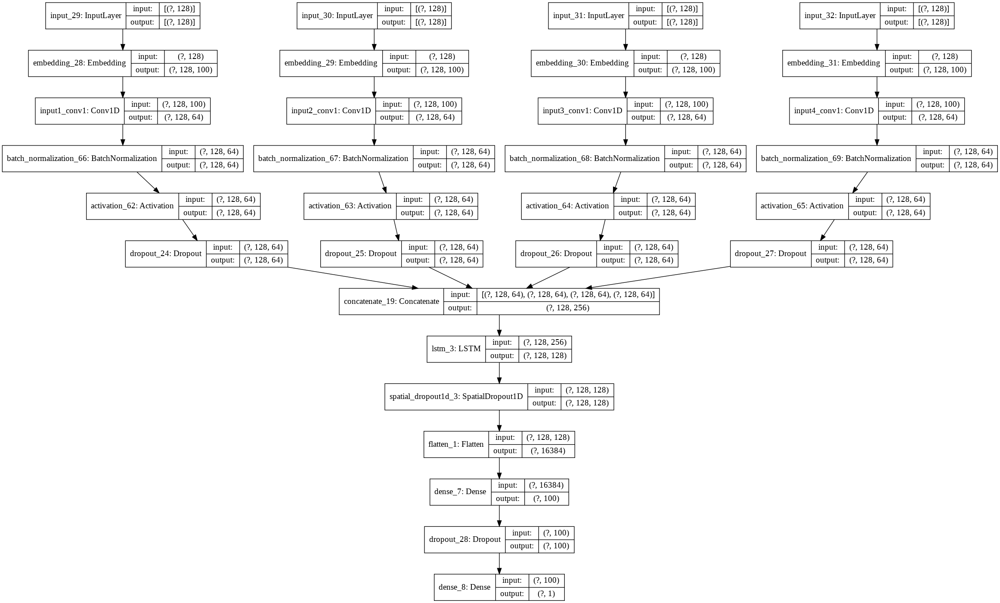

In [308]:
plot_model(modelLSTM, show_shapes=True)

In [309]:
historyLSTM = modelLSTM.fit(x=[Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms], y=Ytrain, 
                            batch_size=96, epochs=60, 
                            validation_data=([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms], Ytest))

Epoch 1/60
32/32 [==============================] - 1s 45ms/step - loss: 0.6311 - auc_3: 0.6966 - val_loss: 0.6874 - val_auc_3: 0.8808
Epoch 2/60
32/32 [==============================] - 1s 25ms/step - loss: 0.4796 - auc_3: 0.8529 - val_loss: 0.6635 - val_auc_3: 0.9408
Epoch 3/60
32/32 [==============================] - 1s 26ms/step - loss: 0.4078 - auc_3: 0.8946 - val_loss: 0.6493 - val_auc_3: 0.9814
Epoch 4/60
32/32 [==============================] - 1s 25ms/step - loss: 0.3641 - auc_3: 0.9172 - val_loss: 0.6303 - val_auc_3: 0.9811
Epoch 5/60
32/32 [==============================] - 1s 26ms/step - loss: 0.3351 - auc_3: 0.9300 - val_loss: 0.6141 - val_auc_3: 0.9923
Epoch 6/60
32/32 [==============================] - 1s 26ms/step - loss: 0.2895 - auc_3: 0.9485 - val_loss: 0.5804 - val_auc_3: 0.9872
Epoch 7/60
32/32 [==============================] - 1s 26ms/step - loss: 0.2776 - auc_3: 0.9523 - val_loss: 0.5586 - val_auc_3: 0.9930
Epoch 8/60
32/32 [==============================] - 1s 

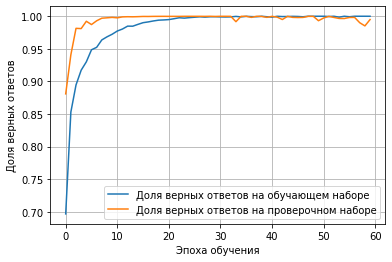

In [311]:
# график прогрессии обучения нейросети в Matplotlib
plt.plot(historyLSTM.history['auc_3'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(historyLSTM.history['val_auc_3'], 
         label='Доля верных ответов на проверочном наборе')
plt.grid(True)
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend(loc='best')
plt.show()

**Проверка качества работы нейронной сети**

In [312]:
Y_hat = modelLSTM.predict([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms])
Y_hat.shape, Ytest.shape

((700, 1), (700, 1))

In [313]:
y_coincidence = 0
y_unrecognized = 0
y_contrived = 0
for i, pred in enumerate(Y_hat):
  b = Ytest[i][0]
  a = round(pred[0])
  print(i+1, a, b, paragraphs_test[i])
  if a+b>1.5:
    y_coincidence += 1
  elif a+b<0.5:
    y_coincidence += 1
  else:
    if a>0.5:
      y_contrived += 1
    else:
      y_unrecognized += 1

print(f"\nРаспознано: {y_coincidence}; Нераспознано: {y_unrecognized}; Надумано: {y_contrived}")  

1 1.0 1 ['Свойство', '—', 'необходимое', 'условие', 'принадлежности', 'классу', '.']
2 1.0 1 ['Парадигма', 'программирования', 'как', 'исходная', 'концептуальная', 'схема', 'постановки', 'проблем', 'и', 'их', 'решения', 'является', 'инструментом', 'грамматического', 'описания', 'фактов', ',', 'событий', ',', 'явлений', 'и', 'процессов', ',', 'возможно', ',', 'не', 'существующих', 'одновременно', ',', 'но', 'интуитивно', 'объединяемых', 'в', 'общее', 'понятие', '.']
3 1.0 1 ['Ветвление', '—', 'однократное', 'выполнение', 'одной', 'из', 'двух', 'или', 'более', 'операций', ',', 'в', 'зависимости', 'от', 'выполнения', 'заданного', 'условия', '.']
4 1.0 1 ['Локальные', 'переменные', '–', 'это', 'переменные', ',', 'объявленные', 'внутри', 'любого', 'блока', 'программы', '.']
5 1.0 1 ['Императивная', '(', 'процедурная', ')', 'часть', 'языка', 'ДРАКОН', 'опирается', 'на', 'новую', 'парадигму', 'программирования', '—', 'двумерное', '(', 'графическое', ')', 'структурное', 'программирование', '['

ROC-кривая (англ. receiver operating characteristic, рабочая характеристика приёмника) — график, позволяющий оценить качество бинарной классификации, отображает соотношение между долей объектов от общего количества носителей признака, верно классифицированных как несущие признак (англ. true positive rate, TPR, называемой чувствительностью алгоритма классификации), и долей объектов от общего количества объектов, не несущих признака, ошибочно классифицированных как несущие признак (англ. false positive rate, FPR, величина 1-FPR называется специфичностью алгоритма классификации) при варьировании порога решающего правила.

https://ru.wikipedia.org/wiki/ROC-%D0%BA%D1%80%D0%B8%D0%B2%D0%B0%D1%8F

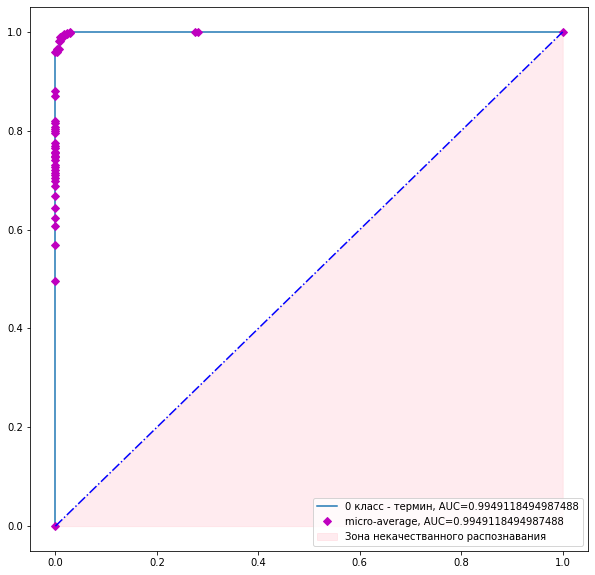

In [314]:
plt.figure(figsize=(10,10))


num_classes = 1 #узнаем, сколько всего классов
for i in range(num_classes): #проходимся по всем классам
  fpr, tpr, thresholds = roc_curve(Ytest[:, i], Y_hat[:, i]) #получаем roc-кривую для очередного класса
  plt.plot(fpr, tpr, label='{} класс - {}, AUC={}'.format(i, dic_color[i], AUC()(Ytest[:, i], Y_hat[:, i]))) #отрисовываем кривую и подписываем ее площадь

avg_fpr, avg_tpr, thresholds = roc_curve(Ytest.flatten(), Y_hat.flatten()) #получаем micro-average (общую) кривую roc
plt.plot(avg_fpr, avg_tpr, 'mD',label='micro-average, AUC={}'.format(AUC()(Ytest, Y_hat)))#отрисовываем кривую и подписываем ее площадь
plt.plot([0,1], [0,1], 'b-.') #обозначим границу качественной работы нейросети
plt.fill_between([0,1], [0,1], label='Зона некачестванного распознавания', color='pink', alpha=0.3) #обозначим границу некачественной работы нейросети
plt.legend()

## Fetching arrays for the next step in extracting definitional structures in phrases with expected semantic status

In [315]:
pos_train_2 = []
case_train_2 = []
lang_train_2 = []
norms_train_2 = []
tags_train_2 = []
paragraphs_train_2 = []
for i, elem in enumerate(semantics_train):
  if elem[0]==1:
    pos_train_2.append(pos_train[i])
    case_train_2.append(case_train[i])
    lang_train_2.append(lang_train[i])
    norms_train_2.append(norms_train[i])
    paragraphs_train_2.append(paragraphs_train[i])
    tags_train_2.append(tags_train[i])

print(f'Обучающие массивы (с размерностью {train_yes})', 
      len(pos_train_2), len(case_train_2), 
      len(lang_train_2), len(norms_train_2), 
      len(tags_train_2), len(paragraphs_train_2))


Обучающие массивы (с размерностью 1706) 1706 1706 1706 1706 1706 1706


In [316]:
pos_test_2 = []
case_test_2 = []
lang_test_2 = []
norms_test_2 = []
tags_test_2 = []
paragraphs_test_2 = []
for i, elem in enumerate(Y_hat):
  if round(elem[0])>0:
    pos_test_2.append(pos_test[i])
    case_test_2.append(case_test[i])
    lang_test_2.append(lang_test[i])
    norms_test_2.append(norms_test[i])
    paragraphs_test_2.append(paragraphs_test[i])
    tags_test_2.append(tags_test[i])

print(f'Тренировочные массивы (с размерностью {test_yes}):',
      len(pos_test_2), len(case_test_2), 
      len(lang_test_2), len(norms_test_2), 
      len(tags_test_2), len(paragraphs_test_2))


Тренировочные массивы (с размерностью 395): 409 409 409 409 409 409


# **Step 2. Segmentation of text** on the Parts of Speech

## Preparing a dataset

Объединим обучающий и тестовый массивы, чтобы воспользоваться общим токенизатором.

In [317]:
# Здесь для обучения оставим обучающую выборку в полном объёме, 
# а из тестовой возьмём только то, что выбрала нейронка на предыдущем шаге
all_pcln = pos_train + pos_test_2 + case_train + case_test_2 + \
           lang_train + lang_test_2 + norms_train + norms_test_2 
all_tags = tags_train + tags_test_2
all_paragraphs = paragraphs_train + paragraphs_test_2
train_test_paragraphs_amount_2 = len(all_paragraphs)

print(len(all_pcln))
print(len(all_tags))
print(len(all_paragraphs))

print(f'train_test_paragraphs_amount_2 = {train_test_paragraphs_amount_2}')

13896
3474
3474
train_test_paragraphs_amount_2 = 3474


In [318]:
all_pcln_together = [' '.join(sequence) for sequence in all_pcln]

In [321]:
len(all_pcln_together)

13896

In [320]:
all_pcln_together[0]

'ADJF NOUN PNCT NOUN NOUN PNCT NOUNPREP ADJF VERB NOUN NOUN NOUN PNCT ADJFCONJPRCL VERBINTJINFN VERB PNCT ADVBNPROCONJPRCL VERB NPRO NOUN NOUNINTJCONJPRCL PRTF NOUN PNCT'

In [322]:
all_tags_together = [' '.join(tag) for tag in all_tags]

In [324]:
all_tags_together[0]

'термин термин связка определение определение o расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка o'

In [ ]:
# Токенайзер для текстов приготовлен на предыдущем шаге

# num_words = 9000
# sent_len = max_paragraph_len 
# tokenizer = Tokenizer(num_words, filters=' \t\n', oov_token='<UNK>')

In [ ]:
# tokenizer.fit_on_texts(all_paragraphs_together)

In [ ]:
# реальная длина словаря. Сравниваем со значением num_words
# len(tokenizer.index_word)

In [325]:
# Токенайзер для категорий определительной структуры ещё не готов

tag_tokenizer = Tokenizer(filters=' ') # colors_count - количество категорий - лучше не указывать, чтобы не потерять категории. Все они автоматически подцедпляются под своими индексами

In [326]:
tag_tokenizer.fit_on_texts(all_tags_together)

In [327]:
tag_tokenizer.index_word # Здесь обращаем внимание, что фактическая нумерация индексов смещена на единицу по сравнению с массивом color_dic

{1: 'o',
 2: 'расшифровка',
 3: 'определение',
 4: 'термин',
 5: 'связка',
 6: 'дубль-определение',
 7: 'дубль-термин',
 8: 'дубль-связка',
 9: 'дубль-расшифровка'}

In [328]:
tag_tokenizer.word_index

{'o': 1,
 'дубль-определение': 6,
 'дубль-расшифровка': 9,
 'дубль-связка': 8,
 'дубль-термин': 7,
 'определение': 3,
 'расшифровка': 2,
 'связка': 5,
 'термин': 4}

In [329]:
len(tag_tokenizer.index_word) # эта величина равна colors_count

9

In [330]:
# prepare color dictionary
tag_tokenizer_dic_color = {}
tag_tokenizer_dic_color[1] = color.END
for i in range(2,10):
  tag_tokenizer_dic_color[i] = dic_colored_items[color_dic[tag_tokenizer.index_word[i]]]
tag_tokenizer_dic_color

{1: '\x1b',
 2: '\x1b\x1b',
 3: '\x1b\x1b',
 4: '\x1b\x1b',
 5: '\x1b\x1b',
 6: '\x1b\x1b',
 7: '\x1b\x1b',
 8: '\x1b\x1b',
 9: '\x1b\x1b'}

**Токенизируем входные данные.** (Выходные данные у нас изначально представляют собой токены)

In [331]:
X_2 = tokenizer.texts_to_sequences(all_pcln_together)

In [332]:
Y_2 = tag_tokenizer.texts_to_sequences(all_tags_together)

**Теперь разобъём X на два входных массива с данными о pos и cases размерностью paragraphs_amount + test_paragraphs_amount каждый**

In [333]:
L = train_test_paragraphs_amount_2
M = 2*L
N = M+L
X_2_pos = X_2[:L]
X_2_case = X_2[L:M]
X_2_lang = X_2[M:N]
X_2_norms = X_2[N:]

**Проверка входящих и исходящих массивов на соответствие их размерностей** 

(для выявления факта порчи данных функцией Tokenizer)

In [334]:
len(X_2_pos)==len(Y_2)

True

In [335]:
len(X_2_case)==len(Y_2)

True

In [336]:
len(X_2_lang)==len(Y_2)

True

In [337]:
len(X_2_norms)==len(Y_2)

True

In [338]:
len(Y_2)

3474

In [339]:
# Проверка на согласованность входных и выходных данных
for i, elem in enumerate(X_2_pos):
  if len(Y_2[i]) != len(X_2_pos[i]):
    print('X_2_pos[{}] ='.format(i),X_2_pos[i])
    print('Y_2[{}] ='.format(i),Y_2[i])
    # Если все массивы равны, то здесь  ничего не должно печататься
  else:
    pass
    # print('len(X_2_pos[{}]) ='.format(i),len(Y_2[i]))
  if len(Y_2[i]) != len(X_2_case[i]):
    print('X_2_case[{}] ='.format(i),X_2_case[i])
    print('Y_2[{}] ='.format(i),Y_2[i])
    # Если все массивы равны, то здесь  ничего не должно печататься
  else:
    pass
    # print('len(X_2_case[{}]) ='.format(i),len(Y_2[i]))
  if len(Y_2[i]) != len(X_2_lang[i]):
    print('X_2_lang[{}] ='.format(i),X_2_lang[i])
    print('Y_2[{}] ='.format(i),Y_2[i])
    # Если все массивы равны, то здесь  ничего не должно печататься
  else:
    pass
    # print('len(X_2_lang[{}]) ='.format(i),len(Y_2[i]))
  if len(Y_2[i]) != len(X_2_norms[i]):
    print('X_2_norms[{}] ='.format(i),X_2_norms[i])
    print('Y_2[{}] ='.format(i),Y_2[i])
    # Если все массивы равны, то здесь  ничего не должно печататься
  else:
    pass
    # print('len(X_2_norms[{}]) ='.format(i),len(Y_2[i]))

**Выравнивание массивов до максимального размера абзаца**

In [340]:
X_2_pos = pad_sequences(X_2_pos, sent_len, padding='post', truncating='post') # заполнение в конце и обрезка с конца предложения

In [341]:
X_2_case = pad_sequences(X_2_case, sent_len, padding='post', truncating='post') # заполнение в конце и обрезка с конца предложения

In [342]:
X_2_lang = pad_sequences(X_2_lang, sent_len, padding='post', truncating='post')

In [343]:
X_2_norms = pad_sequences(X_2_norms, sent_len, padding='post', truncating='post')

In [344]:
X_2_pos.shape

(3474, 128)

In [345]:
X_2_case.shape

(3474, 128)

In [346]:
X_2_lang.shape

(3474, 128)

In [347]:
X_2_norms.shape

(3474, 128)

In [348]:
Y_2 = pad_sequences(Y_2, sent_len, value=1, padding='post', truncating='post') # заполнение в конце и обрезка с конца предложения

In [349]:
Y_2.shape

(3474, 128)

In [350]:
Y_2 = to_categorical(Y_2, colors_count+1)  # см. лекцию "Занятие № 6 Углубленный курс по текстам" https://youtu.be/Nfw7ZY-WzS8?t=1533
Y_2.shape

(3474, 128, 10)

In [351]:
Y_2 = Y_2[:, :, 1:]  # см. лекцию "Занятие № 6 Углубленный курс по текстам" https://youtu.be/Nfw7ZY-WzS8?t=1533
Y_2.shape

(3474, 128, 9)

In [352]:
print(colorize_the_text(all_paragraphs[13], Y_2[13], 0))

 hash ( x ) - Возвращает хеш указанного объекта .


Далее заменяем массивы из первого этапа по классификации предложений

In [353]:
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html
Xtrain_pos, Xtest_pos, Ytrain, Ytest = train_test_split(X_2_pos, Y_2, train_size=train_paragraphs_len, shuffle=False) # Не перемешиваем данные и берём целую часть на тренировочную выборку

In [354]:
Xtrain_case = X_2_case[:train_paragraphs_len]
Xtest_case = X_2_case[train_paragraphs_len:]

Xtrain_lang = X_2_lang[:train_paragraphs_len]
Xtest_lang = X_2_lang[train_paragraphs_len:]

Xtrain_norms = X_2_norms[:train_paragraphs_len]
Xtest_norms = X_2_norms[train_paragraphs_len:]

### Total for training and testing samples we have:

In [355]:
# Новые размерности уже "только" для массивов с определительными структурами, 
# с учетом вычисленных на этапе классификации предложений

print('Xtrain_pos.shape=',Xtrain_pos.shape)
print('Xtest_pos.shape=',Xtest_pos.shape)
print('Xtrain_case.shape=',Xtrain_case.shape)
print('Xtest_case.shape=',Xtest_case.shape)
print('Xtrain_lang.shape=',Xtrain_lang.shape)
print('Xtest_lang.shape=',Xtest_lang.shape)
print('Xtrain_norms.shape=',Xtrain_norms.shape)
print('Xtest_norms.shape=',Xtest_norms.shape)
print('Ytrain.shape=',Ytrain.shape)
print('Ytest.shape=',Ytest.shape)

Xtrain_pos.shape= (3065, 128)
Xtest_pos.shape= (409, 128)
Xtrain_case.shape= (3065, 128)
Xtest_case.shape= (409, 128)
Xtrain_lang.shape= (3065, 128)
Xtest_lang.shape= (409, 128)
Xtrain_norms.shape= (3065, 128)
Xtest_norms.shape= (409, 128)
Ytrain.shape= (3065, 128, 9)
Ytest.shape= (409, 128, 9)


In [356]:
Xtrain_pos[1]

array([ 11,   4,   6,  53,   4,   4,   6,   4,   4,   8,   4,   8,   4,
         6,   6,  37,   8,  61,  60,   6,  18,   8,   4,   4,  15,   4,
         6,   4,   6,   6,   4,  88,  30,  61,   6,  94,   6,  31, 126,
         4,   8,   4,   6,  15,  30,  18,   4,  11,   4,   6,  94,   6,
        31, 126,   4,   4,   6,  15,  30,  18,   4,   6,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0], dtype=int32)

In [357]:
Xtrain_case[1]

array([  3,   7,   3,  21,  17,  13,   3,   7,  13,  25, 116,  40,  13,
         3,   3,   3,  40,   3,   7,   3,  12,  22,  69,  13,  68,  32,
         3,  13,   3,   3,  32,   3,  85,   3,   3, 176,   3, 427, 100,
        22,  27,  16,   3,  68,  85,  75,  32,   3,  19,   3, 176,   3,
       176, 100,  22,  32,   3,  68,  85,  12,   7,   3,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0], dtype=int32)

In [358]:
Xtrain_lang[1]

array([10,  2,  5,  2,  2,  2,  5,  2,  2,  2,  2,  2,  2,  5,  5,  2,  2,
        2,  2,  5,  2,  2,  2,  2,  2,  2,  5,  2,  5,  5,  2,  2,  2,  2,
        5,  2,  5,  2,  2,  2,  2,  2,  5,  2,  2,  2,  2, 10,  2,  5,  2,
        5,  2,  2,  2,  2,  5,  2,  2,  2,  2,  5,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0], dtype=int32)

In [359]:
Xtrain_norms[1]

array([   1,  125,   26,   42,  435,  125,   29,  458,  616,  224,  105,
        674,  149,   28,    9,   38,   51, 1317,  235,   49,   20,  224,
        105,  149, 1205,  444,   29,  397,   28,   86,  444,  194,  537,
          1,   86,  193,    9,  924,  127,  279,  592,  444,    9,   97,
          1,   91,  538,    1,  444,   86,  193,    9,  361,  127,  279,
        444,    9,   97, 1205,   20,  538,   14,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0], dtype=int32)

In [360]:
Ytrain[1]

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [361]:
# Пример окраски размеченного текста
print(colorize_the_text(paragraphs_test_2[0], Ytest[0], max_paragraph_len))

 Свойство — необходимое условие принадлежности классу .


## Modelling

In [362]:
emb_size = 128

In [363]:
'''
  Собственная функция метрики, обрабатывающая пересечение двух областей
'''
def dice_coef(y_true, y_pred):
    return (2. * K.sum(y_true * y_pred) + 1.) / (K.sum(y_true) + K.sum(y_pred) + 1.) # Возвращаем площадь пересечения деленную на площадь объединения двух областей

In [364]:
model_dir = "/content/drive/My Drive/tmp/"

In [366]:
'''
  callback-функция сохранения на диск лучшей модели в процессе обучения
  запись осуществляется на google-диск
'''
callbacks_list = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath=os.path.join(model_dir, "weights" + "_epoch_{epoch}"),
        monitor="val_dice_coef",
        save_best_only=True,
        save_weights_only=True,
        mode='max',
        verbose=1
    )
]

### **Recurrent neural network GRU**

#### Algorithm: Embedding + Bidirectional(GRU) + GRU , batch_size = 128, activation='softmax'

*Последовательная архитектура*

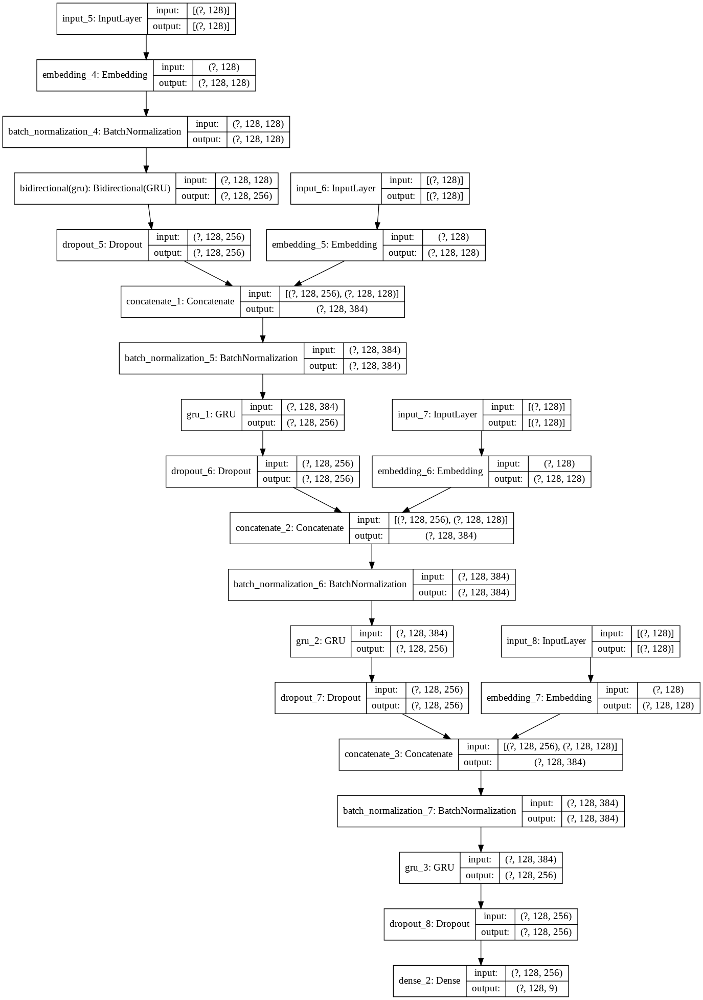

In [156]:
input_pos = Input((sent_len,))
x_pos = Embedding(num_words, emb_size)(input_pos)
x_pos = BatchNormalization()(x_pos)
x_pos = Bidirectional(GRU(emb_size, return_sequences=True))(x_pos)
x_pos = Dropout(0.2)(x_pos)

input_case = Input((sent_len,))
x_case = Embedding(num_words, emb_size)(input_case)

input_lang = Input((sent_len,))
x_lang = Embedding(num_words, emb_size)(input_lang)

input_norms = Input((sent_len,))
x_norms = Embedding(num_words, emb_size)(input_norms)

x = concatenate([x_pos, x_case])
x = BatchNormalization()(x)
x = GRU(emb_size * 2, return_sequences=True)(x)
x = Dropout(0.2)(x)

x = concatenate([x, x_lang])
x = BatchNormalization()(x)
x = GRU(emb_size * 2, return_sequences=True)(x)
x = Dropout(0.2)(x)

x = concatenate([x, x_norms])
x = BatchNormalization()(x)
x = GRU(emb_size * 2, return_sequences=True)(x)
x = Dropout(0.2)(x)

output = Dense(colors_count, activation='softmax')(x)

modelEGRU = Model(inputs=[input_pos, input_case, input_lang, input_norms], outputs=output)

modelEGRU.compile(loss='categorical_crossentropy', optimizer='adam', metrics=[dice_coef])
# modelEGRU.compile(loss='categorical_crossentropy', optimizer=RMSprop(lr=1e-4), metrics=[dice_coef, AUC(num_thresholds=150)])

plot_model(modelEGRU, show_shapes=True)

In [157]:
historyEGRU = modelEGRU.fit(x=[Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms], y=Ytrain,
                            epochs=100, batch_size=128,
                            validation_data=([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms], Ytest),  
                            callbacks=callbacks_list,
                            verbose=1)
                    
modelEGRU.save( '/content/drive/My Drive/tmp/modelEGRU_100epochs(gl_extr).h5' )

Epoch 1/100
24/24 [==============================] - ETA: 0s - loss: 0.4838 - dice_coef: 0.8156
Epoch 00001: val_dice_coef improved from -inf to 0.03768, saving model to /content/drive/My Drive/tmp/weights_epoch_1
24/24 [==============================] - 4s 163ms/step - loss: 0.4838 - dice_coef: 0.8156 - val_loss: 3.6208 - val_dice_coef: 0.0377
Epoch 2/100
24/24 [==============================] - ETA: 0s - loss: 0.1574 - dice_coef: 0.9273
Epoch 00002: val_dice_coef did not improve from 0.03768
24/24 [==============================] - 2s 91ms/step - loss: 0.1574 - dice_coef: 0.9273 - val_loss: 4.4042 - val_dice_coef: 0.0303
Epoch 3/100
24/24 [==============================] - ETA: 0s - loss: 0.1276 - dice_coef: 0.9416
Epoch 00003: val_dice_coef improved from 0.03768 to 0.04982, saving model to /content/drive/My Drive/tmp/weights_epoch_3
24/24 [==============================] - 2s 98ms/step - loss: 0.1276 - dice_coef: 0.9416 - val_loss: 3.4386 - val_dice_coef: 0.0498
Epoch 4/100
24/24 [=

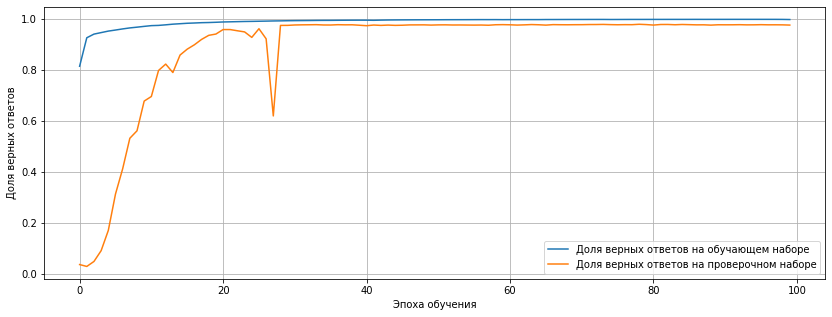

In [158]:
# Отобразим график обучения модели
plt.figure(figsize=(14, 5))
plt.plot(historyEGRU.history['dice_coef'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(historyEGRU.history['val_dice_coef'], 
         label='Доля верных ответов на проверочном наборе')
plt.grid(True)
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()


**Проверка тренировочной выборки (насколько хорошо выучены примеры)**

In [ ]:
YpredEGRU_train = modelEGRU.predict([Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms])

In [ ]:
for i, el in enumerate(paragraphs_train_2):
  print(f'{i+1}.')
  print(colorize_the_text(el, Ytrain[i]))
  print(colorize_the_text(el, YpredEGRU_train[i]))

*Чтобы память не забивать, результат 100%-го совпадения предсказаний с разметкой обучающей выборки удалён из текста*

**Проверка тестовой выборки (насколько хорошо обучена сеть)**

In [164]:
YpredEGRU_test = modelEGRU.predict([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms])
YpredEGRU_test, Ytest_res, paragraphs_test_res = cleansed_data(YpredEGRU_test, Ytest, paragraphs_test_2) # нехорошие данные здесь всё-таки подчищаем

Очищено фраз: 10


In [165]:
# выбираем конкретную фразу из тестовой выборки
i = 254 - 1
print(f'{i}.')
print(colorize_the_text(paragraphs_test_res[i], Ytest_res[i]))
print(colorize_the_text(paragraphs_test_res[i], YpredEGRU_test[i]))

253.
 input ( ) – для ввода данных с клавиатуры
 input ( ) – для ввода данных с клавиатуры


In [166]:
# воспроизводим все фразы из тестовой выборки
for i, el in enumerate(paragraphs_test_res):
  print(f'{i+1}.')
  print(colorize_the_text(el, Ytest_res[i]))
  print(colorize_the_text(el, YpredEGRU_test[i]))

# На github не отображается расцветка текста
# Чтобы её посмотреть, воспользуйтесь ссылкой на https://colab.research.google.com/

1.
 Свойство — необходимое условие принадлежности классу .
 Свойство — необходимое условие принадлежности классу .
2.
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее понятие .
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее понятие .
3.
 Ветвление — однократное выполнение одной из двух или более операций , в зависимости от выполнения заданного условия .
 Ветвление — однократное выполнение одной из двух или более операций , в зависимости от выполнения заданного условия .
4.
 Локальные переменные – это переменные , объявленные внутри любого блока программы .
 Локальные пере

In [167]:
# Встроенная функция sklearn возвращает и точность и полноту по классам
print(classification_report(Ytest_res.argmax(axis=-1).flatten(), 
                            YpredEGRU_test.argmax(axis=-1).flatten(), 
                            target_names=list(tag_tokenizer.index_word.values())))  

                   precision    recall  f1-score   support

                o       0.99      1.00      0.99     44877
      расшифровка       0.89      0.86      0.88      2042
      определение       0.92      0.90      0.91      1695
           термин       0.92      0.91      0.91       781
           связка       0.95      0.94      0.95       558
дубль-определение       0.60      0.50      0.55       147
     дубль-термин       0.77      0.76      0.77       187
     дубль-связка       0.59      0.46      0.52        65
дубль-расшифровка       0.42      0.25      0.31        80

         accuracy                           0.98     50432
        macro avg       0.78      0.73      0.75     50432
     weighted avg       0.98      0.98      0.98     50432



#### Algorithm: Embedding + Bidirectional(GRU) + GRU , batch_size = 128, activation='softmax'

*Параллельная архитектура*

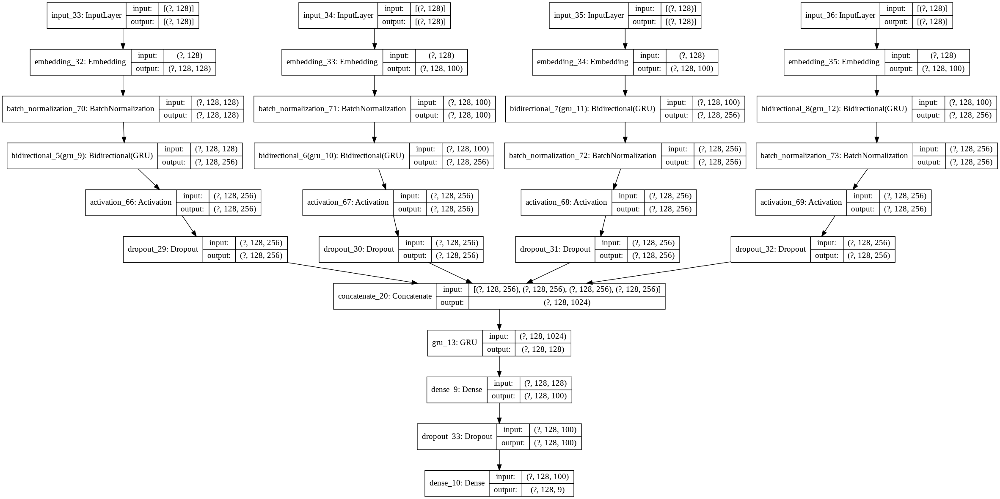

In [367]:
# параллельная архитектура
input_pos = Input((sent_len,))
x_pos = Embedding(num_words, emb_size)(input_pos)
x_pos = BatchNormalization()(x_pos)
x_pos = Bidirectional(GRU(emb_size, return_sequences=True))(x_pos)
x_pos = Activation('relu')(x_pos)
x_pos = Dropout(0.2)(x_pos)

input_case = Input((sent_len,))
x_case = Embedding(num_words, embedding_size)(input_case)
x_case = BatchNormalization()(x_case)
x_case = Bidirectional(GRU(emb_size, return_sequences=True))(x_case)
x_case = Activation('relu')(x_case)
x_case = Dropout(0.2)(x_case)

input_lang = Input((sent_len,))
x_lang = Embedding(num_words, embedding_size)(input_lang)
x_lang = Bidirectional(GRU(emb_size, return_sequences=True))(x_lang)
x_lang = BatchNormalization()(x_lang)
x_lang = Activation('relu')(x_lang)
x_lang = Dropout(0.2)(x_lang)

input_norms = Input((sent_len,))
x_norms = Embedding(num_words, embedding_size)(input_norms)
x_norms = Bidirectional(GRU(emb_size, return_sequences=True))(x_norms)
x_norms = BatchNormalization()(x_norms)
x_norms = Activation('relu')(x_norms)
x_norms = Dropout(0.2)(x_norms)

x = concatenate([x_pos, x_case, x_lang, x_norms])

x = GRU(emb_size, return_sequences=True)(x)
# x = BatchNormalization()(x)
x = Dense(100, activation='relu')(x)
x = Dropout(0.2)(x)

output = Dense(colors_count, activation='softmax')(x)

modelEGRUpar = Model(inputs=[input_pos, input_case, input_lang, input_norms], outputs=output)

modelEGRUpar.compile(loss='categorical_crossentropy', optimizer='adam', metrics=[dice_coef])
# modelEGRUpar.compile(loss='categorical_crossentropy', optimizer=RMSprop(lr=1e-4), metrics=[dice_coef, AUC(num_thresholds=150)])

plot_model(modelEGRUpar, show_shapes=True)

In [368]:
historyEGRUpar = modelEGRUpar.fit(x=[Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms], y=Ytrain,
                            epochs=100, batch_size=128,
                            validation_data=([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms], Ytest),  
                            callbacks=callbacks_list,
                            verbose=1)
                    
modelEGRUpar.save( '/content/drive/My Drive/tmp/modelEGRU_100epochs(gl_extr_par).h5' )

Epoch 1/100
24/24 [==============================] - ETA: 0s - loss: 0.4010 - dice_coef: 0.8063
Epoch 00001: val_dice_coef improved from -inf to 0.88717, saving model to /content/drive/My Drive/tmp/weights_epoch_1
24/24 [==============================] - 5s 214ms/step - loss: 0.4010 - dice_coef: 0.8063 - val_loss: 0.3083 - val_dice_coef: 0.8872
Epoch 2/100
24/24 [==============================] - ETA: 0s - loss: 0.1663 - dice_coef: 0.9226
Epoch 00002: val_dice_coef improved from 0.88717 to 0.88727, saving model to /content/drive/My Drive/tmp/weights_epoch_2
24/24 [==============================] - 3s 120ms/step - loss: 0.1663 - dice_coef: 0.9226 - val_loss: 0.2934 - val_dice_coef: 0.8873
Epoch 3/100
24/24 [==============================] - ETA: 0s - loss: 0.1322 - dice_coef: 0.9378
Epoch 00003: val_dice_coef did not improve from 0.88727
24/24 [==============================] - 3s 114ms/step - loss: 0.1322 - dice_coef: 0.9378 - val_loss: 0.2781 - val_dice_coef: 0.8873
Epoch 4/100
24/24 

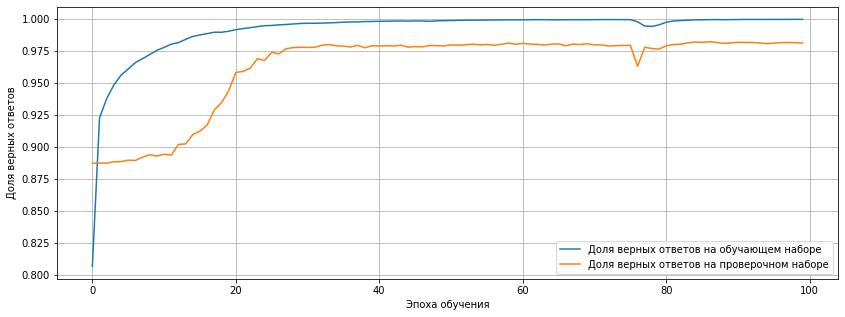

In [374]:
# Отобразим график обучения модели
plt.figure(figsize=(14, 5))
plt.plot(historyEGRUpar.history['dice_coef'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(historyEGRUpar.history['val_dice_coef'], 
         label='Доля верных ответов на проверочном наборе')
plt.grid(True)
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()


**Проверка тренировочной выборки (насколько хорошо выучены примеры)**

In [375]:
YpredEGRU_train_par = modelEGRUpar.predict([Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms])

In [ ]:
for i, el in enumerate(paragraphs_train):
  print(f'{i+1}.')
  print(colorize_the_text(el, Ytrain[i]))
  print(colorize_the_text(el, YpredEGRU_train_par[i]))

*Чтобы память не забивать, результат 100%-го совпадения предсказаний с разметкой обучающей выборки удалён из текста*

**Проверка тестовой выборки (насколько хорошо обучена сеть)**

In [379]:
YpredEGRU_test_par = modelEGRUpar.predict([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms])
YpredEGRU_test_par, Ytest_par_res, paragraphs_test_par_res = cleansed_data(YpredEGRU_test_par, Ytest, paragraphs_test_2) # нехорошие данные здесь всё-таки подчищаем

Очищено фраз: 20


In [380]:
# выбираем конкретную фразу из тестовой выборки
i = 2 - 1
print(f'{i}.')
print(colorize_the_text(paragraphs_test_par_res[i], Ytest_par_res[i]))
print(colorize_the_text(paragraphs_test_par_res[i], YpredEGRU_test_par[i]))

1.
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее понятие .
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее понятие .


In [381]:
# воспроизводим все фразы из тестовой выборки
for i, el in enumerate(paragraphs_test_par_res):
  print(f'{i+1}.')
  print(colorize_the_text(el, Ytest_par_res[i]))
  print(colorize_the_text(el, YpredEGRU_test_par[i]))

# На github не отображается расцветка текста
# Чтобы её посмотреть, воспользуйтесь ссылкой на https://colab.research.google.com/

1.
 Свойство — необходимое условие принадлежности классу .
 Свойство — необходимое условие принадлежности классу .
2.
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее понятие .
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее понятие .
3.
 Ветвление — однократное выполнение одной из двух или более операций , в зависимости от выполнения заданного условия .
 Ветвление — однократное выполнение одной из двух или более операций , в зависимости от выполнения заданного условия .
4.
 Локальные переменные – это переменные , объявленные внутри любого блока программы .
 Локальные пере

In [382]:
# Встроенная функция sklearn возвращает и точность и полноту по классам 
print(classification_report(Ytest_par_res.argmax(axis=-1).flatten(), 
                            YpredEGRU_test_par.argmax(axis=-1).flatten(), 
                            target_names=list(tag_tokenizer.index_word.values())))  

                   precision    recall  f1-score   support

                o       0.99      1.00      0.99     44293
      расшифровка       0.91      0.85      0.88      2025
      определение       0.90      0.95      0.93      1679
           термин       0.94      0.92      0.93       764
           связка       0.95      0.94      0.95       552
дубль-определение       0.69      0.44      0.54       147
     дубль-термин       0.79      0.75      0.77       187
     дубль-связка       0.85      0.45      0.59        65
дубль-расшифровка       0.70      0.17      0.28        80

         accuracy                           0.98     49792
        macro avg       0.86      0.72      0.76     49792
     weighted avg       0.98      0.98      0.98     49792



### **One-dimensional convolution**

#### Алгоритм: Embedding + Conv1D , batch_size = 16, activation='softmax'

*Последовательная архитектура*

In [176]:
'''
  Функция создания сети
    Входные параметры:
    - num_classes - количество классов для рапознавания
    - sentence_len - длина предложения
    - num_words - количество слов в словаре
    - embedding_size - длина эмбединга
'''
def pseudoLinearSegmentationNet(
      num_classes = 9,
      sentence_len = 200,
      num_words = 5000,
      activation_function = 'softmax',
      embedding_size = 500
      ):
    input_pos = Input((sentence_len,))
    x_pos = Embedding(num_words, embedding_size)(input_pos)
    x_pos = Conv1D(64, 3, padding='same', name='input1_conv1')(x_pos)
    x_pos = BatchNormalization()(x_pos)
    x_pos = Activation('relu')(x_pos)

    input_case = Input((sentence_len,))
    x_case = Embedding(num_words, embedding_size)(input_case)

    input_lang = Input((sentence_len,))
    x_lang = Embedding(num_words, embedding_size)(input_lang)

    input_norms = Input((sentence_len,))
    x_norms = Embedding(num_words, embedding_size)(input_norms)

    x = concatenate([x_pos, x_case])
    x = Conv1D(128, 5, padding='same', name='input2_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, x_lang])
    x = Conv1D(128, 5, padding='same', name='input3_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, x_norms])
    x = Conv1D(128, 5, padding='same', name='input4_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = LSTM(128, return_sequences=True)(x)
    x = SpatialDropout1D(0.2)(x)
    # x = BatchNormalization()(x)
    x = Dense(100, activation='relu')(x)
    x = Dropout(0.2)(x)

    # x = Dropout(0.2)(x)
    output = Conv1D(num_classes,3, activation=activation_function, padding='same')(x)

    model = Model(inputs=[input_pos, input_case, input_lang, input_norms], outputs=output)

    model.compile(optimizer='rmsprop', 
                  loss='categorical_crossentropy',
                  metrics=[dice_coef])

    return model # Возвращаем сформированную модель

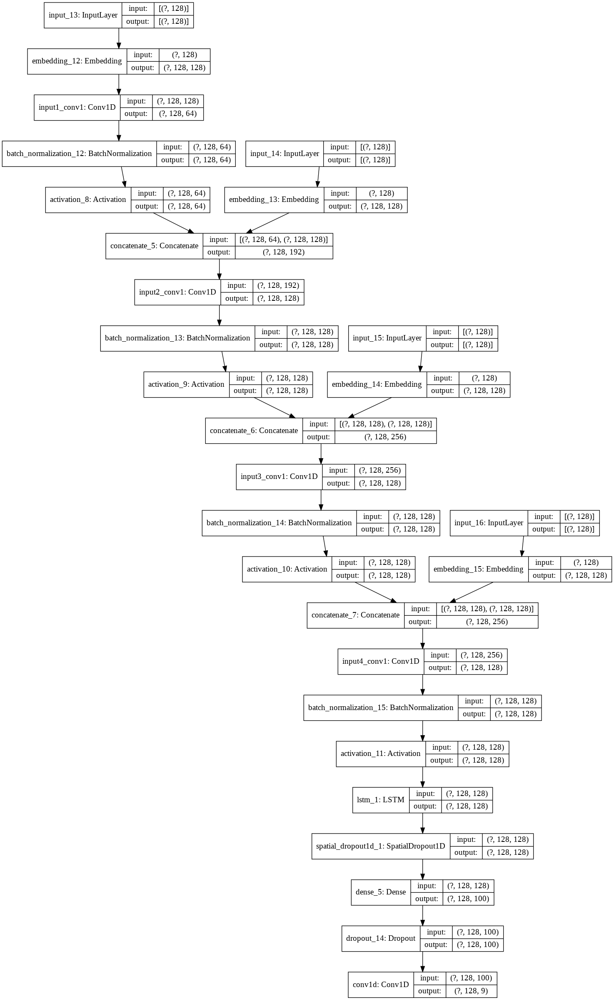

In [177]:
modelL = pseudoLinearSegmentationNet(colors_count, sent_len, num_words, 'softmax', emb_size) # Создаем модель linearSegmentationNet
plot_model(modelL, show_shapes=True)

In [178]:
historyL = modelL.fit(x=[Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms], y=Ytrain, 
                      epochs=100, batch_size=64,
                      validation_data=([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms], Ytest)) # Обучаем модель на выборке по всем классам

Epoch 1/100
48/48 [==============================] - 2s 37ms/step - loss: 0.2975 - dice_coef: 0.8655 - val_loss: 0.3746 - val_dice_coef: 0.8876
Epoch 2/100
48/48 [==============================] - 1s 24ms/step - loss: 0.1596 - dice_coef: 0.9272 - val_loss: 0.4147 - val_dice_coef: 0.8929
Epoch 3/100
48/48 [==============================] - 1s 24ms/step - loss: 0.1336 - dice_coef: 0.9388 - val_loss: 0.4774 - val_dice_coef: 0.8986
Epoch 4/100
48/48 [==============================] - 1s 24ms/step - loss: 0.1176 - dice_coef: 0.9466 - val_loss: 0.3988 - val_dice_coef: 0.9057
Epoch 5/100
48/48 [==============================] - 1s 24ms/step - loss: 0.1042 - dice_coef: 0.9522 - val_loss: 0.2678 - val_dice_coef: 0.9100
Epoch 6/100
48/48 [==============================] - 1s 24ms/step - loss: 0.0937 - dice_coef: 0.9568 - val_loss: 0.2124 - val_dice_coef: 0.9141
Epoch 7/100
48/48 [==============================] - 1s 24ms/step - loss: 0.0839 - dice_coef: 0.9605 - val_loss: 0.1918 - val_dice_coef:

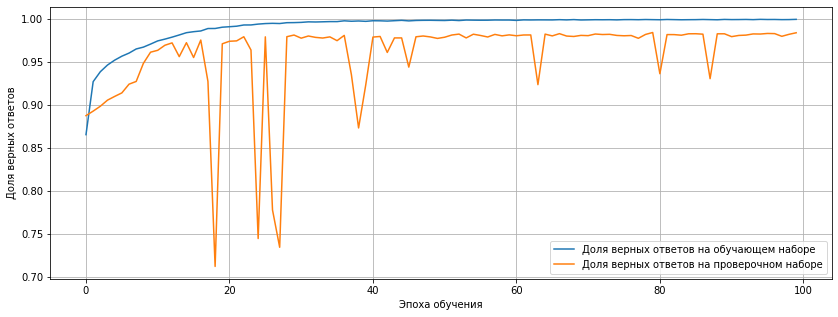

In [179]:
# Отобразим график обучения модели
plt.figure(figsize=(14, 5))
plt.plot(historyL.history['dice_coef'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(historyL.history['val_dice_coef'], 
         label='Доля верных ответов на проверочном наборе')
plt.grid(True)
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()

In [180]:
YpredL_test = modelL.predict([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms])
YpredL_test, Ytest_res, paragraphs_test_res = cleansed_data(YpredL_test, Ytest, paragraphs_test_2) # нехорошие данные здесь всё-таки подчищаем

Очищено фраз: 14


In [181]:
# Встроенная функция sklearn возвращает и точность и полноту по классам
print(classification_report(Ytest_res.argmax(axis=-1).flatten(), 
                            YpredL_test.argmax(axis=-1).flatten(), 
                            target_names=list(tag_tokenizer.index_word.values())))  

                   precision    recall  f1-score   support

                o       0.99      1.00      0.99     44390
      расшифровка       0.92      0.91      0.91      2036
      определение       0.95      0.91      0.93      1687
           термин       0.94      0.92      0.93       774
           связка       0.92      0.97      0.94       554
дубль-определение       0.85      0.62      0.72       147
     дубль-термин       0.84      0.79      0.81       187
     дубль-связка       0.72      0.52      0.61        65
дубль-расшифровка       0.61      0.34      0.44        80

         accuracy                           0.99     49920
        macro avg       0.86      0.78      0.81     49920
     weighted avg       0.98      0.99      0.98     49920



**Проверка тестовой выборки (насколько хорошо обучена сеть)**

In [182]:
# выбираем конкретную фразу из тестовой выборки
i = 2 - 1
print(f'{i}.')
print(colorize_the_text(paragraphs_test_res[i], Ytest_res[i]))
print(colorize_the_text(paragraphs_test_res[i], YpredL_test[i]))

1.
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее понятие .
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее понятие .


In [183]:
# воспроизводим все фразы из тестовой выборки
for i, el in enumerate(paragraphs_test_res):
  print(f'{i+1}.')
  print(colorize_the_text(el, Ytest_res[i]))
  print(colorize_the_text(el, YpredL_test[i]))

# На github не отображается расцветка текста
# Чтобы её посмотреть, воспользуйтесь ссылкой на https://colab.research.google.com/

1.
 Свойство — необходимое условие принадлежности классу .
 Свойство — необходимое условие принадлежности классу .
2.
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее понятие .
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее понятие .
3.
 Ветвление — однократное выполнение одной из двух или более операций , в зависимости от выполнения заданного условия .
 Ветвление — однократное выполнение одной из двух или более операций , в зависимости от выполнения заданного условия .
4.
 Локальные переменные – это переменные , объявленные внутри любого блока программы .
 Локальные пере

#### Алгоритм: Embedding + Conv1D , batch_size = 16, activation='softmax'

*Параллельная архитектура*

In [184]:
'''
  Функция создания сети
    Входные параметры:
    - num_classes - количество классов для рапознавания
    - sentence_len - длина предложения
    - num_words - количество слов в словаре
    - embedding_size - длина эмбединга
'''
def pseudoLinearSegmentationNet_par(
      num_classes = 9,
      sentence_len = 200,
      num_words = 5000,
      activation_function = 'softmax',
      embedding_size = 500
      ):
    input_pos = Input((sentence_len,))
    x_pos = Embedding(num_words, embedding_size)(input_pos)
    x_pos = Conv1D(64, 3, padding='same', name='input1_conv1')(x_pos)
    x_pos = BatchNormalization()(x_pos)
    x_pos = Activation('relu')(x_pos)
    x_pos = Dropout(0.2)(x_pos)

    input_case = Input((sentence_len,))
    x_case = Embedding(num_words, embedding_size)(input_case)
    x_case = Conv1D(64, 3, padding='same', name='input2_conv1')(x_case)
    x_case = BatchNormalization()(x_case)
    x_case = Activation('relu')(x_case)
    x_case = Dropout(0.2)(x_case)

    input_lang = Input((sentence_len,))
    x_lang = Embedding(num_words, embedding_size)(input_lang)
    x_lang = Conv1D(64, 3, padding='same', name='input3_conv1')(x_lang)
    x_lang = BatchNormalization()(x_lang)
    x_lang = Activation('relu')(x_lang)
    x_lang = Dropout(0.2)(x_lang)

    input_norms = Input((sentence_len,))
    x_norms = Embedding(num_words, embedding_size)(input_norms)
    x_norms = Conv1D(64, 3, padding='same', name='input4_conv1')(x_norms)
    x_norms = BatchNormalization()(x_norms)
    x_norms = Activation('relu')(x_norms)
    x_norms = Dropout(0.2)(x_norms)

    x = concatenate([x_pos, x_case, x_lang, x_norms])

    x = LSTM(128, return_sequences=True)(x)
    x = SpatialDropout1D(0.2)(x)
    # x = BatchNormalization()(x)
    x = Dense(100, activation='relu')(x)
    x = Dropout(0.2)(x)

    # x = Dropout(0.2)(x)
    output = Conv1D(num_classes,3, activation=activation_function, padding='same')(x)

    model = Model(inputs=[input_pos, input_case, input_lang, input_norms], outputs=output)

    model.compile(optimizer='rmsprop', 
                  loss='categorical_crossentropy',
                  metrics=[dice_coef])

    return model # Возвращаем сформированную модель

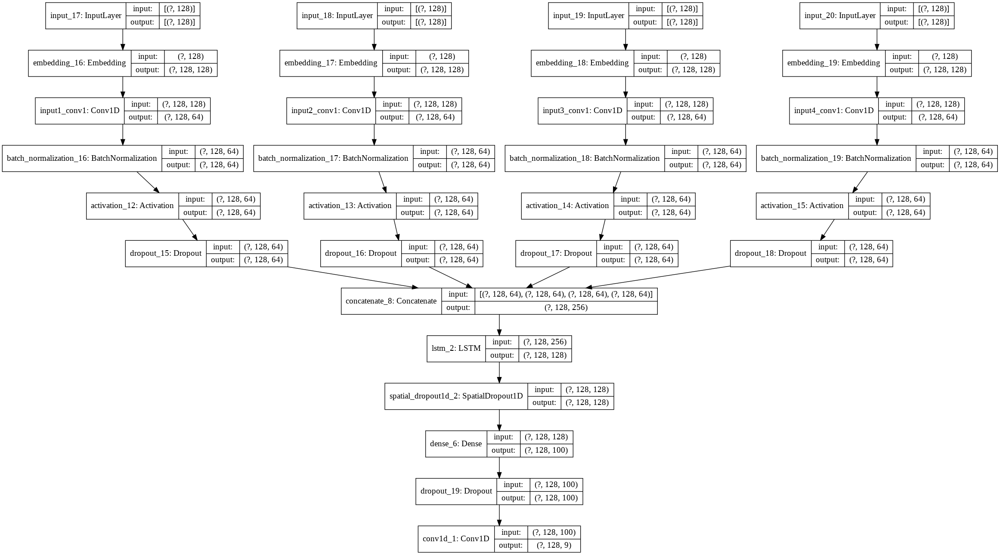

In [185]:
modelL_par = pseudoLinearSegmentationNet_par(colors_count, sent_len, num_words, 'softmax', emb_size) # Создаем модель linearSegmentationNet
plot_model(modelL_par, show_shapes=True)

In [186]:
historyL_par = modelL_par.fit(x=[Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms], y=Ytrain, 
                      epochs=100, batch_size=64,
                      validation_data=([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms], Ytest)) # Обучаем модель на выборке по всем классам

Epoch 1/100
48/48 [==============================] - 1s 31ms/step - loss: 0.2638 - dice_coef: 0.8783 - val_loss: 0.3256 - val_dice_coef: 0.8468
Epoch 2/100
48/48 [==============================] - 1s 21ms/step - loss: 0.1521 - dice_coef: 0.9299 - val_loss: 0.2886 - val_dice_coef: 0.8751
Epoch 3/100
48/48 [==============================] - 1s 21ms/step - loss: 0.1253 - dice_coef: 0.9430 - val_loss: 0.3201 - val_dice_coef: 0.8894
Epoch 4/100
48/48 [==============================] - 1s 21ms/step - loss: 0.1060 - dice_coef: 0.9510 - val_loss: 0.2590 - val_dice_coef: 0.8975
Epoch 5/100
48/48 [==============================] - 1s 21ms/step - loss: 0.0909 - dice_coef: 0.9571 - val_loss: 0.2672 - val_dice_coef: 0.9044
Epoch 6/100
48/48 [==============================] - 1s 21ms/step - loss: 0.0824 - dice_coef: 0.9616 - val_loss: 0.1977 - val_dice_coef: 0.9171
Epoch 7/100
48/48 [==============================] - 1s 21ms/step - loss: 0.0730 - dice_coef: 0.9658 - val_loss: 0.1780 - val_dice_coef:

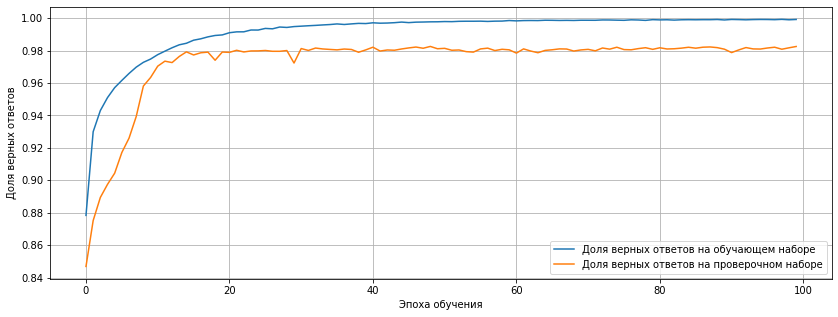

In [187]:
# Отобразим график обучения модели
plt.figure(figsize=(14, 5))
plt.plot(historyL_par.history['dice_coef'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(historyL_par.history['val_dice_coef'], 
         label='Доля верных ответов на проверочном наборе')
plt.grid(True)
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()

In [192]:
YpredL_par = modelL_par.predict([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms])
YpredL_par, Ytest_par_res, paragraphs_par_test_res = cleansed_data(YpredL_par, Ytest, paragraphs_test_2) # нехорошие данные здесь всё-таки подчищаем


Очищено фраз: 8


In [193]:
# Встроенная функция sklearn возвращает и точность и полноту по классам
print(classification_report(Ytest_par_res.argmax(axis=-1).flatten(), 
                            YpredL_par.argmax(axis=-1).flatten(), 
                            target_names=list(tag_tokenizer.index_word.values())))  

                   precision    recall  f1-score   support

                o       0.99      1.00      0.99     45133
      расшифровка       0.89      0.91      0.90      2040
      определение       0.93      0.92      0.93      1700
           термин       0.94      0.87      0.90       778
           связка       0.95      0.94      0.95       558
дубль-определение       0.76      0.60      0.67       147
     дубль-термин       0.71      0.83      0.77       187
     дубль-связка       0.59      0.54      0.56        65
дубль-расшифровка       0.61      0.42      0.50        80

         accuracy                           0.98     50688
        macro avg       0.82      0.78      0.80     50688
     weighted avg       0.98      0.98      0.98     50688



**Проверка тестовой выборки (насколько хорошо обучена сеть)**

In [194]:
# выбираем конкретную фразу из тестовой выборки
i = 2 - 1
print(f'{i}.')
print(colorize_the_text(paragraphs_par_test_res[i], Ytest_par_res[i]))
print(colorize_the_text(paragraphs_par_test_res[i], YpredL_par[i]))

1.
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее понятие .
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее понятие .


In [191]:
# воспроизводим все фразы из тестовой выборки
for i, el in enumerate(paragraphs_par_test_res):
  print(f'{i+1}.')
  print(colorize_the_text(el, Ytest_par_res[i]))
  print(colorize_the_text(el, YpredL_par[i]))

# На github не отображается расцветка текста
# Чтобы её посмотреть, воспользуйтесь ссылкой на https://colab.research.google.com/

1.
 Свойство — необходимое условие принадлежности классу .
 Свойство — необходимое условие принадлежности классу .
2.
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее понятие .
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее понятие .
3.
 Ветвление — однократное выполнение одной из двух или более операций , в зависимости от выполнения заданного условия .
 Ветвление — однократное выполнение одной из двух или более операций , в зависимости от выполнения заданного условия .
4.
 Локальные переменные – это переменные , объявленные внутри любого блока программы .
 Локальные пере

### **U-net**

#### U-net classic

*Последовательная архитектура*



In [195]:
'''
  Функция создания сети
    Входные параметры:
    - num_classes - количество классов
    - sentence_len - длина предложения
    - num_words - количество слов в словаре
    - embedding_size - длина эмбединга
'''

def unet(
      num_classes = 6,
      sentence_len = 200,
      num_words = 5000,
      activation_function = 'softmax',
      embedding_size = 50
      ):
    input_pos = Input((sentence_len,))
    x_pos = Embedding(num_words, embedding_size)(input_pos)
    x_pos = Conv1D(64, 3, padding='same', name='input1_conv1')(x_pos)
    x_pos = BatchNormalization()(x_pos)
    x_pos = Activation('relu')(x_pos)

    input_case = Input((sentence_len,))
    x_case = Embedding(num_words, embedding_size)(input_case)

    input_lang = Input((sentence_len,))
    x_lang = Embedding(num_words, embedding_size)(input_lang)

    input_norms = Input((sentence_len,))
    x_norms = Embedding(num_words, embedding_size)(input_norms)

    x = concatenate([x_pos, x_case])
    x = Conv1D(128, 5, padding='same', name='input2_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, x_lang])
    x = Conv1D(128, 5, padding='same', name='input3_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, x_norms])
    x = Conv1D(128, 5, padding='same', name='input4_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)


    # Block 1
    x = Conv1D(64, 3, padding='same', name='block1_conv1')(x) # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same', name='block1_conv2')(x)         # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_1_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_1_out

    x = MaxPooling1D()(block_1_out)                                        # Добавляем слой MaxPooling1D

    # Block 2
    x = Conv1D(128, 3, padding='same', name='block2_conv1')(x)        # Добавляем Conv1D-слой с 128-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(128, 3, padding='same', name='block2_conv2')(x)        # Добавляем Conv1D-слой с 128-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_2_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_2_out

    x = MaxPooling1D()(block_2_out)                                        # Добавляем слой MaxPooling1D

    # Block 3
    x = Conv1D(256, 3, padding='same', name='block3_conv1')(x)        # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same', name='block3_conv2')(x)        # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same', name='block3_conv3')(x)        # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_3_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_3_out

    x = MaxPooling1D()(block_3_out)                                        # Добавляем слой MaxPooling1D

    # Block 4
    x = Conv1D(512, 3, padding='same', name='block4_conv1')(x)        # Добавляем Conv1D-слой с 512-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block4_conv2')(x)        # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block4_conv3')(x)        # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_4_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_4_out
    x = block_4_out 

    # UP 2
    # x = Conv1DTranspose(x, 256, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 256 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(256, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = concatenate([x, block_3_out])                                      # Объединем текущий слой со слоем block_3_out
    x = Conv1D(256, 3, padding='same')(x)                             # Добавляем слой Conv1D с 256 нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same')(x)
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    # UP 3
    # x = Conv1DTranspose(x, 128, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 128 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(128, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = concatenate([x, block_2_out])                                      # Объединем текущий слой со слоем block_2_out
    x = Conv1D(128, 3, padding='same')(x)                             # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(128, 3, padding='same')(x) # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x) # Добавляем слой BatchNormalization
    x = Activation('relu')(x) # Добавляем слой Activation

    # UP 4
    # x = Conv1DTranspose(x, 64, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 64 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(64, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x) # Добавляем слой BatchNormalization
    x = Activation('relu')(x) # Добавляем слой Activation

    x = concatenate([x, block_1_out])  # Объединем текущий слой со слоем block_1_out
    x = Conv1D(64, 3, padding='same')(x) # Добавляем слой Conv1D с 64 нейронами
    x = BatchNormalization()(x) # Добавляем слой BatchNormalization
    x = Activation('relu')(x) # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same')(x) # Добавляем слой Conv1D с 64 нейронами
    x = BatchNormalization()(x) # Добавляем слой BatchNormalization
    x = Activation('relu')(x) # Добавляем слой Activation

    x = Conv1D(num_classes, 3, activation='softmax', padding='same')(x)  # Добавляем Conv1D-Слой с softmax-активацией на num_classes-нейронов

    model = Model([input_pos, input_case, input_lang, input_norms], x)                                   # Создаем модель со входами и выходом 'x'

    # Компилируем модель 
    model.compile(optimizer=Adam(),
                  loss='categorical_crossentropy',
                  metrics=[dice_coef])
    
    return model # Возвращаем сформированную модель

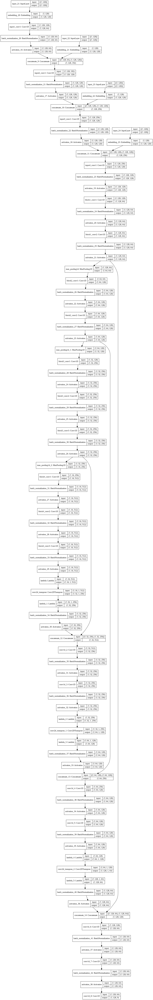

In [196]:
modelUnet = unet(colors_count, sent_len, num_words, 'softmax', emb_size) # Создаем модель unet
plot_model(modelUnet, show_shapes=True)

In [197]:
historyUnet = modelUnet.fit(x=[Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms], y=Ytrain, 
                            epochs=100, batch_size=64,
                            validation_data=([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms], Ytest),  
                            callbacks=callbacks_list, verbose=1)                    
modelUnet.save( '/content/drive/My Drive/tmp/modelUnet_100epochs(gl_extr).h5' )

Epoch 1/100
48/48 [==============================] - ETA: 0s - loss: 0.4498 - dice_coef: 0.7586
Epoch 00001: val_dice_coef did not improve from 0.98064
48/48 [==============================] - 3s 69ms/step - loss: 0.4498 - dice_coef: 0.7586 - val_loss: 0.7551 - val_dice_coef: 0.5621
Epoch 2/100
47/48 [============================>.] - ETA: 0s - loss: 0.1558 - dice_coef: 0.9242
Epoch 00002: val_dice_coef did not improve from 0.98064
48/48 [==============================] - 2s 38ms/step - loss: 0.1552 - dice_coef: 0.9244 - val_loss: 0.5704 - val_dice_coef: 0.8277
Epoch 3/100
47/48 [============================>.] - ETA: 0s - loss: 0.1272 - dice_coef: 0.9389
Epoch 00003: val_dice_coef did not improve from 0.98064
48/48 [==============================] - 2s 38ms/step - loss: 0.1273 - dice_coef: 0.9387 - val_loss: 0.6464 - val_dice_coef: 0.8738
Epoch 4/100
47/48 [============================>.] - ETA: 0s - loss: 0.1086 - dice_coef: 0.9477
Epoch 00004: val_dice_coef did not improve from 0.98

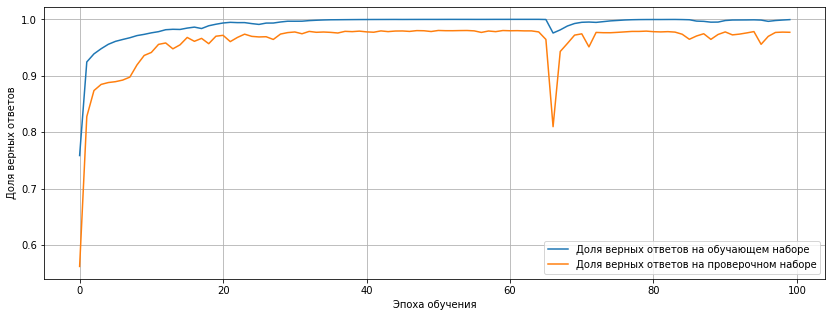

In [198]:
# Отобразим график обучения модели
plt.figure(figsize=(14, 5))
plt.plot(historyUnet.history['dice_coef'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(historyUnet.history['val_dice_coef'], 
         label='Доля верных ответов на проверочном наборе')
plt.grid(True)
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()

In [199]:
YpredUnet = modelUnet.predict([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms])
YpredUnet_test, Ytest_res, paragraphs_test_res = cleansed_data(YpredUnet, Ytest, paragraphs_test_2) # нехорошие данные здесь всё-таки подчищаем

Очищено фраз: 13


In [200]:
# Встроенная функция sklearn возвращает и точность и полноту по классам
print(classification_report(Ytest_res.argmax(axis=-1).flatten(), 
                            YpredUnet_test.argmax(axis=-1).flatten(), 
                            target_names=list(tag_tokenizer.index_word.values())))  

                   precision    recall  f1-score   support

                o       0.99      1.00      0.99     44517
      расшифровка       0.92      0.80      0.86      2028
      определение       0.89      0.91      0.90      1695
           термин       0.94      0.92      0.93       774
           связка       0.95      0.91      0.93       555
дубль-определение       0.57      0.61      0.59       147
     дубль-термин       0.75      0.75      0.75       187
     дубль-связка       0.68      0.42      0.51        65
дубль-расшифровка       0.38      0.26      0.31        80

         accuracy                           0.98     50048
        macro avg       0.79      0.73      0.75     50048
     weighted avg       0.98      0.98      0.98     50048



**Проверка тестовой выборки (насколько хорошо обучена сеть)**

In [201]:
# выбираем конкретную фразу из тестовой выборки
i = 2 
print(f'{i + 1}.')
print(colorize_the_text(paragraphs_test_res[i], Ytest_res[i]))
print(colorize_the_text(paragraphs_test_res[i], YpredUnet_test[i]))

3.
 Ветвление — однократное выполнение одной из двух или более операций , в зависимости от выполнения заданного условия .
 Ветвление — однократное выполнение одной из двух или более операций , в зависимости от выполнения заданного условия .


In [202]:
# воспроизводим все фразы из тестовой выборки
for i, el in enumerate(paragraphs_test_res):
  print(f'{i+1}.')
  print(colorize_the_text(el, Ytest_res[i]))
  print(colorize_the_text(el, YpredUnet_test[i]))

# На github не отображается расцветка текста
# Чтобы её посмотреть, воспользуйтесь ссылкой на https://colab.research.google.com/ выше

1.
 Свойство — необходимое условие принадлежности классу .
 Свойство — необходимое условие принадлежности классу .
2.
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее понятие .
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее понятие .
3.
 Ветвление — однократное выполнение одной из двух или более операций , в зависимости от выполнения заданного условия .
 Ветвление — однократное выполнение одной из двух или более операций , в зависимости от выполнения заданного условия .
4.
 Локальные переменные – это переменные , объявленные внутри любого блока программы .
 Локальные пере

#### U-net classic

*Параллельная архитектура*



In [203]:
'''
  Функция создания сети
    Входные параметры:
    - num_classes - количество классов
    - sentence_len - длина предложения
    - num_words - количество слов в словаре
    - embedding_size - длина эмбединга
'''

def unet_par(
      num_classes = 6,
      sentence_len = 200,
      num_words = 5000,
      activation_function = 'softmax',
      embedding_size = 50
      ):
    # параллельная архитектура
    input_pos = Input((sentence_len,))
    x_pos = Embedding(num_words, embedding_size)(input_pos)
    x_pos = BatchNormalization()(x_pos)
    x_pos = Conv1D(64, 3, padding='same', name='input1_conv1')(x_pos)
    x_pos = Activation('relu')(x_pos)
    x_pos = Dropout(0.2)(x_pos)

    input_case = Input((sentence_len,))
    x_case = Embedding(num_words, embedding_size)(input_case)
    x_case = BatchNormalization()(x_case)
    x_case = Conv1D(64, 3, padding='same', name='input2_conv1')(x_case)
    x_case = Activation('relu')(x_case)
    x_case = Dropout(0.2)(x_case)

    input_lang = Input((sentence_len,))
    x_lang = Embedding(num_words, embedding_size)(input_lang)
    x_lang = Conv1D(64, 3, padding='same', name='input3_conv1')(x_lang)
    x_lang = BatchNormalization()(x_lang)
    x_lang = Activation('relu')(x_lang)
    x_lang = Dropout(0.2)(x_lang)

    input_norms = Input((sentence_len,))
    x_norms = Embedding(num_words, embedding_size)(input_norms)
    x_norms = Conv1D(64, 3, padding='same', name='input4_conv1')(x_norms)
    x_norms = BatchNormalization()(x_norms)
    x_norms = Activation('relu')(x_norms)
    x_norms = Dropout(0.2)(x_norms)

    x = concatenate([x_pos, x_case, x_lang, x_norms])


    # Block 1
    x = Conv1D(64, 3, padding='same', name='block1_conv1')(x) # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same', name='block1_conv2')(x)         # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_1_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_1_out

    x = MaxPooling1D()(block_1_out)                                        # Добавляем слой MaxPooling1D

    # Block 2
    x = Conv1D(128, 3, padding='same', name='block2_conv1')(x)        # Добавляем Conv1D-слой с 128-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(128, 3, padding='same', name='block2_conv2')(x)        # Добавляем Conv1D-слой с 128-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_2_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_2_out

    x = MaxPooling1D()(block_2_out)                                        # Добавляем слой MaxPooling1D

    # Block 3
    x = Conv1D(256, 3, padding='same', name='block3_conv1')(x)        # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same', name='block3_conv2')(x)        # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same', name='block3_conv3')(x)        # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_3_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_3_out

    x = MaxPooling1D()(block_3_out)                                        # Добавляем слой MaxPooling1D

    # Block 4
    x = Conv1D(512, 3, padding='same', name='block4_conv1')(x)        # Добавляем Conv1D-слой с 512-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block4_conv2')(x)        # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block4_conv3')(x)        # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_4_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_4_out
    x = block_4_out 

    # UP 2
    # x = Conv1DTranspose(x, 256, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 256 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(256, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = concatenate([x, block_3_out])                                      # Объединем текущий слой со слоем block_3_out
    x = Conv1D(256, 3, padding='same')(x)                             # Добавляем слой Conv1D с 256 нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same')(x)
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    # UP 3
    # x = Conv1DTranspose(x, 128, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 128 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(128, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = concatenate([x, block_2_out])                                      # Объединем текущий слой со слоем block_2_out
    x = Conv1D(128, 3, padding='same')(x)                             # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(128, 3, padding='same')(x) # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x) # Добавляем слой BatchNormalization
    x = Activation('relu')(x) # Добавляем слой Activation

    # UP 4
    # x = Conv1DTranspose(x, 64, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 64 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(64, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x) # Добавляем слой BatchNormalization
    x = Activation('relu')(x) # Добавляем слой Activation

    x = concatenate([x, block_1_out])  # Объединем текущий слой со слоем block_1_out
    x = Conv1D(64, 3, padding='same')(x) # Добавляем слой Conv1D с 64 нейронами
    x = BatchNormalization()(x) # Добавляем слой BatchNormalization
    x = Activation('relu')(x) # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same')(x) # Добавляем слой Conv1D с 64 нейронами
    x = BatchNormalization()(x) # Добавляем слой BatchNormalization
    x = Activation('relu')(x) # Добавляем слой Activation

    x = Conv1D(num_classes, 3, activation='softmax', padding='same')(x)  # Добавляем Conv1D-Слой с softmax-активацией на num_classes-нейронов

    model = Model([input_pos, input_case, input_lang, input_norms], x)                                   # Создаем модель со входами и выходом 'x'

    # Компилируем модель 
    model.compile(optimizer=Adam(),
                  loss='categorical_crossentropy',
                  metrics=[dice_coef])
    
    return model # Возвращаем сформированную модель

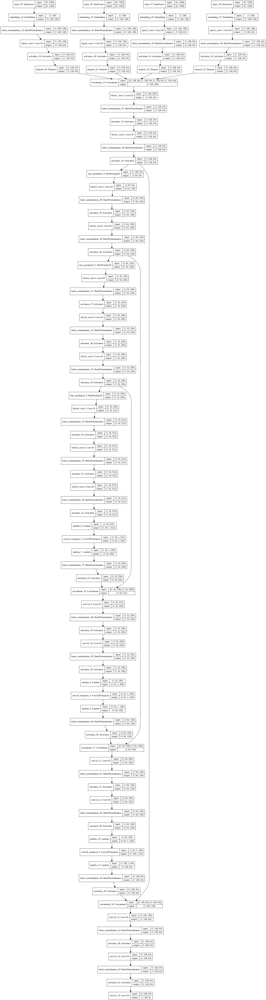

In [204]:
modelUnet_par = unet_par(colors_count, sent_len, num_words, 'softmax', emb_size) # Создаем модель unet
plot_model(modelUnet_par, show_shapes=True)

In [205]:
historyUnet_par = modelUnet_par.fit(x=[Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms], y=Ytrain, 
                            epochs=100, batch_size=64,
                            validation_data=([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms], Ytest),  
                            callbacks=callbacks_list, verbose=1)                    
modelUnet.save( '/content/drive/My Drive/tmp/modelUnet_100epochs(gl_extr_par).h5' )

Epoch 1/100
48/48 [==============================] - ETA: 0s - loss: 0.8873 - dice_coef: 0.5696
Epoch 00001: val_dice_coef did not improve from 0.98064
48/48 [==============================] - 2s 51ms/step - loss: 0.8873 - dice_coef: 0.5696 - val_loss: 0.7328 - val_dice_coef: 0.5737
Epoch 2/100
47/48 [============================>.] - ETA: 0s - loss: 0.1787 - dice_coef: 0.9025
Epoch 00002: val_dice_coef did not improve from 0.98064
48/48 [==============================] - 2s 37ms/step - loss: 0.1777 - dice_coef: 0.9031 - val_loss: 0.5668 - val_dice_coef: 0.8129
Epoch 3/100
47/48 [============================>.] - ETA: 0s - loss: 0.1301 - dice_coef: 0.9342
Epoch 00003: val_dice_coef did not improve from 0.98064
48/48 [==============================] - 2s 37ms/step - loss: 0.1299 - dice_coef: 0.9343 - val_loss: 0.6184 - val_dice_coef: 0.8619
Epoch 4/100
47/48 [============================>.] - ETA: 0s - loss: 0.1014 - dice_coef: 0.9486
Epoch 00004: val_dice_coef did not improve from 0.98

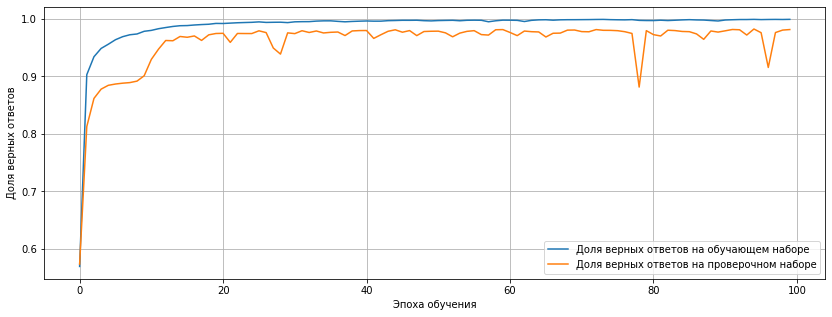

In [206]:
# Отобразим график обучения модели
plt.figure(figsize=(14, 5))
plt.plot(historyUnet_par.history['dice_coef'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(historyUnet_par.history['val_dice_coef'], 
         label='Доля верных ответов на проверочном наборе')
plt.grid(True)
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()

In [207]:
YpredUnet_par = modelUnet_par.predict([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms])
YpredUnet_par, Ytest_res_par, paragraphs_test_res_par = cleansed_data(YpredUnet_par, Ytest, paragraphs_test_2) # нехорошие данные здесь всё-таки подчищаем

Очищено фраз: 12


In [208]:
# Встроенная функция sklearn возвращает и точность и полноту по классам
print(classification_report(Ytest_res_par.argmax(axis=-1).flatten(), 
                            YpredUnet_par.argmax(axis=-1).flatten(), 
                            target_names=list(tag_tokenizer.index_word.values())))  

                   precision    recall  f1-score   support

                o       0.99      1.00      0.99     44631
      расшифровка       0.88      0.89      0.88      2045
      определение       0.94      0.91      0.92      1686
           термин       0.95      0.93      0.94       778
           связка       0.95      0.95      0.95       557
дубль-определение       0.76      0.48      0.59       147
     дубль-термин       0.86      0.77      0.81       187
     дубль-связка       0.70      0.46      0.56        65
дубль-расшифровка       0.52      0.33      0.40        80

         accuracy                           0.98     50176
        macro avg       0.84      0.75      0.78     50176
     weighted avg       0.98      0.98      0.98     50176



**Проверка тестовой выборки (насколько хорошо обучена сеть)**

In [209]:
# выбираем конкретную фразу из тестовой выборки
i = 2
print(f'{i + 1}.')
print(colorize_the_text(paragraphs_test_res_par[i], Ytest_res_par[i]))
print(colorize_the_text(paragraphs_test_res_par[i], YpredUnet_par[i]))

3.
 Ветвление — однократное выполнение одной из двух или более операций , в зависимости от выполнения заданного условия .
 Ветвление — однократное выполнение одной из двух или более операций , в зависимости от выполнения заданного условия .


In [210]:
# воспроизводим все фразы из тестовой выборки
for i, el in enumerate(paragraphs_test_res_par):
  print(f'{i+1}.')
  print(colorize_the_text(el, Ytest_res_par[i]))
  print(colorize_the_text(el, YpredUnet_par[i]))

# На github не отображается расцветка текста
# Чтобы её посмотреть, воспользуйтесь ссылкой на https://colab.research.google.com/ выше

1.
 Свойство — необходимое условие принадлежности классу .
 Свойство — необходимое условие принадлежности классу .
2.
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее понятие .
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее понятие .
3.
 Ветвление — однократное выполнение одной из двух или более операций , в зависимости от выполнения заданного условия .
 Ветвление — однократное выполнение одной из двух или более операций , в зависимости от выполнения заданного условия .
4.
 Локальные переменные – это переменные , объявленные внутри любого блока программы .
 Локальные пере

#### Simplified U-net

*Последовательная архитектура*

In [ ]:
def simpleUnet(
      num_classes = 9,
      sentence_len = 200,
      num_words = 5000,
      activation_function = 'softmax',
      embedding_size = 50
      ):
    input_pos = Input((sentence_len,))
    x_pos = Embedding(num_words, embedding_size)(input_pos)
    x_pos = Conv1D(64, 3, padding='same', name='input1_conv1')(x_pos)
    x_pos = BatchNormalization()(x_pos)
    x_pos = Activation('relu')(x_pos)

    input_case = Input((sentence_len,))
    x_case = Embedding(num_words, embedding_size)(input_case)

    input_lang = Input((sentence_len,))
    x_lang = Embedding(num_words, embedding_size)(input_lang)

    input_norms = Input((sentence_len,))
    x_norms = Embedding(num_words, embedding_size)(input_norms)

    x = concatenate([x_pos, x_case])
    x = Conv1D(128, 5, padding='same', name='input2_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, x_lang])
    x = Conv1D(128, 5, padding='same', name='input3_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, x_norms])
    x = Conv1D(128, 5, padding='same', name='input4_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # Block 1
    x = Conv1D(32, 3, padding='same', name='block1_conv1')(x) # Добавляем Conv1D-слой с 32-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(32, 3, padding='same', name='block1_conv2')(x)         # Добавляем Conv1D-слой с 32-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_1_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_1_out

    x = MaxPooling1D()(block_1_out)                                        # Добавляем слой MaxPooling1D

    # Block 2
    x = Conv1D(64, 3, padding='same', name='block2_conv1')(x)         # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same', name='block2_conv2')(x)         # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_2_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_2_out

    x = MaxPooling1D()(block_2_out)                                        # Добавляем слой MaxPooling1D
    
    # UP 1
    # x = Conv1DTranspose(x, 64, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 64 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(64, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same')(x)                              # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same')(x)                              # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    # UP 2
    # x = Conv1DTranspose(x, 32, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 32 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(32, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(32, 3, padding='same')(x)                              # Добавляем Conv1D-слой с 32-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(32, 3, padding='same')(x)                              # Добавляем Conv1D-слой с 32-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(num_classes,3, activation=activation_function, padding='same')(x) # Добавляем Conv1D-Слой с softmax-активацией на num_classes-нейронов

    model = Model([input_pos, input_case, input_lang, input_norms], x)                                   # Создаем модель со входами и выходом 'x'

    # Компилируем модель
    model.compile(optimizer=Adam(lr=1e-3),
                  loss='categorical_crossentropy',
                  metrics=[dice_coef])
    
    return model                                                           # Возвращаем модель

In [ ]:
modelS = simpleUnet(colors_count, sent_len, num_words, 'softmax', emb_size) # Создаем модель simpleUnet
plot_model(modelS, show_shapes=True)

In [ ]:
historyS = modelS.fit(x=[Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms], y=Ytrain, 
                      epochs=100, batch_size=64,
                      validation_data=([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms], Ytest))

In [ ]:
# Отобразим график обучения модели
plt.figure(figsize=(14, 5))
plt.plot(historyS.history['dice_coef'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(historyS.history['val_dice_coef'], 
         label='Доля верных ответов на проверочном наборе')
plt.grid(True)
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()

In [ ]:
YpredS = modelS.predict([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms])

In [ ]:
# Встроенная функция sklearn возвращает и точность и полноту по классам
print(classification_report(Ytest.argmax(axis=-1).flatten(), 
                            YpredS.argmax(axis=-1).flatten(), 
                            target_names=list(tag_tokenizer.index_word.values())))  

#### Simplified U-net

*Параллельная архитектура*

In [ ]:
def simpleUnet_par(
      num_classes = 9,
      sentence_len = 200,
      num_words = 5000,
      activation_function = 'softmax',
      embedding_size = 50
      ):
    # параллельная архитектура
    input_pos = Input((sentence_len,))
    x_pos = Embedding(num_words, embedding_size)(input_pos)
    x_pos = BatchNormalization()(x_pos)
    x_pos = Conv1D(64, 3, padding='same', name='input1_conv1')(x_pos)
    x_pos = Activation('relu')(x_pos)
    x_pos = Dropout(0.2)(x_pos)

    input_case = Input((sentence_len,))
    x_case = Embedding(num_words, embedding_size)(input_case)
    x_case = BatchNormalization()(x_case)
    x_case = Conv1D(64, 3, padding='same', name='input2_conv1')(x_case)
    x_case = Activation('relu')(x_case)
    x_case = Dropout(0.2)(x_case)

    input_lang = Input((sentence_len,))
    x_lang = Embedding(num_words, embedding_size)(input_lang)
    x_lang = Conv1D(64, 3, padding='same', name='input3_conv1')(x_lang)
    x_lang = BatchNormalization()(x_lang)
    x_lang = Activation('relu')(x_lang)
    x_lang = Dropout(0.2)(x_lang)

    input_norms = Input((sentence_len,))
    x_norms = Embedding(num_words, embedding_size)(input_norms)
    x_norms = Conv1D(64, 3, padding='same', name='input4_conv1')(x_norms)
    x_norms = BatchNormalization()(x_norms)
    x_norms = Activation('relu')(x_norms)
    x_norms = Dropout(0.2)(x_norms)

    x = concatenate([x_pos, x_case, x_lang, x_norms])


    # Block 1
    x = Conv1D(32, 3, padding='same', name='block1_conv1')(x) # Добавляем Conv1D-слой с 32-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(32, 3, padding='same', name='block1_conv2')(x)         # Добавляем Conv1D-слой с 32-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_1_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_1_out

    x = MaxPooling1D()(block_1_out)                                        # Добавляем слой MaxPooling1D

    # Block 2
    x = Conv1D(64, 3, padding='same', name='block2_conv1')(x)         # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same', name='block2_conv2')(x)         # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_2_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_2_out

    x = MaxPooling1D()(block_2_out)                                        # Добавляем слой MaxPooling1D
    
    # UP 1
    # x = Conv1DTranspose(x, 64, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 64 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(64, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same')(x)                              # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same')(x)                              # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    # UP 2
    # x = Conv1DTranspose(x, 32, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 32 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(32, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(32, 3, padding='same')(x)                              # Добавляем Conv1D-слой с 32-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(32, 3, padding='same')(x)                              # Добавляем Conv1D-слой с 32-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(num_classes,3, activation=activation_function, padding='same')(x) # Добавляем Conv1D-Слой с softmax-активацией на num_classes-нейронов

    model = Model([input_pos, input_case, input_lang, input_norms], x)                                   # Создаем модель со входами и выходом 'x'

    # Компилируем модель
    model.compile(optimizer=Adam(lr=1e-3),
                  loss='categorical_crossentropy',
                  metrics=[dice_coef])
    
    return model                                                           # Возвращаем модель

In [ ]:
modelS_par = simpleUnet_par(colors_count, sent_len, num_words, 'softmax', emb_size) # Создаем модель simpleUnet
plot_model(modelS_par, show_shapes=True)

In [ ]:
historyS_par = modelS_par.fit(x=[Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms], y=Ytrain, 
                      epochs=100, batch_size=64,
                      validation_data=([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms], Ytest))

In [ ]:
# Отобразим график обучения модели
plt.figure(figsize=(14, 5))
plt.plot(historyS.history['dice_coef'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(historyS.history['val_dice_coef'], 
         label='Доля верных ответов на проверочном наборе')
plt.grid(True)
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()

In [ ]:
YpredS_par = modelS_par.predict([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms])

In [ ]:
# Встроенная функция sklearn возвращает и точность и полноту по классам
print(classification_report(Ytest.argmax(axis=-1).flatten(), 
                            YpredS_par.argmax(axis=-1).flatten(), 
                            target_names=list(tag_tokenizer.index_word.values())))  

#### Extended U-net

*Последовательная архитектура*

In [ ]:
def unetWithMask(
      num_classes = 9,
      sentence_len = 200,
      num_words = 5000,
      activation_function = 'softmax',
      embedding_size = 50
      ):
    input_pos = Input((sentence_len,))
    x_pos = Embedding(num_words, embedding_size)(input_pos)
    x_pos = Conv1D(64, 3, padding='same', name='input1_conv1')(x_pos)
    x_pos = BatchNormalization()(x_pos)
    x_pos = Activation('relu')(x_pos)

    input_case = Input((sentence_len,))
    x_case = Embedding(num_words, embedding_size)(input_case)

    input_lang = Input((sentence_len,))
    x_lang = Embedding(num_words, embedding_size)(input_lang)

    input_norms = Input((sentence_len,))
    x_norms = Embedding(num_words, embedding_size)(input_norms)

    x = concatenate([x_pos, x_case])
    x = Conv1D(128, 5, padding='same', name='input2_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, x_lang])
    x = Conv1D(128, 5, padding='same', name='input3_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, x_norms])
    x = Conv1D(128, 5, padding='same', name='input4_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # Block 1
    x = Conv1D(64, 3, padding='same', name='block1_conv1')(x) # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same', name='block1_conv2')(x)      # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    block_1_out = Activation('relu')(x)                                 # Добавляем слой Activation и запоминаем в переменной block_1_out
    
    block_1_out_mask = Conv1D(64, 1, padding='same')(block_1_out)  # Добавляем Conv1D-маску к текущему слою и запоминаем в переменную block_1_out_mask

    x = MaxPooling1D()(block_1_out) # Добавляем слой MaxPooling1D

    # Block 2
    x = Conv1D(128, 3, padding='same', name='block2_conv1')(x)     # Добавляем Conv1D-слой с 128-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x) # Добавляем слой Activation

    x = Conv1D(128, 3, padding='same', name='block2_conv2')(x)     # Добавляем Conv1D-слой с 128-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    block_2_out = Activation('relu')(x)                                 # Добавляем слой Activation и запоминаем в переменной block_2_out

    block_2_out_mask = Conv1D(128, 1, padding='same')(block_2_out) # Добавляем Conv1D-маску к текущему слою и запоминаем в переменную block_2_out_mask
    
    x = MaxPooling1D()(block_2_out)                                     # Добавляем слой MaxPooling1D

    # Block 3
    x = Conv1D(256, 3, padding='same', name='block3_conv1')(x)     # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same', name='block3_conv2')(x)     # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same', name='block3_conv3')(x)     # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    block_3_out = Activation('relu')(x)                                 # Добавляем слой Activation и запоминаем в переменной block_3_out

    block_3_out_mask = Conv1D(256, 1, padding='same')(block_3_out) # Добавляем Conv1D-маску к текущему слою и запоминаем в переменную block_3_out_mask
        
    x = MaxPooling1D()(block_3_out)                                     # Добавляем слой MaxPooling1D

     # Block 4
    x = Conv1D(512, 3, padding='same', name='block4_conv1')(x)     # Добавляем Conv1D-слой с 512-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block4_conv2')(x)     # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block4_conv3')(x)     # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    block_4_out = Activation('relu')(x)                                 # Добавляем слой Activation и запоминаем в переменной block_4_out

    block_4_out_mask = Conv1D(512, 1, padding='same')(block_4_out) # Добавляем Conv1D-маску к текущему слою и запоминаем в переменную block_4_out_mask
            
    x = MaxPooling1D()(block_4_out)                                     # Добавляем слой MaxPooling1D

    # Block 5
    x = Conv1D(512, 3, padding='same', name='block5_conv1')(x)     # Добавляем Conv1D-слой с 512-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block5_conv2')(x)     # Добавляем Conv1D-слой с 512-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block5_conv3')(x)     # Добавляем Conv1D-слой с 512-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation
    
    for_pretrained_weight = MaxPooling1D()(x)                           # Добавляем слой MaxPooling1D
 
    # UP 1
    # x = Conv1DTranspose(x, 512, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 512 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(512, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = concatenate([x, block_4_out, block_4_out_mask])                 # Объединем текущий слой со слоем block_4_out и слоем-маской block_4_out_mask
    x = Conv1D(512, 3, padding='same')(x)                          # Добавляем слой Conv1D с 512 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same')(x)                          # Добавляем слой Conv1D с 512 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    # UP 2
    # x = Conv1DTranspose(x, 256, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 256 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(256, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = concatenate([x, block_3_out, block_3_out_mask])                 # Объединем текущий слой со слоем block_3_out и слоем-маской block_3_out_mask
    x = Conv1D(256, 3, padding='same')(x)                          # Добавляем слой Conv1D с 256 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same')(x)                          # Добавляем слой Conv1D с 256 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    # UP 3
    # x = Conv1DTranspose(x, 128, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 128 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(128, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = concatenate([x, block_2_out, block_2_out_mask])                 # Объединем текущий слой со слоем block_2_out и слоем-маской block_2_out_mask
    x = Conv1D(128, 3, padding='same')(x)                          # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(128, 3, padding='same')(x)                          # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    # UP 4
    # x = Conv1DTranspose(x, 64, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 64 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(64, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                        # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                          # Добавляем слой Activation

    x = concatenate([x, block_1_out, block_1_out_mask])                # Объединем текущий слой со слоем block_1_out и слоем-маской block_1_out_mask
    x = Conv1D(64, 3, padding='same')(x)                          # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x)                                        # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                          # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same')(x)                          # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x)                                        # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                          # Добавляем слой Activation

    x = Conv1D(num_classes, 3, activation=activation_function, padding='same')(x) # Добавляем Conv1D-Слой с softmax-активацией на num_classes-нейронов

    model = Model([input_pos, input_case, input_lang, input_norms], x)                                   # Создаем модель со входами и выходом 'x'

    # Компилируем модель 
    model.compile(optimizer=Adam(),
                  loss='categorical_crossentropy',
                  metrics=[dice_coef])
    
    return model                                                       # Возвращаем сформированную модель

In [ ]:
modelM3 = unetWithMask(colors_count, sent_len, num_words, 'sigmoid', emb_size) # Создаем модель unetWithMask
plot_model(modelM3, show_shapes=True)

In [ ]:
historyM3 = modelM3.fit(x=[Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms], y=Ytrain, 
                        epochs=100, batch_size=64,
                        validation_data=([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms], Ytest))

In [ ]:
# Отобразим график обучения модели
plt.figure(figsize=(14, 5))
plt.plot(historyM3.history['dice_coef'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(historyM3.history['val_dice_coef'], 
         label='Доля верных ответов на проверочном наборе')
plt.grid(True)
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()

In [ ]:
YpredM3 = modelM3.predict([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms])

In [ ]:
# Встроенная функция sklearn возвращает и точность и полноту по классам
print(classification_report(Ytest.argmax(axis=-1).flatten(), 
                            YpredM3.argmax(axis=-1).flatten(), 
                            target_names=list(tag_tokenizer.index_word.values())))  

**Проверка тестовой выборки (насколько хорошо обучена сеть)**

In [ ]:
# выбираем конкретную фразу из тестовой выборки
i = 2
print(f'{i + 1}.')
print(colorize_the_text(paragraphs_test_2[i], Ytest[i]))
print(colorize_the_text(paragraphs_test_2[i], YpredM3[i]))

In [ ]:
# воспроизводим все фразы из тестовой выборки
for i, el in enumerate(paragraphs_test_2):
  print(f'{i+1}.')
  print(colorize_the_text(el, Ytest[i]))
  print(colorize_the_text(el, YpredM3[i]))

# На github не отображается расцветка текста
# Чтобы её посмотреть, воспользуйтесь ссылкой на https://colab.research.google.com/ выше

#### Extended U-net

*Параллельная архитектура*

In [ ]:
def unetWithMask_par(
      num_classes = 9,
      sentence_len = 200,
      num_words = 5000,
      activation_function = 'softmax',
      embedding_size = 50
      ):
    # параллельная архитектура
    input_pos = Input((sentence_len,))
    x_pos = Embedding(num_words, embedding_size)(input_pos)
    x_pos = BatchNormalization()(x_pos)
    x_pos = Conv1D(64, 3, padding='same', name='input1_conv1')(x_pos)
    x_pos = Activation('relu')(x_pos)
    x_pos = Dropout(0.2)(x_pos)

    input_case = Input((sentence_len,))
    x_case = Embedding(num_words, embedding_size)(input_case)
    x_case = BatchNormalization()(x_case)
    x_case = Conv1D(64, 3, padding='same', name='input2_conv1')(x_case)
    x_case = Activation('relu')(x_case)
    x_case = Dropout(0.2)(x_case)

    input_lang = Input((sentence_len,))
    x_lang = Embedding(num_words, embedding_size)(input_lang)
    x_lang = Conv1D(64, 3, padding='same', name='input3_conv1')(x_lang)
    x_lang = BatchNormalization()(x_lang)
    x_lang = Activation('relu')(x_lang)
    x_lang = Dropout(0.2)(x_lang)

    input_norms = Input((sentence_len,))
    x_norms = Embedding(num_words, embedding_size)(input_norms)
    x_norms = Conv1D(64, 3, padding='same', name='input4_conv1')(x_norms)
    x_norms = BatchNormalization()(x_norms)
    x_norms = Activation('relu')(x_norms)
    x_norms = Dropout(0.2)(x_norms)

    x = concatenate([x_pos, x_case, x_lang, x_norms])

    # Block 1
    x = Conv1D(64, 3, padding='same', name='block1_conv1')(x) # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same', name='block1_conv2')(x)      # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    block_1_out = Activation('relu')(x)                                 # Добавляем слой Activation и запоминаем в переменной block_1_out
    
    block_1_out_mask = Conv1D(64, 1, padding='same')(block_1_out)  # Добавляем Conv1D-маску к текущему слою и запоминаем в переменную block_1_out_mask

    x = MaxPooling1D()(block_1_out) # Добавляем слой MaxPooling1D

    # Block 2
    x = Conv1D(128, 3, padding='same', name='block2_conv1')(x)     # Добавляем Conv1D-слой с 128-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x) # Добавляем слой Activation

    x = Conv1D(128, 3, padding='same', name='block2_conv2')(x)     # Добавляем Conv1D-слой с 128-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    block_2_out = Activation('relu')(x)                                 # Добавляем слой Activation и запоминаем в переменной block_2_out

    block_2_out_mask = Conv1D(128, 1, padding='same')(block_2_out) # Добавляем Conv1D-маску к текущему слою и запоминаем в переменную block_2_out_mask
    
    x = MaxPooling1D()(block_2_out)                                     # Добавляем слой MaxPooling1D

    # Block 3
    x = Conv1D(256, 3, padding='same', name='block3_conv1')(x)     # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same', name='block3_conv2')(x)     # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same', name='block3_conv3')(x)     # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    block_3_out = Activation('relu')(x)                                 # Добавляем слой Activation и запоминаем в переменной block_3_out

    block_3_out_mask = Conv1D(256, 1, padding='same')(block_3_out) # Добавляем Conv1D-маску к текущему слою и запоминаем в переменную block_3_out_mask
        
    x = MaxPooling1D()(block_3_out)                                     # Добавляем слой MaxPooling1D

     # Block 4
    x = Conv1D(512, 3, padding='same', name='block4_conv1')(x)     # Добавляем Conv1D-слой с 512-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block4_conv2')(x)     # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block4_conv3')(x)     # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    block_4_out = Activation('relu')(x)                                 # Добавляем слой Activation и запоминаем в переменной block_4_out

    block_4_out_mask = Conv1D(512, 1, padding='same')(block_4_out) # Добавляем Conv1D-маску к текущему слою и запоминаем в переменную block_4_out_mask
            
    x = MaxPooling1D()(block_4_out)                                     # Добавляем слой MaxPooling1D

    # Block 5
    x = Conv1D(512, 3, padding='same', name='block5_conv1')(x)     # Добавляем Conv1D-слой с 512-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block5_conv2')(x)     # Добавляем Conv1D-слой с 512-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block5_conv3')(x)     # Добавляем Conv1D-слой с 512-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation
    
    for_pretrained_weight = MaxPooling1D()(x)                           # Добавляем слой MaxPooling1D
 
    # UP 1
    # x = Conv1DTranspose(x, 512, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 512 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(512, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = concatenate([x, block_4_out, block_4_out_mask])                 # Объединем текущий слой со слоем block_4_out и слоем-маской block_4_out_mask
    x = Conv1D(512, 3, padding='same')(x)                          # Добавляем слой Conv1D с 512 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same')(x)                          # Добавляем слой Conv1D с 512 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    # UP 2
    # x = Conv1DTranspose(x, 256, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 256 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(256, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = concatenate([x, block_3_out, block_3_out_mask])                 # Объединем текущий слой со слоем block_3_out и слоем-маской block_3_out_mask
    x = Conv1D(256, 3, padding='same')(x)                          # Добавляем слой Conv1D с 256 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same')(x)                          # Добавляем слой Conv1D с 256 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    # UP 3
    # x = Conv1DTranspose(x, 128, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 128 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(128, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = concatenate([x, block_2_out, block_2_out_mask])                 # Объединем текущий слой со слоем block_2_out и слоем-маской block_2_out_mask
    x = Conv1D(128, 3, padding='same')(x)                          # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(128, 3, padding='same')(x)                          # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    # UP 4
    # x = Conv1DTranspose(x, 64, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 64 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(64, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                        # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                          # Добавляем слой Activation

    x = concatenate([x, block_1_out, block_1_out_mask])                # Объединем текущий слой со слоем block_1_out и слоем-маской block_1_out_mask
    x = Conv1D(64, 3, padding='same')(x)                          # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x)                                        # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                          # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same')(x)                          # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x)                                        # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                          # Добавляем слой Activation

    x = Conv1D(num_classes, 3, activation=activation_function, padding='same')(x) # Добавляем Conv1D-Слой с softmax-активацией на num_classes-нейронов

    model = Model([input_pos, input_case, input_lang, input_norms], x)                                   # Создаем модель со входами и выходом 'x'

    # Компилируем модель 
    model.compile(optimizer=Adam(),
                  loss='categorical_crossentropy',
                  metrics=[dice_coef])
    
    return model                                                       # Возвращаем сформированную модель

In [ ]:
modelM3_par = unetWithMask_par(colors_count, sent_len, num_words, 'sigmoid', emb_size) # Создаем модель unetWithMask
plot_model(modelM3_par, show_shapes=True)

In [ ]:
historyM3_par = modelM3_par.fit(x=[Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms], y=Ytrain, 
                        epochs=100, batch_size=64,
                        validation_data=([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms], Ytest))

In [ ]:
# Отобразим график обучения модели
plt.figure(figsize=(14, 5))
plt.plot(historyM3_par.history['dice_coef'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(historyM3_par.history['val_dice_coef'], 
         label='Доля верных ответов на проверочном наборе')
plt.grid(True)
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()

In [ ]:
YpredM3_par = modelM3_par.predict([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms])

In [ ]:
# Встроенная функция sklearn возвращает и точность и полноту по классам
print(classification_report(Ytest.argmax(axis=-1).flatten(), 
                            YpredM3_par.argmax(axis=-1).flatten(), 
                            target_names=list(tag_tokenizer.index_word.values())))  

**Проверка тестовой выборки (насколько хорошо обучена сеть)**

In [ ]:
# выбираем конкретную фразу из тестовой выборки
i = 2
print(f'{i + 1}.')
print(colorize_the_text(paragraphs_test_2[i], Ytest[i]))
print(colorize_the_text(paragraphs_test_2[i], YpredM3_par[i]))

In [ ]:
# воспроизводим все фразы из тестовой выборки
for i, el in enumerate(paragraphs_test_2):
  print(f'{i+1}.')
  print(colorize_the_text(el, Ytest[i]))
  print(colorize_the_text(el, YpredM3_par[i]))

# На github не отображается расцветка текста
# Чтобы её посмотреть, воспользуйтесь ссылкой на https://colab.research.google.com/ выше